In [1]:
from multi_imbalance.datasets import load_datasets
import experiment as ex
from sklearn.model_selection import StratifiedKFold
from collections import Counter, defaultdict
from multi_imbalance.utils.metrics import gmean_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
import pandas as pd
from sklearn.tree import DecisionTreeClassifier
from utils import plot_embeddings
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.datasets.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
datasets = load_datasets()

In [3]:
ds_name = 'balance-scale'
test_on_all_folds = True
test_all_ds = True

In [4]:
datasets = ex.one_hot_encode_all(datasets)

In [5]:
config = ex.config_calculation_strategy2(datasets)

In [6]:
config['cmc'] = {'nn_config': {'units_1st_layer': 17,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 8},
 'weighted_triplet_loss': True,
 'lr': 0.0001,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['dermatology'] = {'nn_config': {'units_1st_layer': 97,
   'units_2nd_layer': 512,
   'units_3rd_layer': 256,
   'units_latent_layer': 16},
  'weighted_triplet_loss': True,
  'lr': 0.0015,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 150}

config['hayes-roth'] = {'nn_config': {'units_1st_layer': 11,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 16},
 'weighted_triplet_loss': True,
 'lr': 0.0015,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 300}

config['new_vehicle'] = {'nn_config': {'units_1st_layer': 18,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 16},
 'weighted_triplet_loss': True,
 'lr': 0.003,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['new_yeast'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 300,
  'units_3rd_layer': 200,
  'units_latent_layer': 12},
 'weighted_triplet_loss': True,
 'lr': 0.0004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['balance-scale'] = {'nn_config': {'units_1st_layer': 16,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 10},
 'weighted_triplet_loss': True,
 'lr': 0.004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 200}

config['cleveland'] = {'nn_config': {'units_1st_layer': 24,
                                     'units_2nd_layer': 128,
                                     'units_3rd_layer': 64,
                                     'units_latent_layer': 20},
                       'weighted_triplet_loss': True,
                       'lr': 0.00002,
                       'batch_size': 16,
                       'gamma': 0.99,
                       'epochs': 120}

config['cleveland_v2'] = {'nn_config': {'units_1st_layer': 23,
                                        'units_2nd_layer': 256,
                                        'units_3rd_layer': 128,
                                        'units_latent_layer': 20},
                          'weighted_triplet_loss': True,
                          'lr': 0.00002,
                          'batch_size': 16,
                          'gamma': 0.99,
                          'epochs': 100}

config['glass'] = {'nn_config': {'units_1st_layer': 9,
  'units_2nd_layer': 256,
  'units_3rd_layer': 128,
  'units_latent_layer': 12},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 150}

config['thyroid-newthyroid'] = {'nn_config': {'units_1st_layer': 5,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 8},
 'weighted_triplet_loss': True,
 'lr': 0.004,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 150}

config['new_ecoli'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 128,
  'units_3rd_layer': 64,
  'units_latent_layer': 12},
 'weighted_triplet_loss': True,
 'lr': 0.0005,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['new_led7digit'] = {'nn_config': {'units_1st_layer': 7,
  'units_2nd_layer': 64,
  'units_3rd_layer': 32,
  'units_latent_layer': 8},
 'weighted_triplet_loss': True,
 'lr': 0.001,
 'batch_size': 16,
 'gamma': 0.99,
 'epochs': 100}

config['new_winequality-red'] = {'nn_config': {'units_1st_layer': 11,
                                               'units_2nd_layer': 128,
                                               'units_3rd_layer': 64,
                                               'units_latent_layer': 12},
                                 'weighted_triplet_loss': True,
                                 'lr': 0.003,
                                 'batch_size': 16,
                                 'gamma': 0.99,
                                 'epochs': 100}

config['4delikatne-bezover-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

config['3mocniej-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 10},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

config['1czysty-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

config['2delikatne-cut'] = {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 12},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100}

In [7]:
config

{'1czysty-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 64,
   'units_3rd_layer': 32,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 '2delikatne-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 12},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 '3mocniej-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 10},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 '4delikatne-bezover-cut': {'nn_config': {'units_1st_layer': 2,
   'units_2nd_layer': 128,
   'units_3rd_layer': 64,
   'units_latent_layer': 8},
  'weighted_triplet_loss': True,
  'lr': 0.003,
  'batch_size': 16,
  'gamma': 0.99,
  'epochs': 100},
 'balance-scale': {'nn_config': 

In [8]:
def instantiate_classifiers():
    classifiers = {
            "RF24": RandomForestClassifier(random_state=0, min_samples_leaf=2, min_samples_split=4, class_weight='balanced'),
            "DT": DecisionTreeClassifier(random_state=0, min_samples_split=4, min_samples_leaf=2, class_weight='balanced'),
            "KNN": KNeighborsClassifier(n_neighbors=1),
            "QDA": QuadraticDiscriminantAnalysis(),
            "LDA": LinearDiscriminantAnalysis()
        } 
    return classifiers

In [9]:
from experiment import dt_name_to_cols_to_encode


In [10]:
from sklearn.neighbors import KNeighborsClassifier

def calc_safety5(X,y):
    result = defaultdict(int)
    neigh = KNeighborsClassifier(n_neighbors=5)
    neigh.fit(X, y)
    neighbors = neigh.kneighbors(X, 5+1, False)
    for i, (x, nbors) in enumerate(list(zip(X, neighbors))):
#         print(x)
#         print(y[i])
#         print(nbors[1:])
#         print(y[nbors[1:]])
        same_class_nbrs = (y[nbors[1:]] == y[i]).sum()
        if same_class_nbrs >= 4:
            result['safe'] += 1
        elif same_class_nbrs >= 2:
            result['borderline'] += 1
        elif same_class_nbrs == 1:
            result['rare'] += 1
        else:
            result['outlier'] += 1
    return result

In [11]:
def standardize(X_train, X_test):
    means = X_train.mean(axis=0)
    stds = X_train.std(axis=0)
    return (X_train - means) / (stds+1e-6), (X_test - means) / (stds + 1e-6)

cmc


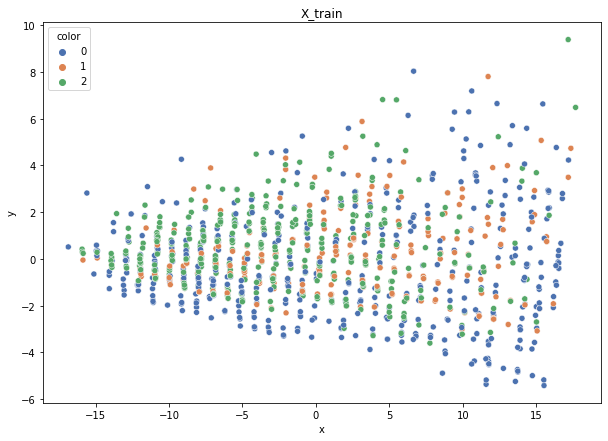

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


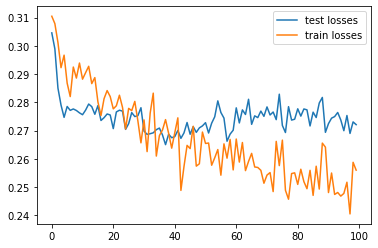

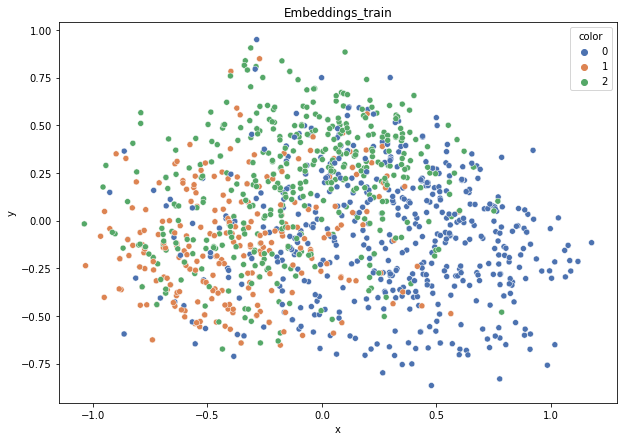

DT-f1-new-features: 0.458
DT-f1-old+new-features: 0.445
DT-f1-old-features: 0.469
DT-gmean-new-features: 0.463
DT-gmean-old+new-features: 0.449
DT-gmean-old-features: 0.467
KNN-f1-new-features: 0.445
KNN-f1-old+new-features: 0.428
KNN-f1-old-features: 0.431
KNN-gmean-new-features: 0.443
KNN-gmean-old+new-features: 0.423
KNN-gmean-old-features: 0.425
LDA-f1-new-features: 0.524
LDA-f1-old+new-features: 0.51
LDA-f1-old-features: 0.482
LDA-gmean-new-features: 0.527
LDA-gmean-old+new-features: 0.509
LDA-gmean-old-features: 0.47
QDA-f1-new-features: 0.513
QDA-f1-old+new-features: 0.498
QDA-f1-old-features: 0.483
QDA-gmean-new-features: 0.522
QDA-gmean-old+new-features: 0.507
QDA-gmean-old-features: 0.496
RF24-f1-new-features: 0.505
RF24-f1-old+new-features: 0.517
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.505
RF24-gmean-old+new-features: 0.516
RF24-gmean-old-features: 0.523


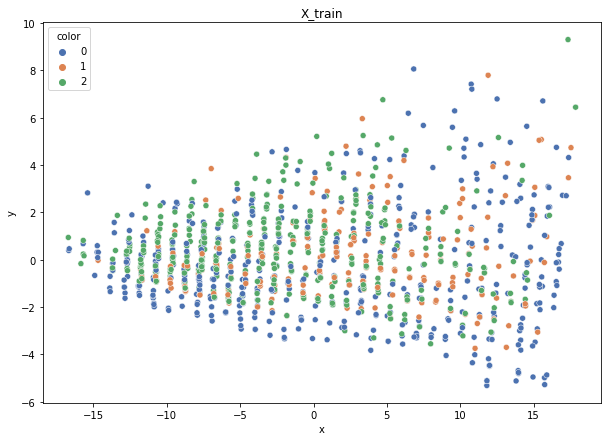

Class cardinalities: Counter({0: 503, 2: 409, 1: 266})
Weights: {0: 0.2426709552796112, 1: 0.45888530265279864, 2: 0.29844374206759033}


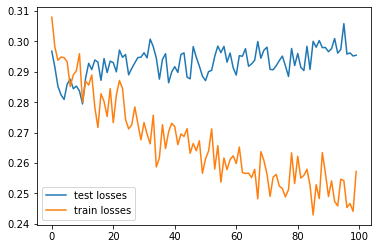

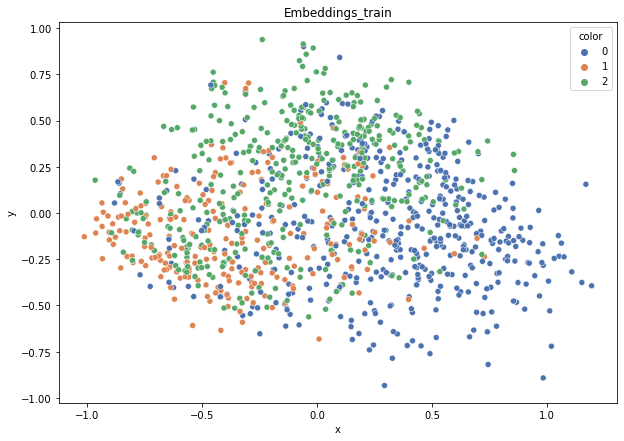

DT-f1-new-features: 0.464
DT-f1-old+new-features: 0.467
DT-f1-old-features: 0.491
DT-gmean-new-features: 0.468
DT-gmean-old+new-features: 0.471
DT-gmean-old-features: 0.503
KNN-f1-new-features: 0.431
KNN-f1-old+new-features: 0.448
KNN-f1-old-features: 0.443
KNN-gmean-new-features: 0.417
KNN-gmean-old+new-features: 0.44
KNN-gmean-old-features: 0.433
LDA-f1-new-features: 0.518
LDA-f1-old+new-features: 0.509
LDA-f1-old-features: 0.501
LDA-gmean-new-features: 0.513
LDA-gmean-old+new-features: 0.501
LDA-gmean-old-features: 0.49
QDA-f1-new-features: 0.514
QDA-f1-old+new-features: 0.52
QDA-f1-old-features: 0.513
QDA-gmean-new-features: 0.512
QDA-gmean-old+new-features: 0.531
QDA-gmean-old-features: 0.528
RF24-f1-new-features: 0.514
RF24-f1-old+new-features: 0.502
RF24-f1-old-features: 0.508
RF24-gmean-new-features: 0.514
RF24-gmean-old+new-features: 0.503
RF24-gmean-old-features: 0.512


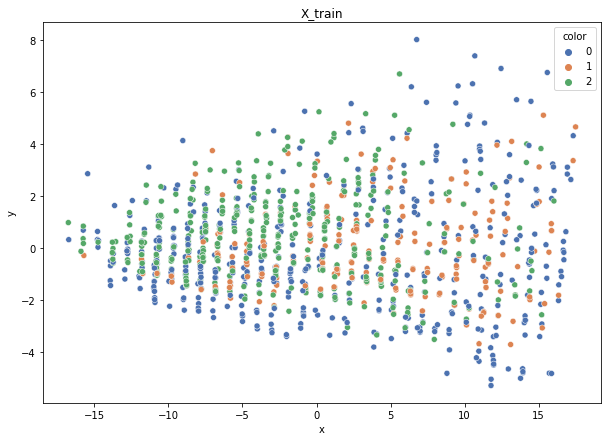

Class cardinalities: Counter({0: 503, 2: 408, 1: 267})
Weights: {0: 0.2429107547813522, 1: 0.45761838822104933, 2: 0.29947085699759846}


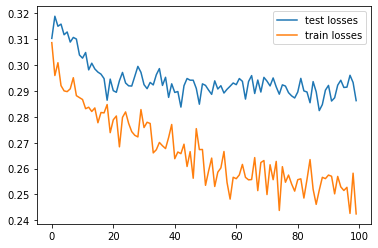

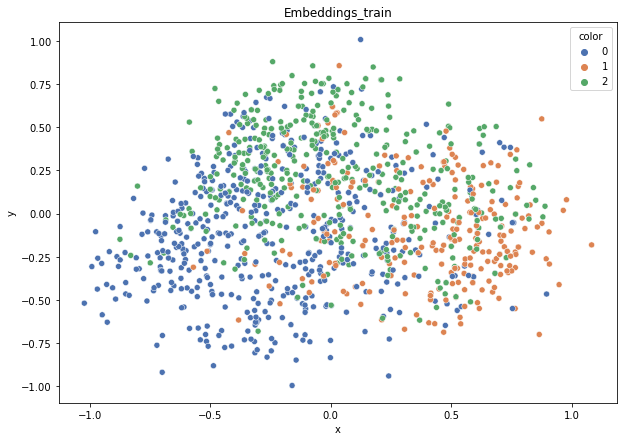

DT-f1-new-features: 0.476
DT-f1-old+new-features: 0.472
DT-f1-old-features: 0.462
DT-gmean-new-features: 0.479
DT-gmean-old+new-features: 0.473
DT-gmean-old-features: 0.46
KNN-f1-new-features: 0.456
KNN-f1-old+new-features: 0.413
KNN-f1-old-features: 0.413
KNN-gmean-new-features: 0.44
KNN-gmean-old+new-features: 0.399
KNN-gmean-old-features: 0.399
LDA-f1-new-features: 0.495
LDA-f1-old+new-features: 0.482
LDA-f1-old-features: 0.447
LDA-gmean-new-features: 0.488
LDA-gmean-old+new-features: 0.475
LDA-gmean-old-features: 0.425
QDA-f1-new-features: 0.495
QDA-f1-old+new-features: 0.485
QDA-f1-old-features: 0.486
QDA-gmean-new-features: 0.486
QDA-gmean-old+new-features: 0.489
QDA-gmean-old-features: 0.493
RF24-f1-new-features: 0.505
RF24-f1-old+new-features: 0.499
RF24-f1-old-features: 0.519
RF24-gmean-new-features: 0.498
RF24-gmean-old+new-features: 0.494
RF24-gmean-old-features: 0.513


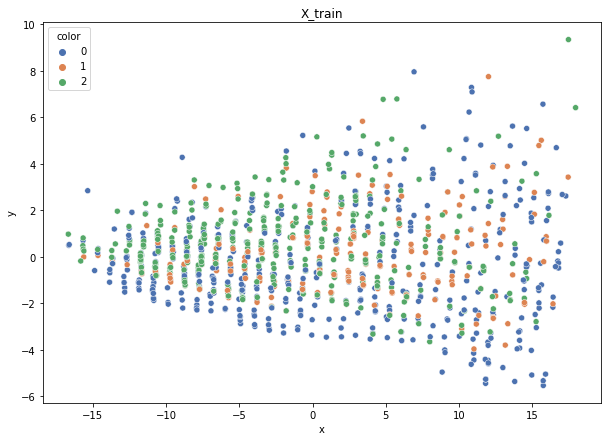

Class cardinalities: Counter({0: 503, 2: 409, 1: 267})
Weights: {0: 0.24308874498865835, 1: 0.4579537031059744, 2: 0.29895755190536716}


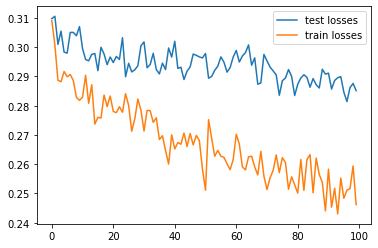

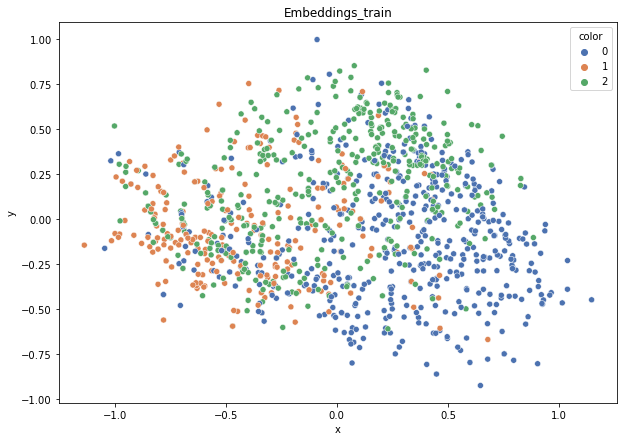

DT-f1-new-features: 0.449
DT-f1-old+new-features: 0.471
DT-f1-old-features: 0.44
DT-gmean-new-features: 0.442
DT-gmean-old+new-features: 0.468
DT-gmean-old-features: 0.438
KNN-f1-new-features: 0.455
KNN-f1-old+new-features: 0.418
KNN-f1-old-features: 0.418
KNN-gmean-new-features: 0.451
KNN-gmean-old+new-features: 0.412
KNN-gmean-old-features: 0.413
LDA-f1-new-features: 0.526
LDA-f1-old+new-features: 0.508
LDA-f1-old-features: 0.485
LDA-gmean-new-features: 0.505
LDA-gmean-old+new-features: 0.488
LDA-gmean-old-features: 0.451
QDA-f1-new-features: 0.536
QDA-f1-old+new-features: 0.505
QDA-f1-old-features: 0.516
QDA-gmean-new-features: 0.531
QDA-gmean-old+new-features: 0.512
QDA-gmean-old-features: 0.524
RF24-f1-new-features: 0.481
RF24-f1-old+new-features: 0.51
RF24-f1-old-features: 0.509
RF24-gmean-new-features: 0.468
RF24-gmean-old+new-features: 0.5
RF24-gmean-old-features: 0.497


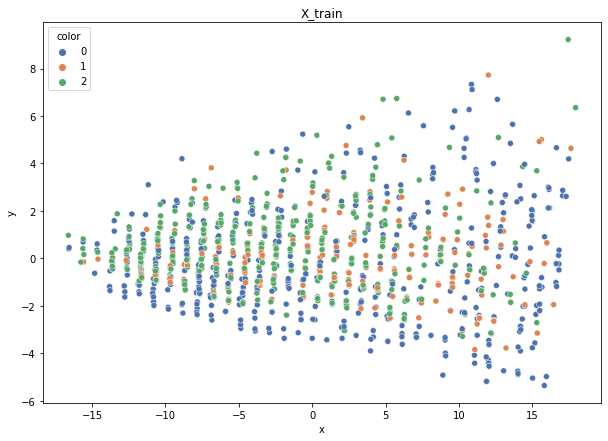

Class cardinalities: Counter({0: 504, 2: 409, 1: 266})
Weights: {0: 0.24230613326681422, 1: 0.4591063577687006, 2: 0.29858750896448505}


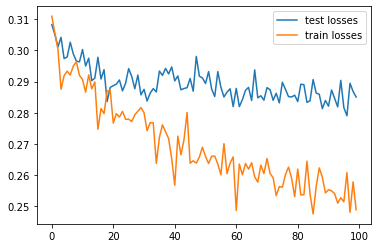

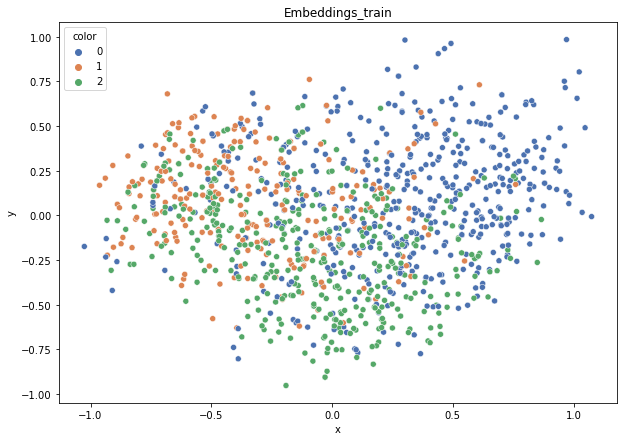

DT-f1-new-features: 0.421
DT-f1-old+new-features: 0.473
DT-f1-old-features: 0.473
DT-gmean-new-features: 0.423
DT-gmean-old+new-features: 0.471
DT-gmean-old-features: 0.483
KNN-f1-new-features: 0.454
KNN-f1-old+new-features: 0.408
KNN-f1-old-features: 0.408
KNN-gmean-new-features: 0.446
KNN-gmean-old+new-features: 0.394
KNN-gmean-old-features: 0.394
LDA-f1-new-features: 0.571
LDA-f1-old+new-features: 0.536
LDA-f1-old-features: 0.527
LDA-gmean-new-features: 0.559
LDA-gmean-old+new-features: 0.519
LDA-gmean-old-features: 0.509
QDA-f1-new-features: 0.522
QDA-f1-old+new-features: 0.518
QDA-f1-old-features: 0.542
QDA-gmean-new-features: 0.527
QDA-gmean-old+new-features: 0.529
QDA-gmean-old-features: 0.557
RF24-f1-new-features: 0.536
RF24-f1-old+new-features: 0.518
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.53
RF24-gmean-old+new-features: 0.509
RF24-gmean-old-features: 0.518
dermatology


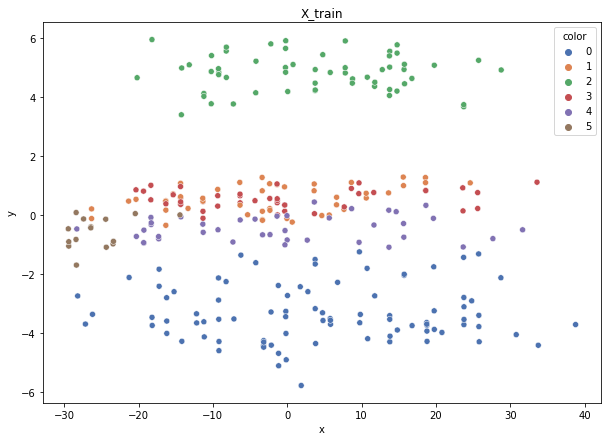

Class cardinalities: Counter({0: 90, 2: 58, 1: 48, 4: 41, 3: 39, 5: 16})
Weights: {1: 0.1288257963857323, 0: 0.0687070914057239, 2: 0.10661445218129569, 4: 0.15082044454915, 3: 0.1585548263209013, 5: 0.38647738915719687}


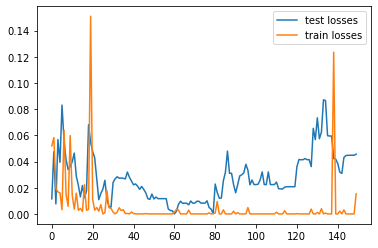

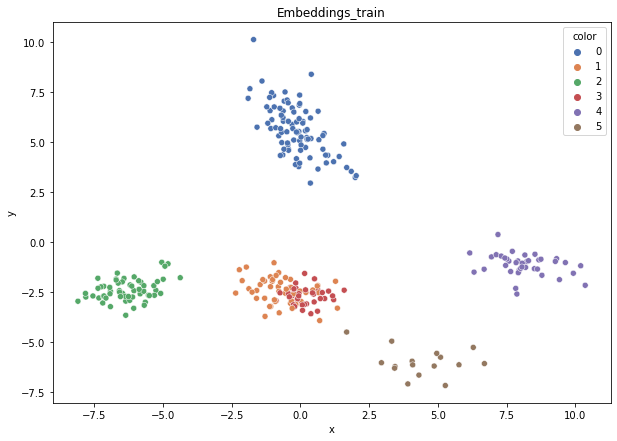

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.93
DT-f1-old+new-features: 0.93
DT-f1-old-features: 0.914
DT-gmean-new-features: 0.922
DT-gmean-old+new-features: 0.922
DT-gmean-old-features: 0.911
KNN-f1-new-features: 0.93
KNN-f1-old+new-features: 0.959
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 0.922
KNN-gmean-old+new-features: 0.957
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.959
LDA-f1-old+new-features: 0.945
LDA-f1-old-features: 0.943
LDA-gmean-new-features: 0.957
LDA-gmean-old+new-features: 0.941
LDA-gmean-old-features: 0.942
QDA-f1-new-features: 0.744
QDA-f1-old+new-features: 0.856
QDA-f1-old-features: 0.749
QDA-gmean-new-features: 0.29
QDA-gmean-old+new-features: 0.886
QDA-gmean-old-features: 0.74
RF24-f1-new-features: 0.899
RF24-f1-old+new-features: 0.93
RF24-f1-old-features: 0.959
RF24-gmean-new-features: 0.879
RF24-gmean-old+new-features: 0.922
RF24-gmean-old-features: 0.957


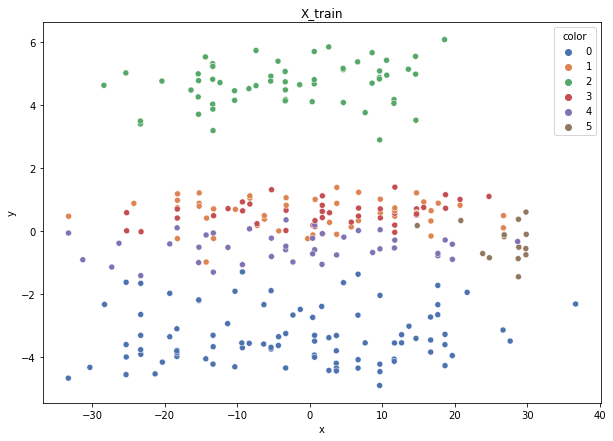

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 41, 3: 40, 5: 16})
Weights: {1: 0.1269355878601628, 2: 0.10723868629565478, 0: 0.06988588545110087, 4: 0.1517035074426336, 3: 0.15549609512869944, 5: 0.3887402378217486}


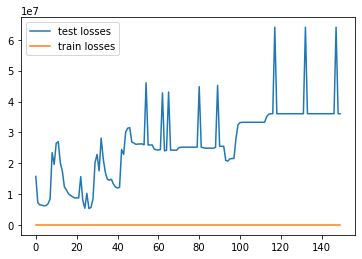

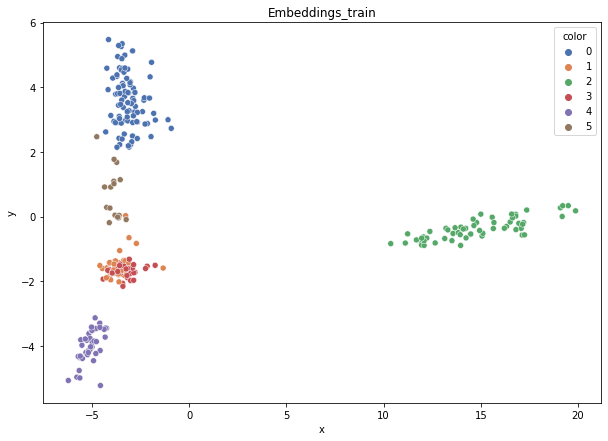

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.923
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.955
DT-gmean-new-features: 0.919
DT-gmean-old+new-features: 0.919
DT-gmean-old-features: 0.955
KNN-f1-new-features: 0.968
KNN-f1-old+new-features: 0.968
KNN-f1-old-features: 0.952
KNN-gmean-new-features: 0.966
KNN-gmean-old+new-features: 0.966
KNN-gmean-old-features: 0.951
LDA-f1-new-features: 0.968
LDA-f1-old+new-features: 0.951
LDA-f1-old-features: 0.968
LDA-gmean-new-features: 0.966
LDA-gmean-old+new-features: 0.945
LDA-gmean-old-features: 0.97
QDA-f1-new-features: 0.771
QDA-f1-old+new-features: 0.904
QDA-f1-old-features: 0.786
QDA-gmean-new-features: 0.299
QDA-gmean-old+new-features: 0.907
QDA-gmean-old-features: 0.766
RF24-f1-new-features: 0.952
RF24-f1-old+new-features: 0.952
RF24-f1-old-features: 0.984
RF24-gmean-new-features: 0.951
RF24-gmean-old+new-features: 0.951
RF24-gmean-old-features: 0.986


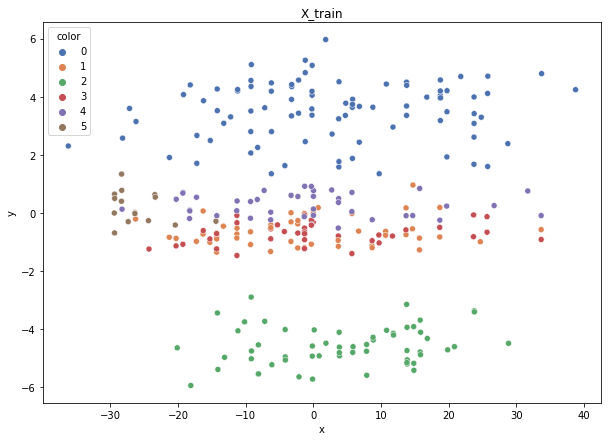

Class cardinalities: Counter({0: 89, 2: 58, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {0: 0.06985968170695418, 2: 0.10719847710205038, 4: 0.14803599218854577, 3: 0.15942337620304928, 1: 0.1268879933044678, 5: 0.38859447949493264}


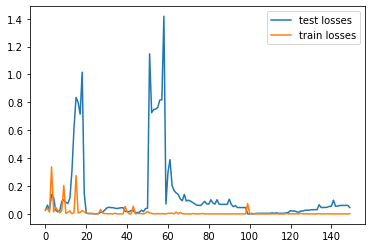

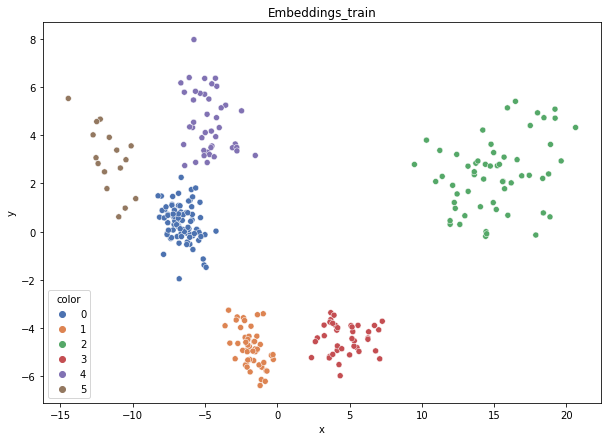

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.937
DT-f1-old+new-features: 0.913
DT-f1-old-features: 0.945
DT-gmean-new-features: 0.935
DT-gmean-old+new-features: 0.921
DT-gmean-old-features: 0.953
KNN-f1-new-features: 0.942
KNN-f1-old+new-features: 0.942
KNN-f1-old-features: 0.906
KNN-gmean-new-features: 0.935
KNN-gmean-old+new-features: 0.935
KNN-gmean-old-features: 0.891
LDA-f1-new-features: 0.954
LDA-f1-old+new-features: 0.943
LDA-f1-old-features: 0.922
LDA-gmean-new-features: 0.95
LDA-gmean-old+new-features: 0.95
LDA-gmean-old-features: 0.913
QDA-f1-new-features: 0.739
QDA-f1-old+new-features: 0.879
QDA-f1-old-features: 0.865
QDA-gmean-new-features: 0.29
QDA-gmean-old+new-features: 0.864
QDA-gmean-old-features: 0.861
RF24-f1-new-features: 0.927
RF24-f1-old+new-features: 0.927
RF24-f1-old-features: 0.909
RF24-gmean-new-features: 0.935
RF24-gmean-old+new-features: 0.935
RF24-gmean-old-features: 0.905


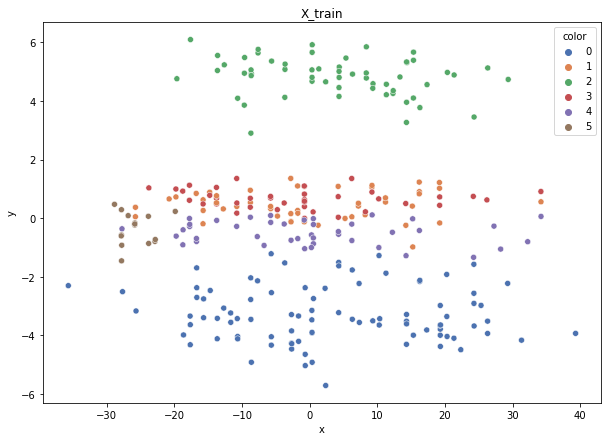

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 4: 0.14787267327537115, 3: 0.15924749429655355, 5: 0.3881657673478493}


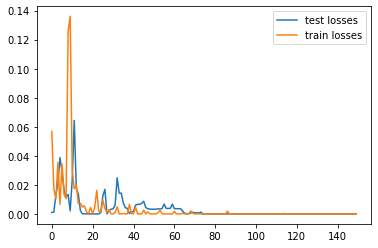

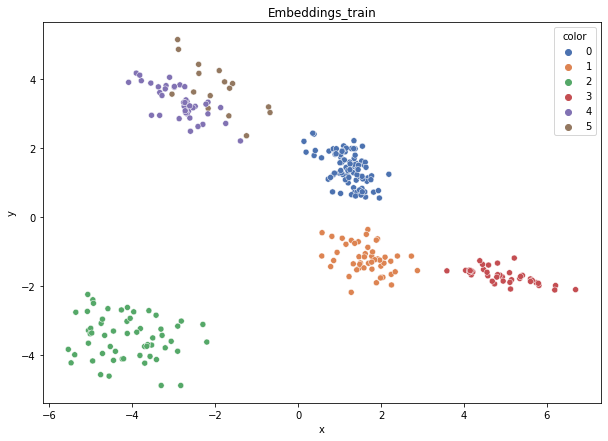

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.946
DT-f1-old+new-features: 0.946
DT-f1-old-features: 0.946
DT-gmean-new-features: 0.937
DT-gmean-old+new-features: 0.937
DT-gmean-old-features: 0.945
KNN-f1-new-features: 0.985
KNN-f1-old+new-features: 0.985
KNN-f1-old-features: 0.939
KNN-gmean-new-features: 0.983
KNN-gmean-old+new-features: 0.983
KNN-gmean-old-features: 0.937
LDA-f1-new-features: 0.985
LDA-f1-old+new-features: 0.985
LDA-f1-old-features: 0.969
LDA-gmean-new-features: 0.983
LDA-gmean-old+new-features: 0.983
LDA-gmean-old-features: 0.968
QDA-f1-new-features: 0.757
QDA-f1-old+new-features: 0.762
QDA-f1-old-features: 0.652
QDA-gmean-new-features: 0.294
QDA-gmean-old+new-features: 0.692
QDA-gmean-old-features: 0.553
RF24-f1-new-features: 0.958
RF24-f1-old+new-features: 0.969
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 0.95
RF24-gmean-old+new-features: 0.963
RF24-gmean-old-features: 0.963


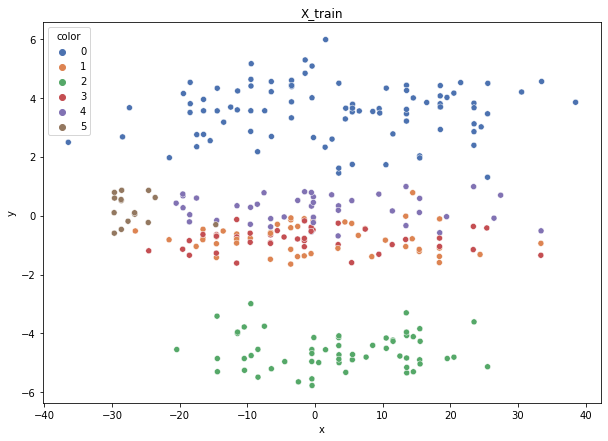

Class cardinalities: Counter({0: 90, 2: 57, 1: 49, 4: 42, 3: 39, 5: 16})
Weights: {1: 0.12674800566460384, 0: 0.06900724752850654, 2: 0.10895881188711559, 3: 0.15924749429655355, 4: 0.14787267327537115, 5: 0.3881657673478493}


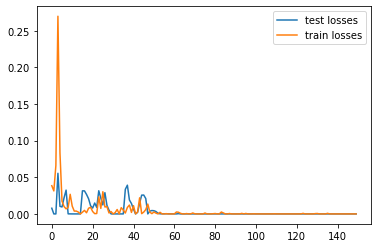

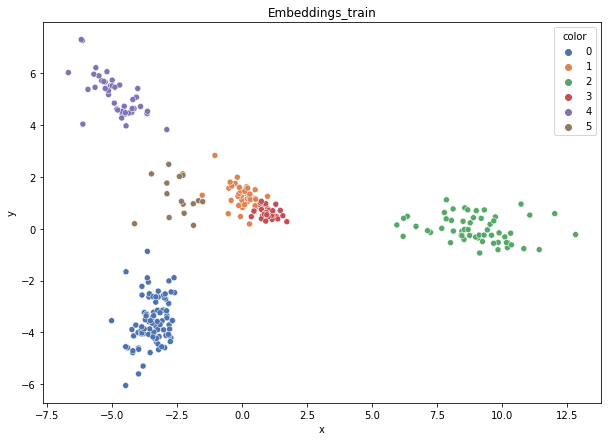

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.96
DT-f1-old+new-features: 0.97
DT-f1-old-features: 0.989
DT-gmean-new-features: 0.963
DT-gmean-old+new-features: 0.97
DT-gmean-old-features: 0.992
KNN-f1-new-features: 0.989
KNN-f1-old+new-features: 0.989
KNN-f1-old-features: 0.944
KNN-gmean-new-features: 0.992
KNN-gmean-old+new-features: 0.992
KNN-gmean-old-features: 0.942
LDA-f1-new-features: 0.989
LDA-f1-old+new-features: 1.0
LDA-f1-old-features: 0.989
LDA-gmean-new-features: 0.992
LDA-gmean-old+new-features: 1.0
LDA-gmean-old-features: 0.992
QDA-f1-new-features: 0.819
QDA-f1-old+new-features: 0.931
QDA-f1-old-features: 0.835
QDA-gmean-new-features: 0.316
QDA-gmean-old+new-features: 0.926
QDA-gmean-old-features: 0.814
RF24-f1-new-features: 0.989
RF24-f1-old+new-features: 0.989
RF24-f1-old-features: 1.0
RF24-gmean-new-features: 0.992
RF24-gmean-old+new-features: 0.992
RF24-gmean-old-features: 1.0
hayes-roth


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


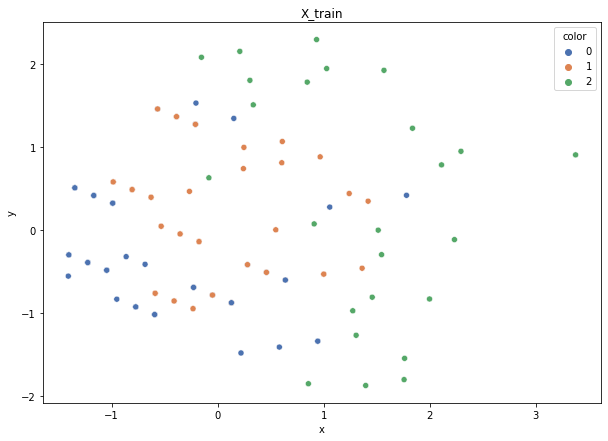

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


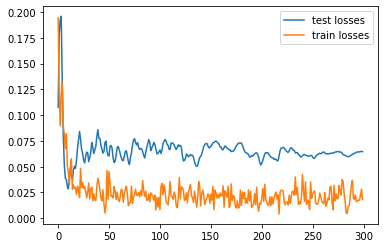

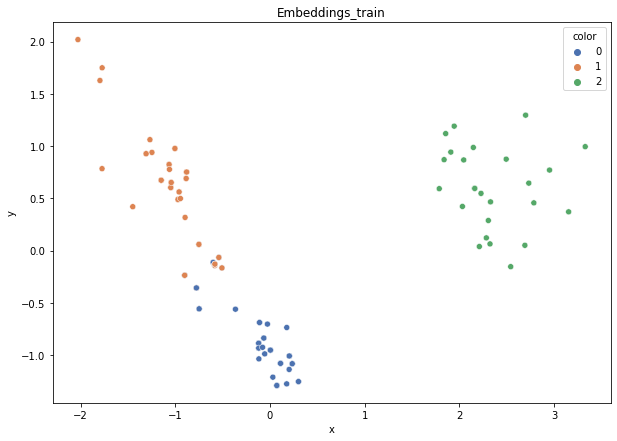

DT-f1-new-features: 0.867
DT-f1-old+new-features: 0.867
DT-f1-old-features: 0.842
DT-gmean-new-features: 0.851
DT-gmean-old+new-features: 0.851
DT-gmean-old-features: 0.828
KNN-f1-new-features: 0.87
KNN-f1-old+new-features: 0.897
KNN-f1-old-features: 0.733
KNN-gmean-new-features: 0.861
KNN-gmean-old+new-features: 0.895
KNN-gmean-old-features: 0.688
LDA-f1-new-features: 0.897
LDA-f1-old+new-features: 0.872
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.892
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.549
QDA-f1-new-features: 0.842
QDA-f1-old+new-features: 0.845
QDA-f1-old-features: 0.58
QDA-gmean-new-features: 0.828
QDA-gmean-old+new-features: 0.837
QDA-gmean-old-features: 0.574
RF24-f1-new-features: 0.872
RF24-f1-old+new-features: 0.872
RF24-f1-old-features: 0.838
RF24-gmean-new-features: 0.867
RF24-gmean-old+new-features: 0.867
RF24-gmean-old-features: 0.814


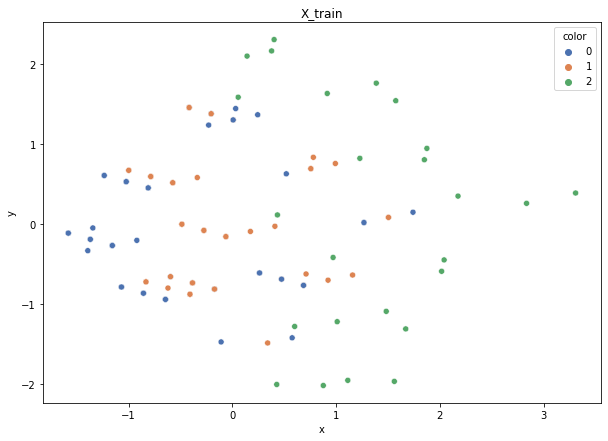

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


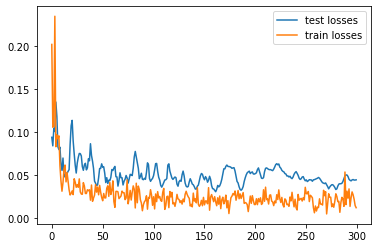

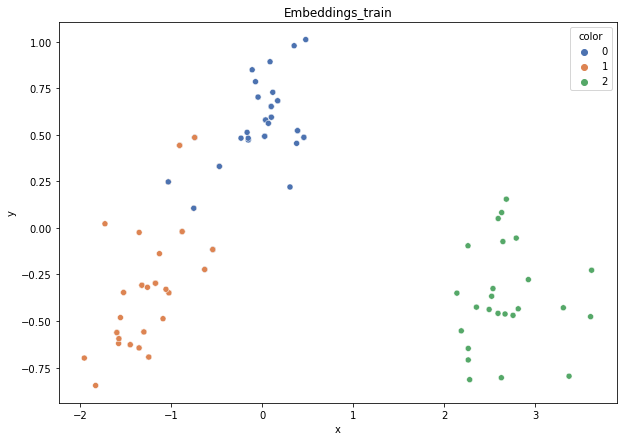

DT-f1-new-features: 0.897
DT-f1-old+new-features: 0.897
DT-f1-old-features: 0.872
DT-gmean-new-features: 0.895
DT-gmean-old+new-features: 0.895
DT-gmean-old-features: 0.867
KNN-f1-new-features: 0.872
KNN-f1-old+new-features: 0.82
KNN-f1-old-features: 0.643
KNN-gmean-new-features: 0.867
KNN-gmean-old+new-features: 0.811
KNN-gmean-old-features: 0.619
LDA-f1-new-features: 0.872
LDA-f1-old+new-features: 0.872
LDA-f1-old-features: 0.439
LDA-gmean-new-features: 0.867
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.414
QDA-f1-new-features: 0.845
QDA-f1-old+new-features: 0.845
QDA-f1-old-features: 0.54
QDA-gmean-new-features: 0.837
QDA-gmean-old+new-features: 0.837
QDA-gmean-old-features: 0.529
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.846
RF24-gmean-new-features: 0.895
RF24-gmean-old+new-features: 0.895
RF24-gmean-old-features: 0.84


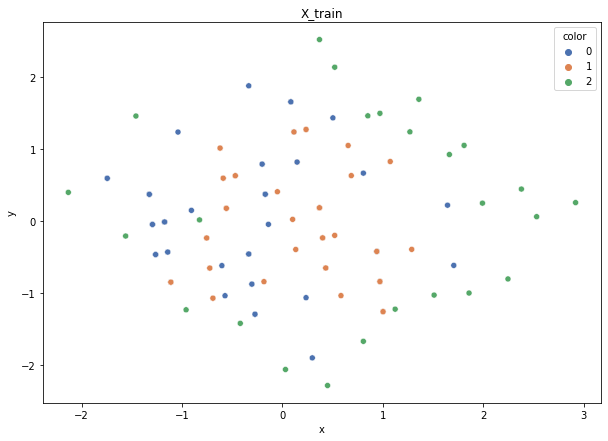

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {0: 0.243925770040176, 1: 0.24870862827625786, 2: 0.507365601683566}


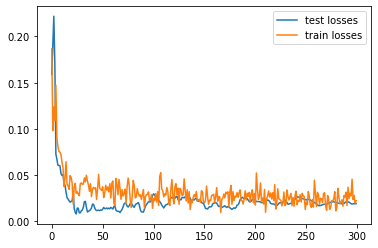

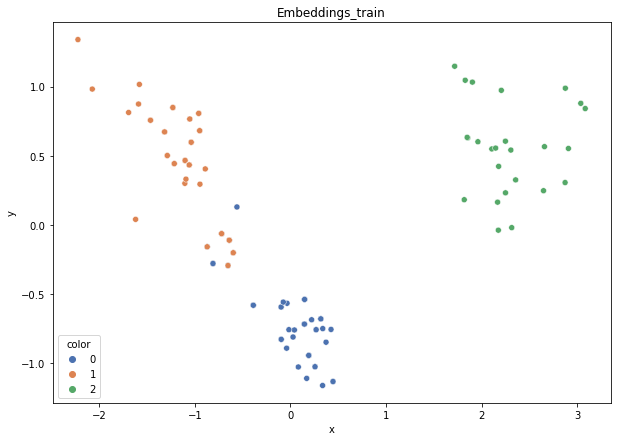

DT-f1-new-features: 0.882
DT-f1-old+new-features: 0.923
DT-f1-old-features: 0.923
DT-gmean-new-features: 0.867
DT-gmean-old+new-features: 0.921
DT-gmean-old-features: 0.921
KNN-f1-new-features: 0.949
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.836
KNN-gmean-new-features: 0.948
KNN-gmean-old+new-features: 0.921
KNN-gmean-old-features: 0.805
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.923
LDA-f1-old-features: 0.565
LDA-gmean-new-features: 0.921
LDA-gmean-old+new-features: 0.921
LDA-gmean-old-features: 0.474
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.948
QDA-f1-old-features: 0.666
QDA-gmean-new-features: 0.921
QDA-gmean-old+new-features: 0.946
QDA-gmean-old-features: 0.643
RF24-f1-new-features: 0.948
RF24-f1-old+new-features: 0.948
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.946
RF24-gmean-old+new-features: 0.946
RF24-gmean-old-features: 0.921


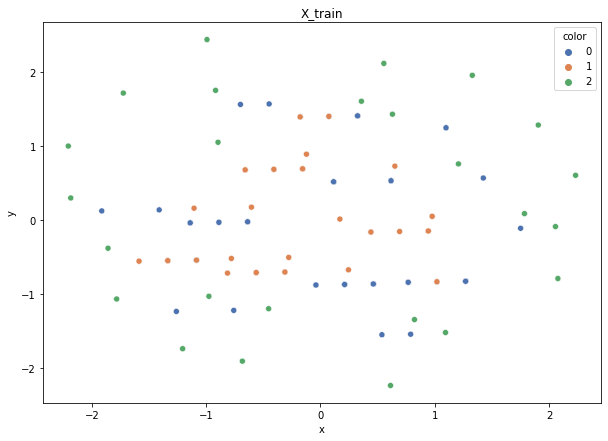

Class cardinalities: Counter({0: 52, 1: 51, 2: 25})
Weights: {1: 0.24870862827625786, 2: 0.507365601683566, 0: 0.243925770040176}


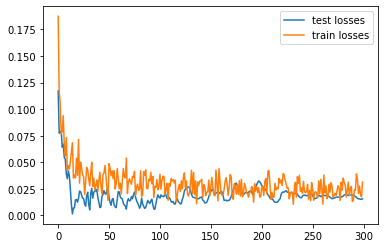

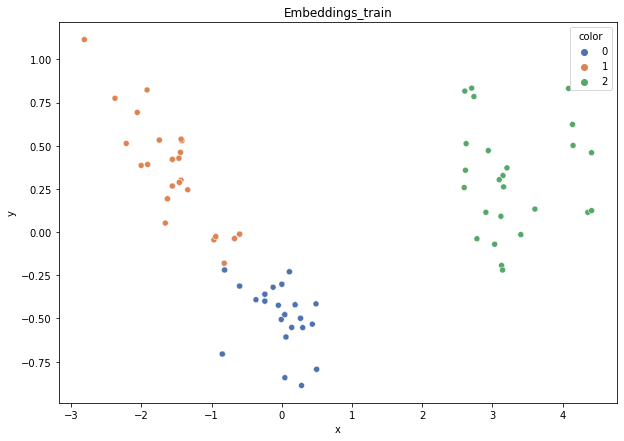

DT-f1-new-features: 0.791
DT-f1-old+new-features: 0.872
DT-f1-old-features: 0.897
DT-gmean-new-features: 0.79
DT-gmean-old+new-features: 0.867
DT-gmean-old-features: 0.892
KNN-f1-new-features: 0.948
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.594
KNN-gmean-new-features: 0.946
KNN-gmean-old+new-features: 0.921
KNN-gmean-old-features: 0.54
LDA-f1-new-features: 0.872
LDA-f1-old+new-features: 0.872
LDA-f1-old-features: 0.615
LDA-gmean-new-features: 0.867
LDA-gmean-old+new-features: 0.867
LDA-gmean-old-features: 0.605
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.845
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.921
QDA-gmean-old+new-features: 0.837
QDA-gmean-old-features: 0.752
RF24-f1-new-features: 0.897
RF24-f1-old+new-features: 0.897
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.892
RF24-gmean-old+new-features: 0.892
RF24-gmean-old-features: 0.921


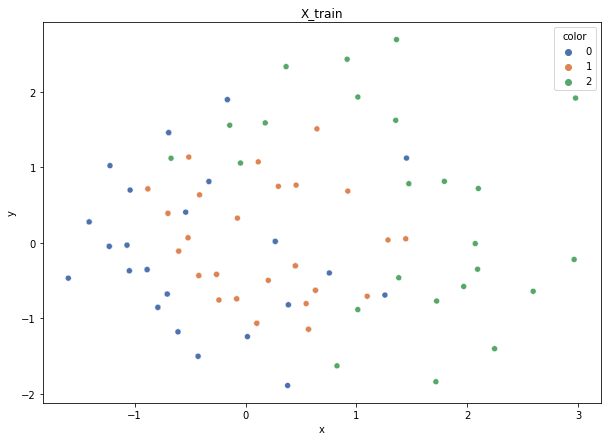

Class cardinalities: Counter({0: 52, 1: 52, 2: 24})
Weights: {0: 0.24000000000000005, 2: 0.52, 1: 0.24000000000000005}


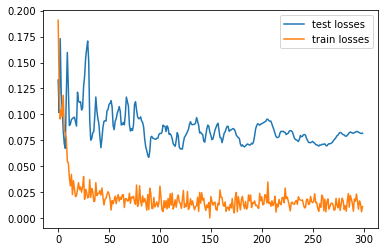

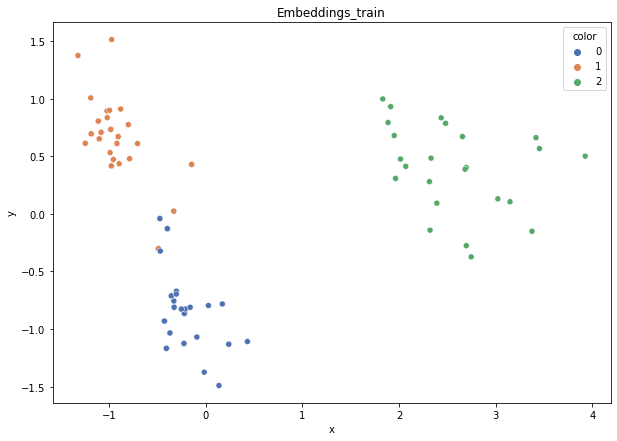

DT-f1-new-features: 0.777
DT-f1-old+new-features: 0.777
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.76
DT-gmean-old+new-features: 0.76
DT-gmean-old-features: 0.684
KNN-f1-new-features: 0.786
KNN-f1-old+new-features: 0.812
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.773
KNN-gmean-old+new-features: 0.8
KNN-gmean-old-features: 0.529
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.786
LDA-f1-old-features: 0.607
LDA-gmean-new-features: 0.773
LDA-gmean-old+new-features: 0.773
LDA-gmean-old-features: 0.591
QDA-f1-new-features: 0.76
QDA-f1-old+new-features: 0.786
QDA-f1-old-features: 0.663
QDA-gmean-new-features: 0.743
QDA-gmean-old+new-features: 0.773
QDA-gmean-old-features: 0.667
RF24-f1-new-features: 0.786
RF24-f1-old+new-features: 0.786
RF24-f1-old-features: 0.733
RF24-gmean-new-features: 0.773
RF24-gmean-old+new-features: 0.773
RF24-gmean-old-features: 0.711
new_vehicle


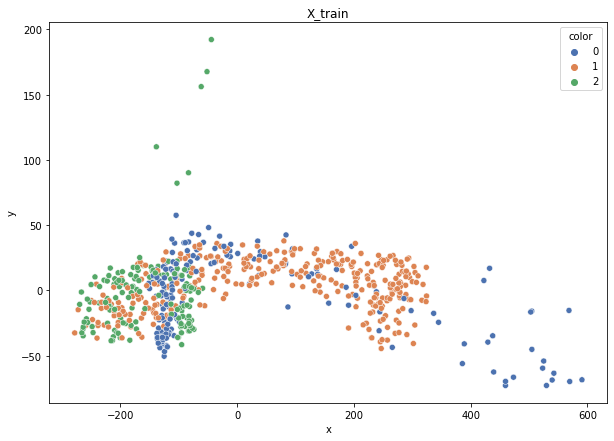

Class cardinalities: Counter({1: 343, 0: 174, 2: 159})
Weights: {2: 0.42063643091235864, 1: 0.19498889946083095, 0: 0.38437466962681044}


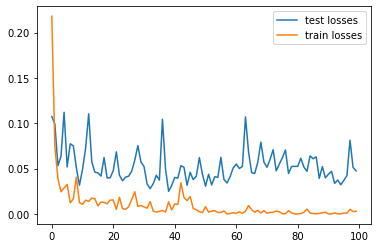

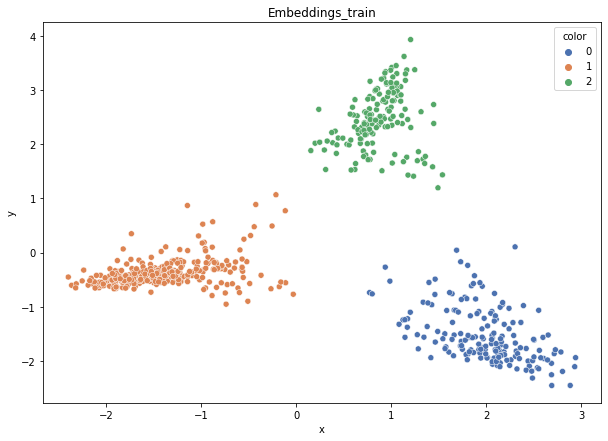

DT-f1-new-features: 0.954
DT-f1-old+new-features: 0.947
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.959
DT-gmean-old+new-features: 0.953
DT-gmean-old-features: 0.908
KNN-f1-new-features: 0.954
KNN-f1-old+new-features: 0.951
KNN-f1-old-features: 0.889
KNN-gmean-new-features: 0.956
KNN-gmean-old+new-features: 0.953
KNN-gmean-old-features: 0.895
LDA-f1-new-features: 0.966
LDA-f1-old+new-features: 0.958
LDA-f1-old-features: 0.907
LDA-gmean-new-features: 0.968
LDA-gmean-old+new-features: 0.96
LDA-gmean-old-features: 0.921
QDA-f1-new-features: 0.948
QDA-f1-old+new-features: 0.954
QDA-f1-old-features: 0.932
QDA-gmean-new-features: 0.952
QDA-gmean-old+new-features: 0.956
QDA-gmean-old-features: 0.944
RF24-f1-new-features: 0.948
RF24-f1-old+new-features: 0.948
RF24-f1-old-features: 0.922
RF24-gmean-new-features: 0.95
RF24-gmean-old+new-features: 0.95
RF24-gmean-old-features: 0.932


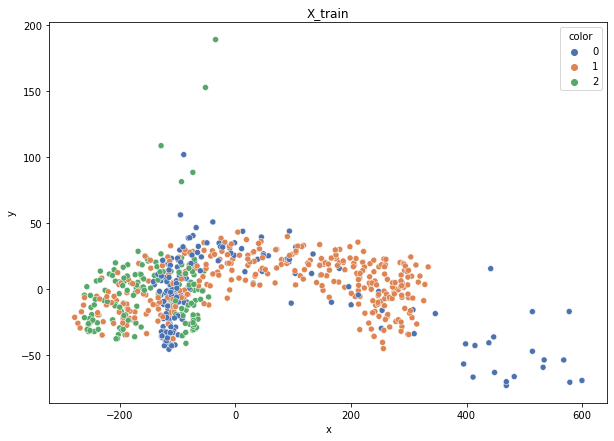

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


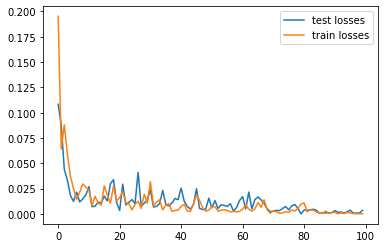

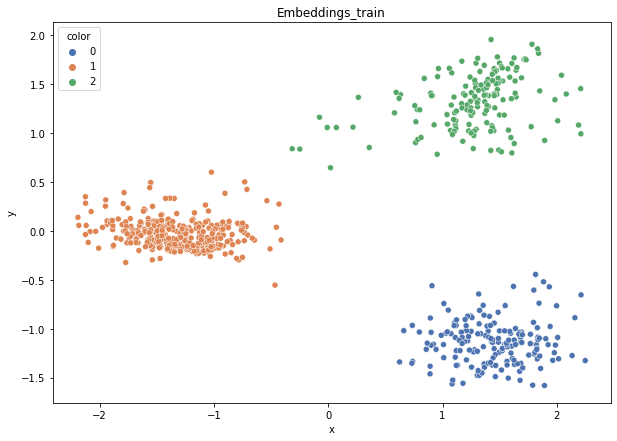

DT-f1-new-features: 0.986
DT-f1-old+new-features: 0.98
DT-f1-old-features: 0.906
DT-gmean-new-features: 0.988
DT-gmean-old+new-features: 0.984
DT-gmean-old-features: 0.904
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.994
KNN-f1-old-features: 0.9
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.996
KNN-gmean-old-features: 0.908
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 0.994
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.94
QDA-f1-new-features: 0.982
QDA-f1-old+new-features: 0.989
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.988
QDA-gmean-old+new-features: 0.992
QDA-gmean-old-features: 0.992
RF24-f1-new-features: 0.992
RF24-f1-old+new-features: 0.992
RF24-f1-old-features: 0.958
RF24-gmean-new-features: 0.992
RF24-gmean-old+new-features: 0.992
RF24-gmean-old-features: 0.968


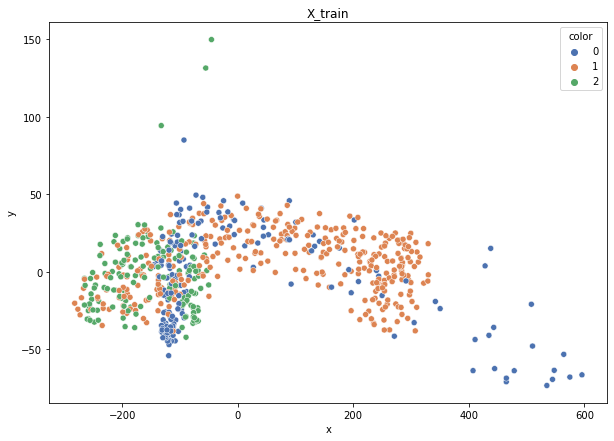

Class cardinalities: Counter({1: 343, 0: 175, 2: 159})
Weights: {2: 0.4215623617324616, 1: 0.19541812103633058, 0: 0.3830195172312079}


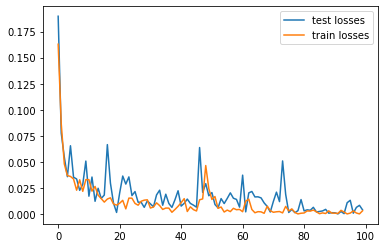

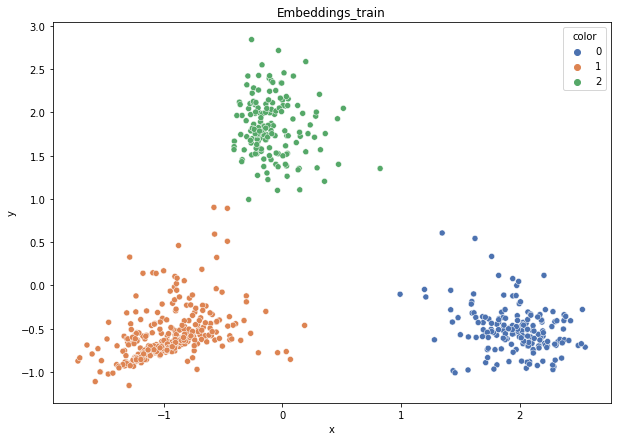

DT-f1-new-features: 0.973
DT-f1-old+new-features: 0.973
DT-f1-old-features: 0.89
DT-gmean-new-features: 0.971
DT-gmean-old+new-features: 0.971
DT-gmean-old-features: 0.895
KNN-f1-new-features: 0.994
KNN-f1-old+new-features: 0.986
KNN-f1-old-features: 0.899
KNN-gmean-new-features: 0.996
KNN-gmean-old+new-features: 0.988
KNN-gmean-old-features: 0.897
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 0.994
LDA-f1-old-features: 0.965
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.964
QDA-f1-new-features: 0.992
QDA-f1-old+new-features: 0.992
QDA-f1-old-features: 0.976
QDA-gmean-new-features: 0.992
QDA-gmean-old+new-features: 0.992
QDA-gmean-old-features: 0.975
RF24-f1-new-features: 0.982
RF24-f1-old+new-features: 0.986
RF24-f1-old-features: 0.952
RF24-gmean-new-features: 0.984
RF24-gmean-old+new-features: 0.988
RF24-gmean-old-features: 0.955


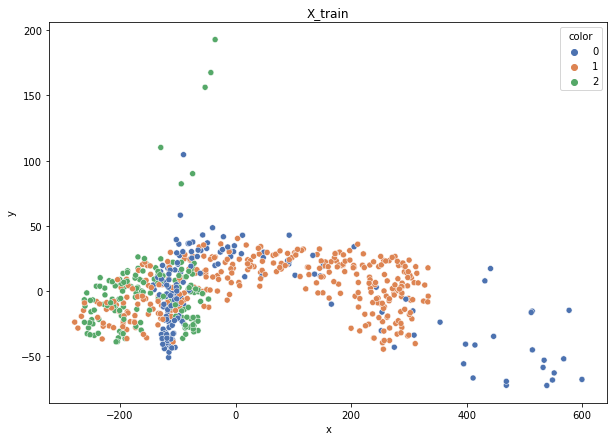

Class cardinalities: Counter({1: 344, 0: 174, 2: 159})
Weights: {2: 0.42087499472640594, 0: 0.3845926675948192, 1: 0.19453233767877484}


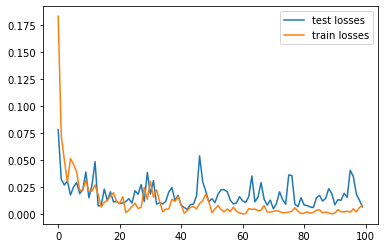

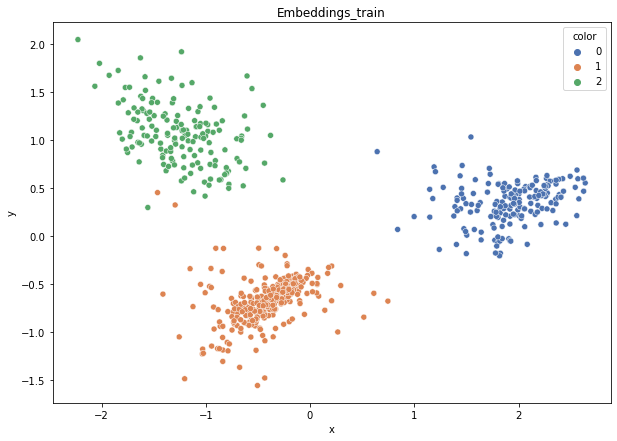

DT-f1-new-features: 0.982
DT-f1-old+new-features: 0.976
DT-f1-old-features: 0.909
DT-gmean-new-features: 0.977
DT-gmean-old+new-features: 0.973
DT-gmean-old-features: 0.916
KNN-f1-new-features: 0.981
KNN-f1-old+new-features: 0.981
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.979
KNN-gmean-old+new-features: 0.979
KNN-gmean-old-features: 0.927
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 0.994
LDA-f1-old-features: 0.953
LDA-gmean-new-features: 0.996
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.957
QDA-f1-new-features: 0.988
QDA-f1-old+new-features: 0.994
QDA-f1-old-features: 0.988
QDA-gmean-new-features: 0.992
QDA-gmean-old+new-features: 0.996
QDA-gmean-old-features: 0.988
RF24-f1-new-features: 0.994
RF24-f1-old+new-features: 0.994
RF24-f1-old-features: 0.976
RF24-gmean-new-features: 0.992
RF24-gmean-old+new-features: 0.992
RF24-gmean-old-features: 0.977


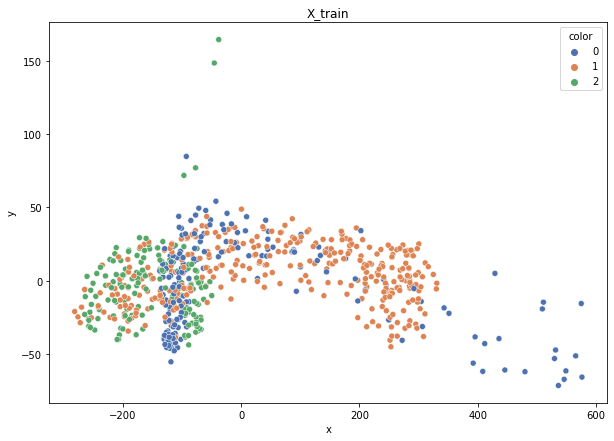

Class cardinalities: Counter({1: 343, 0: 174, 2: 160})
Weights: {2: 0.4191092821730032, 1: 0.19550287215067205, 0: 0.3853878456763248}


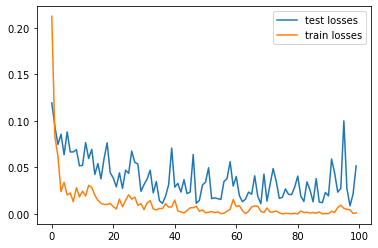

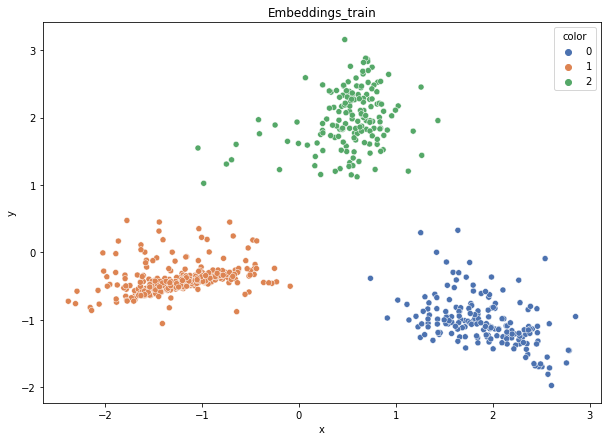

DT-f1-new-features: 0.987
DT-f1-old+new-features: 0.987
DT-f1-old-features: 0.877
DT-gmean-new-features: 0.983
DT-gmean-old+new-features: 0.983
DT-gmean-old-features: 0.87
KNN-f1-new-features: 0.982
KNN-f1-old+new-features: 0.979
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.975
KNN-gmean-old+new-features: 0.975
KNN-gmean-old-features: 0.935
LDA-f1-new-features: 0.974
LDA-f1-old+new-features: 0.974
LDA-f1-old-features: 0.939
LDA-gmean-new-features: 0.967
LDA-gmean-old+new-features: 0.967
LDA-gmean-old-features: 0.941
QDA-f1-new-features: 0.992
QDA-f1-old+new-features: 0.986
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 0.992
QDA-gmean-old+new-features: 0.984
QDA-gmean-old-features: 0.969
RF24-f1-new-features: 0.987
RF24-f1-old+new-features: 0.987
RF24-f1-old-features: 0.978
RF24-gmean-new-features: 0.983
RF24-gmean-old+new-features: 0.983
RF24-gmean-old-features: 0.981
new_yeast


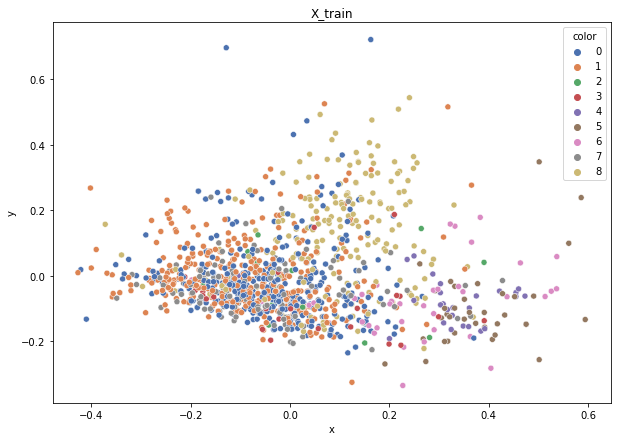

Class cardinalities: Counter({0: 370, 1: 343, 8: 195, 7: 135, 6: 40, 5: 36, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024325906642526016, 0: 0.012820410257547495, 1: 0.013829597070823827, 5: 0.1317653276470159, 4: 0.16941256411759187, 6: 0.11858879488231433, 3: 0.19764799147052386, 7: 0.03513742070587091, 2: 0.2964719872057858}


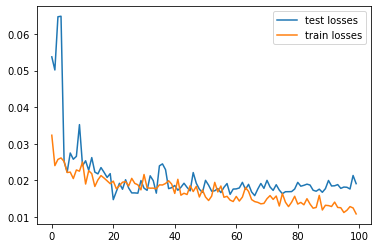

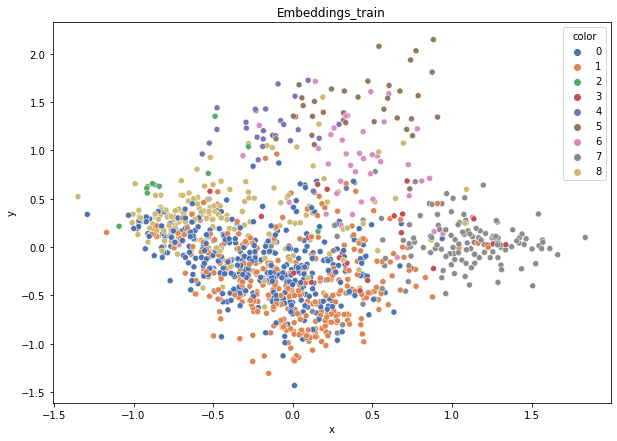

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.467
DT-f1-old+new-features: 0.462
DT-f1-old-features: 0.494
DT-gmean-new-features: 0.269
DT-gmean-old+new-features: 0.267
DT-gmean-old-features: 0.271
KNN-f1-new-features: 0.54
KNN-f1-old+new-features: 0.566
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.494
KNN-gmean-old+new-features: 0.545
KNN-gmean-old-features: 0.51
LDA-f1-new-features: 0.549
LDA-f1-old+new-features: 0.555
LDA-f1-old-features: 0.564
LDA-gmean-new-features: 0.31
LDA-gmean-old+new-features: 0.308
LDA-gmean-old-features: 0.308
QDA-f1-new-features: 0.549
QDA-f1-old+new-features: 0.345
QDA-f1-old-features: 0.171
QDA-gmean-new-features: 0.308
QDA-gmean-old+new-features: 0.161
QDA-gmean-old-features: 0.047
RF24-f1-new-features: 0.54
RF24-f1-old+new-features: 0.558
RF24-f1-old-features: 0.565
RF24-gmean-new-features: 0.295
RF24-gmean-old+new-features: 0.303
RF24-gmean-old-features: 0.313


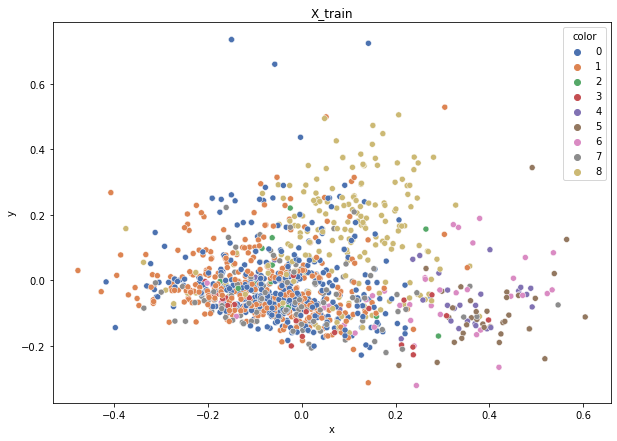

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {1: 0.013814401543936261, 8: 0.02429917810035968, 0: 0.012771805200997676, 5: 0.13538113513057534, 6: 0.11556926169683263, 7: 0.035360744250523414, 3: 0.1974308220654224, 4: 0.16922641891321918, 2: 0.2961462330981336}


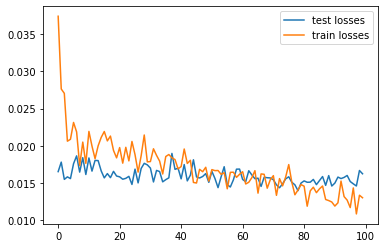

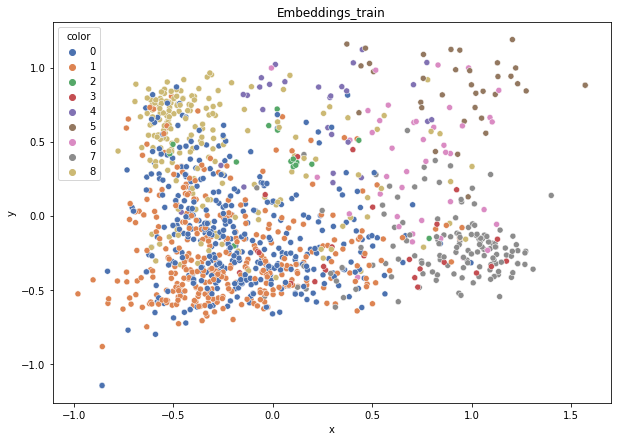

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.428
DT-f1-old+new-features: 0.458
DT-f1-old-features: 0.451
DT-gmean-new-features: 0.255
DT-gmean-old+new-features: 0.274
DT-gmean-old-features: 0.26
KNN-f1-new-features: 0.454
KNN-f1-old+new-features: 0.514
KNN-f1-old-features: 0.494
KNN-gmean-new-features: 0.236
KNN-gmean-old+new-features: 0.28
KNN-gmean-old-features: 0.268
LDA-f1-new-features: 0.59
LDA-f1-old+new-features: 0.587
LDA-f1-old-features: 0.57
LDA-gmean-new-features: 0.323
LDA-gmean-old+new-features: 0.319
LDA-gmean-old-features: 0.307
QDA-f1-new-features: 0.603
QDA-f1-old+new-features: 0.257
QDA-f1-old-features: 0.1
QDA-gmean-new-features: 0.554
QDA-gmean-old+new-features: 0.087
QDA-gmean-old-features: 0.033
RF24-f1-new-features: 0.604
RF24-f1-old+new-features: 0.604
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.327
RF24-gmean-old+new-features: 0.325
RF24-gmean-old-features: 0.332


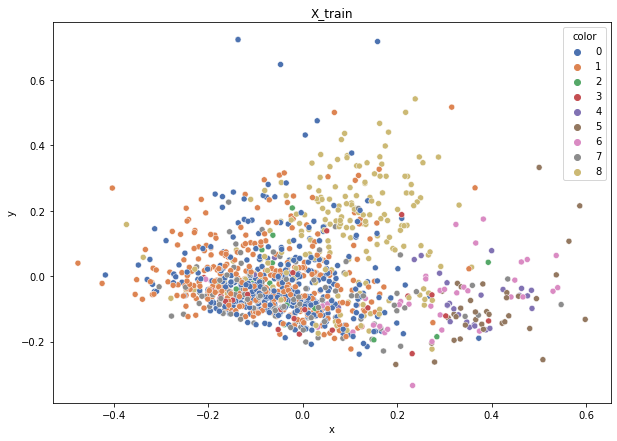

Class cardinalities: Counter({0: 371, 1: 343, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299178100359677, 1: 0.01381440154393626, 0: 0.012771805200997674, 5: 0.13538113513057534, 4: 0.16922641891321916, 6: 0.11556926169683261, 7: 0.03536074425052341, 3: 0.19743082206542237, 2: 0.29614623309813354}


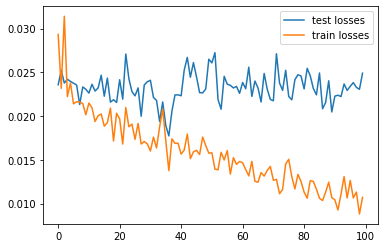

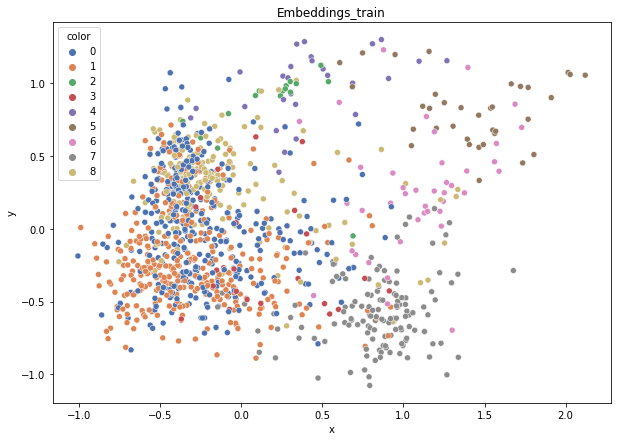

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.421
DT-f1-old+new-features: 0.404
DT-f1-old-features: 0.407
DT-gmean-new-features: 0.233
DT-gmean-old+new-features: 0.225
DT-gmean-old-features: 0.401
KNN-f1-new-features: 0.463
KNN-f1-old+new-features: 0.458
KNN-f1-old-features: 0.451
KNN-gmean-new-features: 0.246
KNN-gmean-old+new-features: 0.426
KNN-gmean-old-features: 0.422
LDA-f1-new-features: 0.493
LDA-f1-old+new-features: 0.484
LDA-f1-old-features: 0.492
LDA-gmean-new-features: 0.273
LDA-gmean-old+new-features: 0.265
LDA-gmean-old-features: 0.267
QDA-f1-new-features: 0.463
QDA-f1-old+new-features: 0.377
QDA-f1-old-features: 0.262
QDA-gmean-new-features: 0.257
QDA-gmean-old+new-features: 0.201
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.458
RF24-f1-old+new-features: 0.467
RF24-f1-old-features: 0.538
RF24-gmean-new-features: 0.253
RF24-gmean-old+new-features: 0.257
RF24-gmean-old-features: 0.474


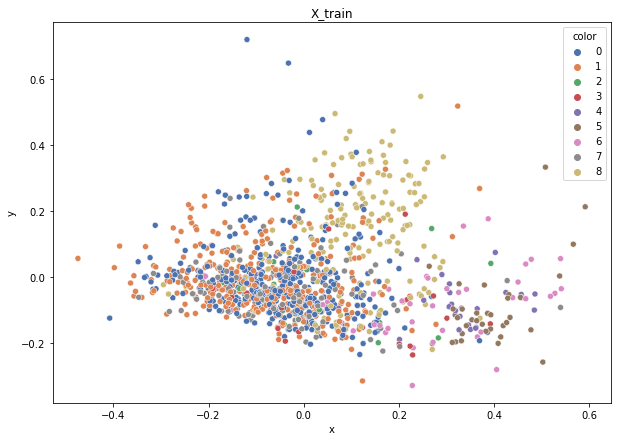

Class cardinalities: Counter({0: 370, 1: 344, 8: 195, 7: 134, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.024299315142460837, 1: 0.013774321083662392, 0: 0.012806395818323955, 5: 0.13538189865085323, 4: 0.16922737331356652, 6: 0.11556991348243568, 7: 0.03536094367746166, 3: 0.1974319355324943, 2: 0.29614790329874147}


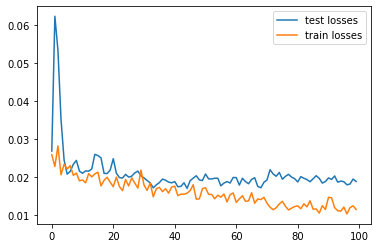

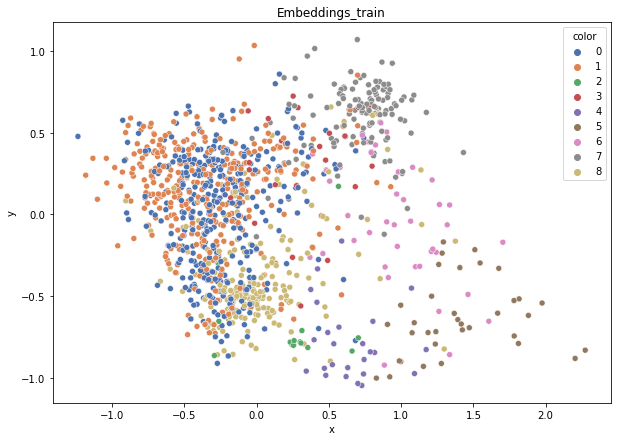

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.45
DT-f1-old+new-features: 0.428
DT-f1-old-features: 0.437
DT-gmean-new-features: 0.243
DT-gmean-old+new-features: 0.23
DT-gmean-old-features: 0.247
KNN-f1-new-features: 0.503
KNN-f1-old+new-features: 0.529
KNN-f1-old-features: 0.492
KNN-gmean-new-features: 0.481
KNN-gmean-old+new-features: 0.471
KNN-gmean-old-features: 0.439
LDA-f1-new-features: 0.517
LDA-f1-old+new-features: 0.515
LDA-f1-old-features: 0.5
LDA-gmean-new-features: 0.278
LDA-gmean-old+new-features: 0.273
LDA-gmean-old-features: 0.26
QDA-f1-new-features: 0.492
QDA-f1-old+new-features: 0.294
QDA-f1-old-features: 0.106
QDA-gmean-new-features: 0.261
QDA-gmean-old+new-features: 0.152
QDA-gmean-old-features: 0.026
RF24-f1-new-features: 0.484
RF24-f1-old+new-features: 0.54
RF24-f1-old-features: 0.531
RF24-gmean-new-features: 0.266
RF24-gmean-old+new-features: 0.286
RF24-gmean-old-features: 0.277


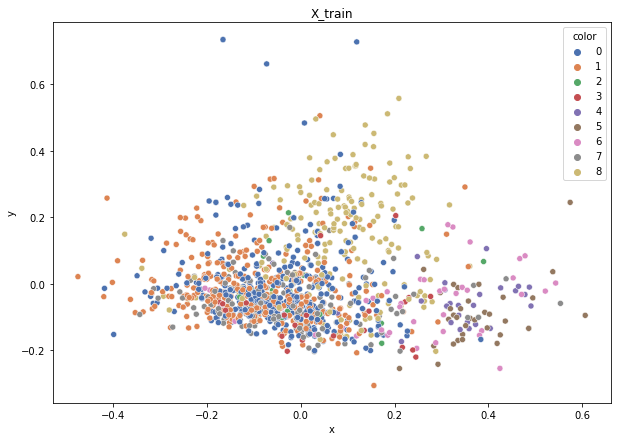

Class cardinalities: Counter({0: 370, 1: 343, 8: 196, 7: 135, 6: 41, 5: 35, 4: 28, 3: 24, 2: 16})
Weights: {8: 0.02418370057482606, 1: 0.013819257471329179, 0: 0.012810825169367322, 5: 0.13542872321902596, 4: 0.16928590402378244, 6: 0.11560988567477826, 7: 0.035111150464191915, 3: 0.1975002213610795, 2: 0.29625033204161927}


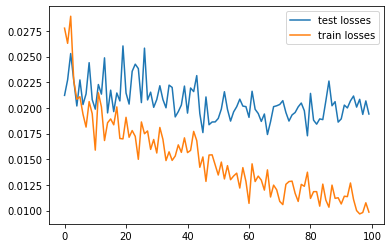

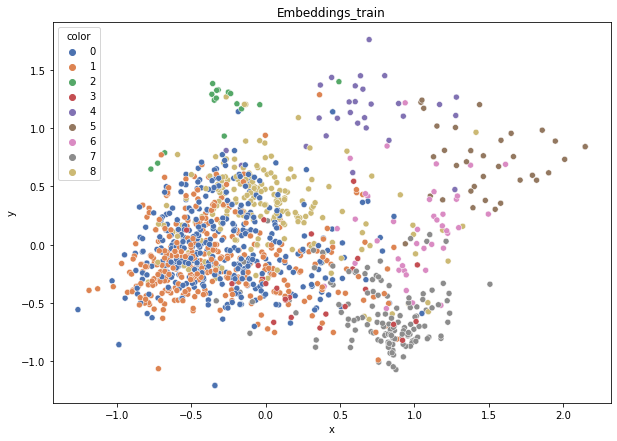

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.42
DT-f1-old+new-features: 0.425
DT-f1-old-features: 0.423
DT-gmean-new-features: 0.226
DT-gmean-old+new-features: 0.232
DT-gmean-old-features: 0.236
KNN-f1-new-features: 0.478
KNN-f1-old+new-features: 0.456
KNN-f1-old-features: 0.452
KNN-gmean-new-features: 0.245
KNN-gmean-old+new-features: 0.405
KNN-gmean-old-features: 0.403
LDA-f1-new-features: 0.541
LDA-f1-old+new-features: 0.526
LDA-f1-old-features: 0.532
LDA-gmean-new-features: 0.286
LDA-gmean-old+new-features: 0.279
LDA-gmean-old-features: 0.274
QDA-f1-new-features: 0.461
QDA-f1-old+new-features: 0.395
QDA-f1-old-features: 0.118
QDA-gmean-new-features: 0.147
QDA-gmean-old+new-features: 0.076
QDA-gmean-old-features: 0.043
RF24-f1-new-features: 0.507
RF24-f1-old+new-features: 0.527
RF24-f1-old-features: 0.569
RF24-gmean-new-features: 0.269
RF24-gmean-old+new-features: 0.281
RF24-gmean-old-features: 0.295
1czysty-cut


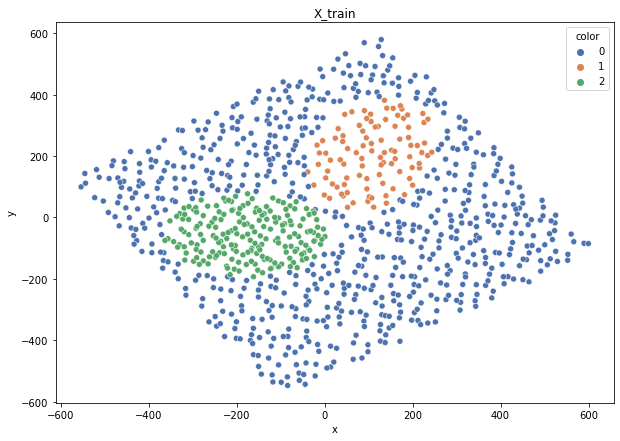

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


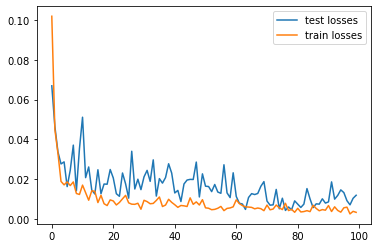

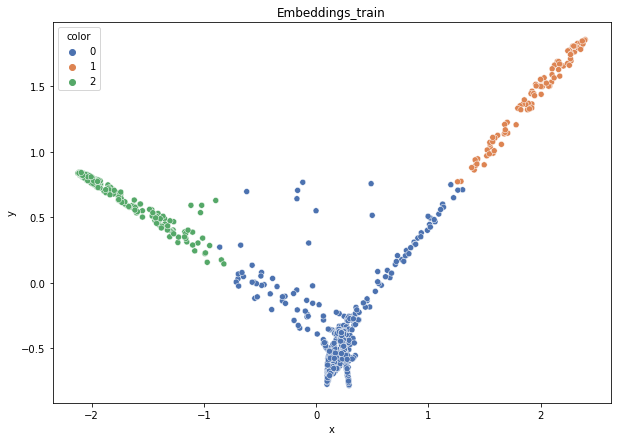

DT-f1-new-features: 0.964
DT-f1-old+new-features: 0.964
DT-f1-old-features: 0.901
DT-gmean-new-features: 0.966
DT-gmean-old+new-features: 0.966
DT-gmean-old-features: 0.889
KNN-f1-new-features: 0.946
KNN-f1-old+new-features: 0.968
KNN-f1-old-features: 0.937
KNN-gmean-new-features: 0.943
KNN-gmean-old+new-features: 0.973
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.965
LDA-f1-old+new-features: 0.961
LDA-f1-old-features: 0.262
LDA-gmean-new-features: 0.978
LDA-gmean-old+new-features: 0.976
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.948
QDA-f1-old+new-features: 0.966
QDA-f1-old-features: 0.805
QDA-gmean-new-features: 0.984
QDA-gmean-old+new-features: 0.99
QDA-gmean-old-features: 0.701
RF24-f1-new-features: 0.964
RF24-f1-old+new-features: 0.964
RF24-f1-old-features: 0.934
RF24-gmean-new-features: 0.966
RF24-gmean-old+new-features: 0.966
RF24-gmean-old-features: 0.939


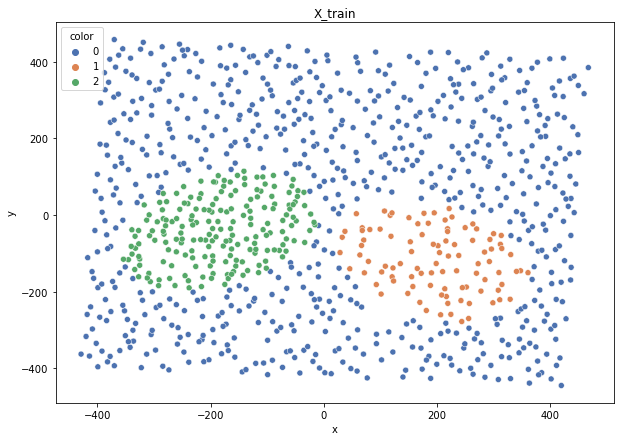

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


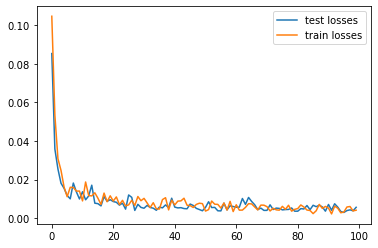

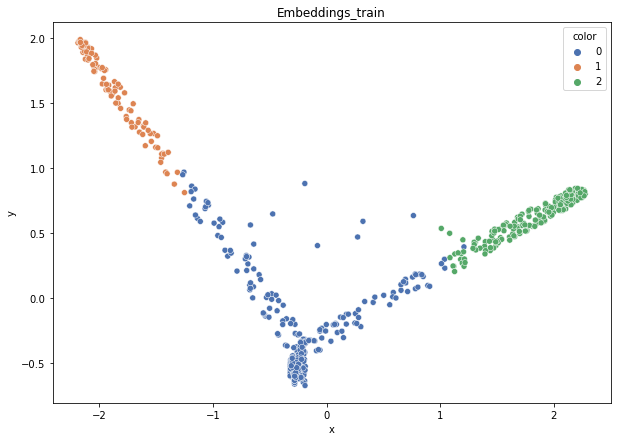

DT-f1-new-features: 0.983
DT-f1-old+new-features: 0.983
DT-f1-old-features: 0.929
DT-gmean-new-features: 0.977
DT-gmean-old+new-features: 0.977
DT-gmean-old-features: 0.928
KNN-f1-new-features: 0.984
KNN-f1-old+new-features: 0.992
KNN-f1-old-features: 0.945
KNN-gmean-new-features: 0.971
KNN-gmean-old+new-features: 0.986
KNN-gmean-old-features: 0.934
LDA-f1-new-features: 0.975
LDA-f1-old+new-features: 0.975
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.978
LDA-gmean-old+new-features: 0.978
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.967
QDA-f1-old+new-features: 0.979
QDA-f1-old-features: 0.817
QDA-gmean-new-features: 0.988
QDA-gmean-old+new-features: 0.992
QDA-gmean-old-features: 0.709
RF24-f1-new-features: 0.97
RF24-f1-old+new-features: 0.97
RF24-f1-old-features: 0.901
RF24-gmean-new-features: 0.955
RF24-gmean-old+new-features: 0.955
RF24-gmean-old-features: 0.906


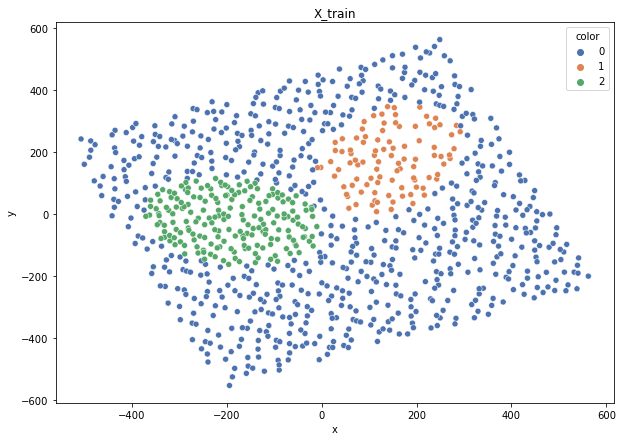

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


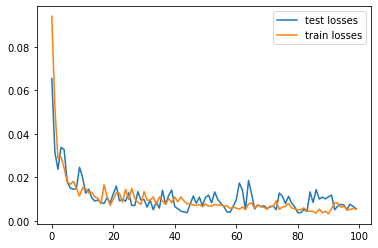

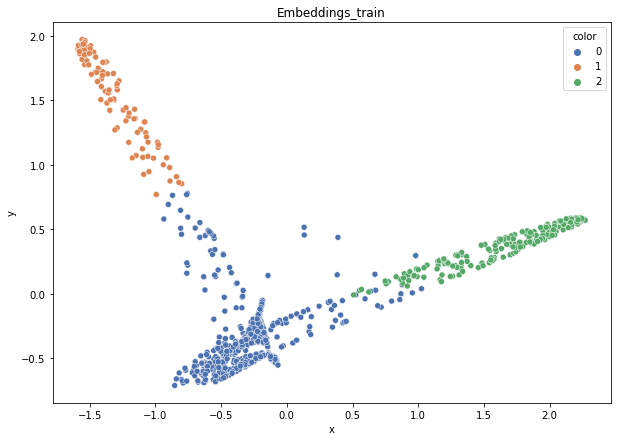

DT-f1-new-features: 0.967
DT-f1-old+new-features: 0.967
DT-f1-old-features: 0.942
DT-gmean-new-features: 0.955
DT-gmean-old+new-features: 0.955
DT-gmean-old-features: 0.934
KNN-f1-new-features: 0.971
KNN-f1-old+new-features: 0.984
KNN-f1-old-features: 0.957
KNN-gmean-new-features: 0.968
KNN-gmean-old+new-features: 0.984
KNN-gmean-old-features: 0.933
LDA-f1-new-features: 0.992
LDA-f1-old+new-features: 0.992
LDA-f1-old-features: 0.256
LDA-gmean-new-features: 0.998
LDA-gmean-old+new-features: 0.998
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.951
QDA-f1-old+new-features: 0.942
QDA-f1-old-features: 0.856
QDA-gmean-new-features: 0.949
QDA-gmean-old+new-features: 0.945
QDA-gmean-old-features: 0.783
RF24-f1-new-features: 0.976
RF24-f1-old+new-features: 0.976
RF24-f1-old-features: 0.951
RF24-gmean-new-features: 0.969
RF24-gmean-old+new-features: 0.969
RF24-gmean-old-features: 0.949


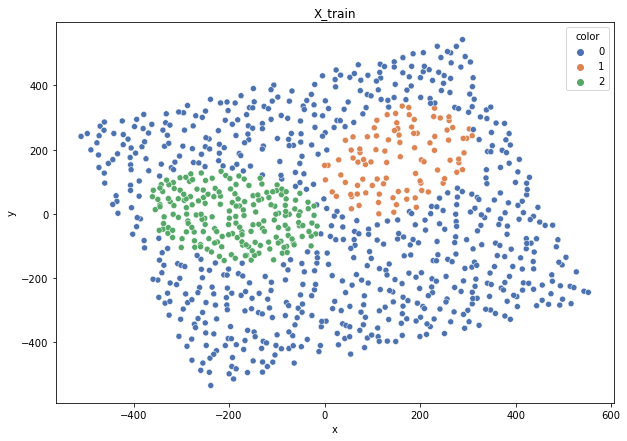

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


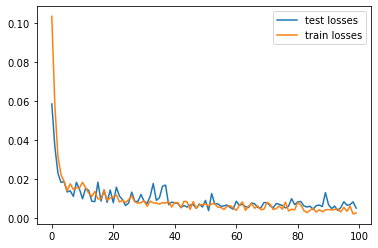

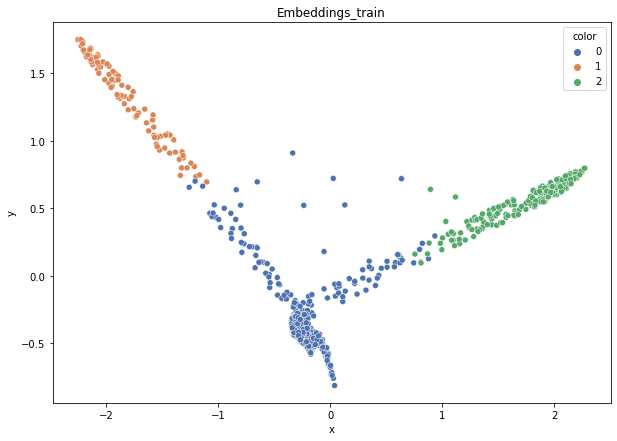

DT-f1-new-features: 0.972
DT-f1-old+new-features: 0.972
DT-f1-old-features: 0.932
DT-gmean-new-features: 0.99
DT-gmean-old+new-features: 0.99
DT-gmean-old-features: 0.959
KNN-f1-new-features: 0.979
KNN-f1-old+new-features: 0.969
KNN-f1-old-features: 0.931
KNN-gmean-new-features: 0.992
KNN-gmean-old+new-features: 0.99
KNN-gmean-old-features: 0.957
LDA-f1-new-features: 0.953
LDA-f1-old+new-features: 0.946
LDA-f1-old-features: 0.28
LDA-gmean-new-features: 0.984
LDA-gmean-old+new-features: 0.982
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.937
QDA-f1-old+new-features: 0.921
QDA-f1-old-features: 0.864
QDA-gmean-new-features: 0.973
QDA-gmean-old+new-features: 0.965
QDA-gmean-old-features: 0.798
RF24-f1-new-features: 0.964
RF24-f1-old+new-features: 0.957
RF24-f1-old-features: 0.937
RF24-gmean-new-features: 0.988
RF24-gmean-old+new-features: 0.986
RF24-gmean-old-features: 0.963


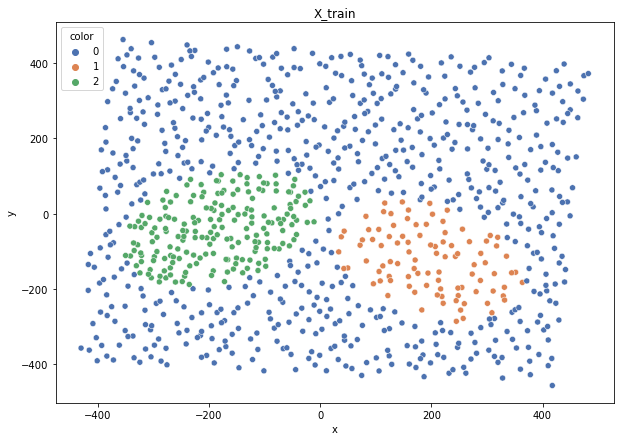

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


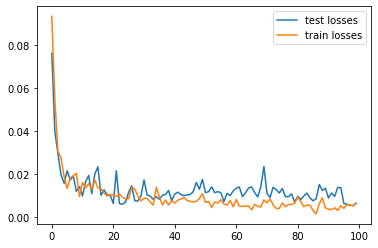

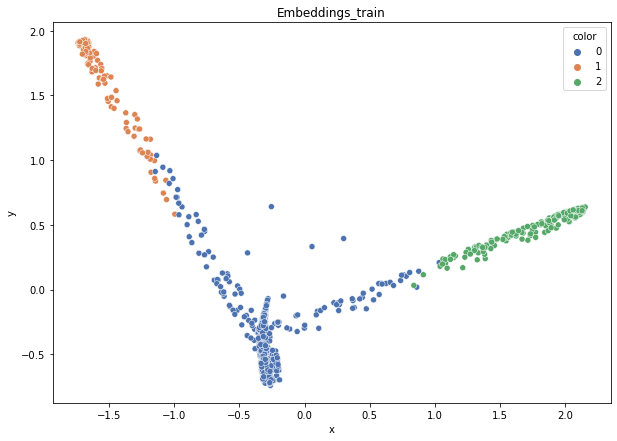

DT-f1-new-features: 0.996
DT-f1-old+new-features: 0.996
DT-f1-old-features: 0.973
DT-gmean-new-features: 0.993
DT-gmean-old+new-features: 0.993
DT-gmean-old-features: 0.973
KNN-f1-new-features: 0.983
KNN-f1-old+new-features: 0.987
KNN-f1-old-features: 0.958
KNN-gmean-new-features: 0.977
KNN-gmean-old+new-features: 0.989
KNN-gmean-old-features: 0.955
LDA-f1-new-features: 0.983
LDA-f1-old+new-features: 0.991
LDA-f1-old-features: 0.259
LDA-gmean-new-features: 0.994
LDA-gmean-old+new-features: 0.996
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.961
QDA-f1-old+new-features: 0.969
QDA-f1-old-features: 0.728
QDA-gmean-new-features: 0.957
QDA-gmean-old+new-features: 0.971
QDA-gmean-old-features: 0.59
RF24-f1-new-features: 0.991
RF24-f1-old+new-features: 0.996
RF24-f1-old-features: 0.948
RF24-gmean-new-features: 0.991
RF24-gmean-old+new-features: 0.993
RF24-gmean-old-features: 0.936
2delikatne-cut


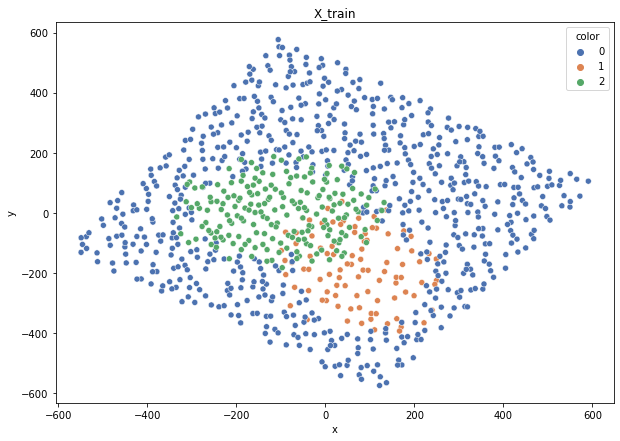

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


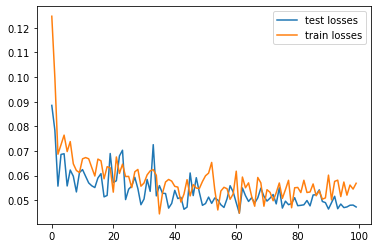

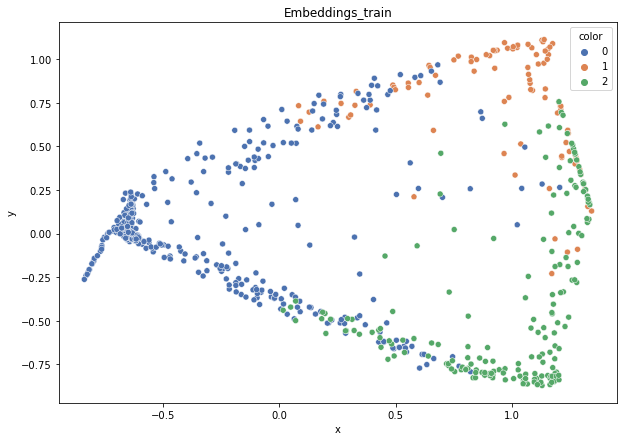

DT-f1-new-features: 0.75
DT-f1-old+new-features: 0.739
DT-f1-old-features: 0.69
DT-gmean-new-features: 0.739
DT-gmean-old+new-features: 0.722
DT-gmean-old-features: 0.674
KNN-f1-new-features: 0.743
KNN-f1-old+new-features: 0.669
KNN-f1-old-features: 0.693
KNN-gmean-new-features: 0.718
KNN-gmean-old+new-features: 0.644
KNN-gmean-old-features: 0.674
LDA-f1-new-features: 0.765
LDA-f1-old+new-features: 0.75
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.783
LDA-gmean-old+new-features: 0.768
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.776
QDA-f1-old+new-features: 0.776
QDA-f1-old-features: 0.615
QDA-gmean-new-features: 0.837
QDA-gmean-old+new-features: 0.844
QDA-gmean-old-features: 0.443
RF24-f1-new-features: 0.754
RF24-f1-old+new-features: 0.749
RF24-f1-old-features: 0.774
RF24-gmean-new-features: 0.737
RF24-gmean-old+new-features: 0.73
RF24-gmean-old-features: 0.76


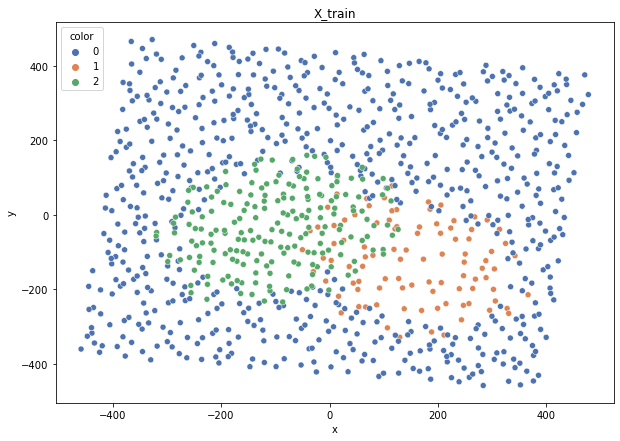

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


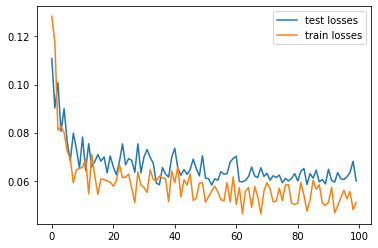

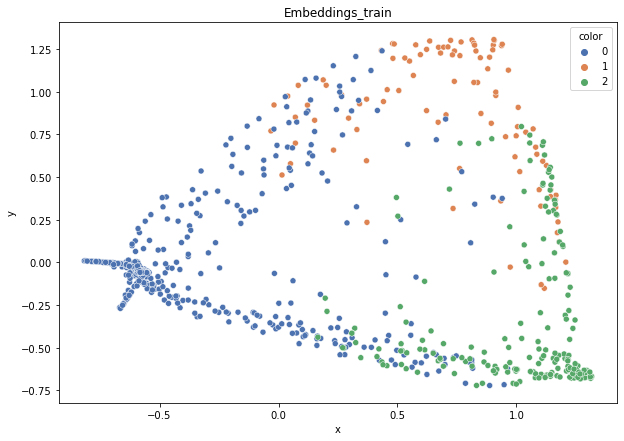

DT-f1-new-features: 0.789
DT-f1-old+new-features: 0.754
DT-f1-old-features: 0.763
DT-gmean-new-features: 0.828
DT-gmean-old+new-features: 0.788
DT-gmean-old-features: 0.787
KNN-f1-new-features: 0.785
KNN-f1-old+new-features: 0.787
KNN-f1-old-features: 0.742
KNN-gmean-new-features: 0.793
KNN-gmean-old+new-features: 0.787
KNN-gmean-old-features: 0.727
LDA-f1-new-features: 0.799
LDA-f1-old+new-features: 0.804
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.846
LDA-gmean-old+new-features: 0.847
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.758
QDA-f1-old+new-features: 0.74
QDA-f1-old-features: 0.646
QDA-gmean-new-features: 0.829
QDA-gmean-old+new-features: 0.817
QDA-gmean-old-features: 0.503
RF24-f1-new-features: 0.836
RF24-f1-old+new-features: 0.782
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.854
RF24-gmean-old+new-features: 0.798
RF24-gmean-old-features: 0.776


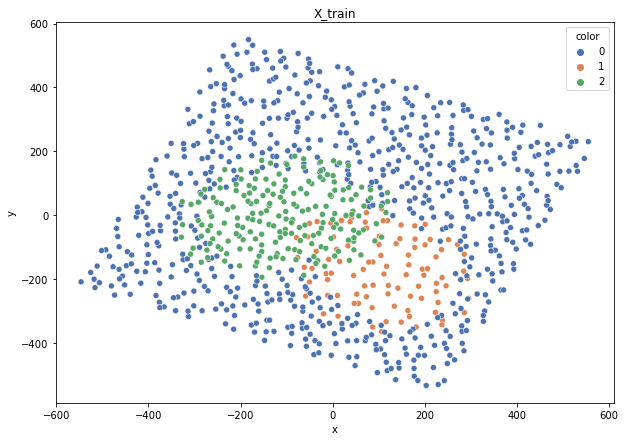

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


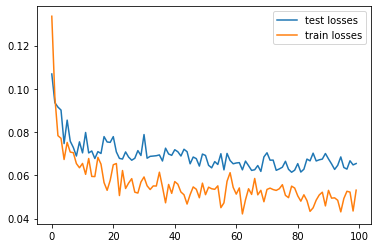

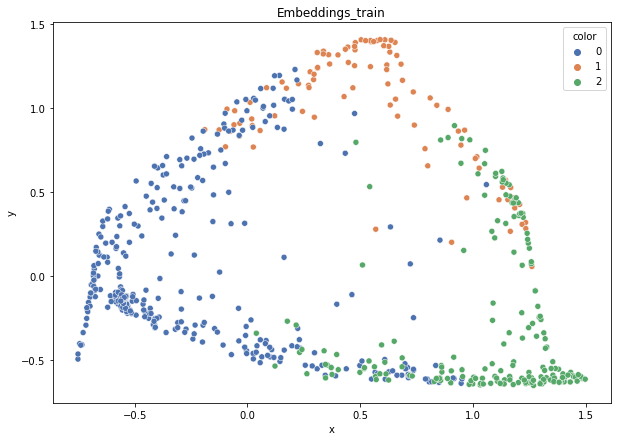

DT-f1-new-features: 0.714
DT-f1-old+new-features: 0.718
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.716
DT-gmean-old+new-features: 0.718
DT-gmean-old-features: 0.727
KNN-f1-new-features: 0.734
KNN-f1-old+new-features: 0.713
KNN-f1-old-features: 0.666
KNN-gmean-new-features: 0.707
KNN-gmean-old+new-features: 0.692
KNN-gmean-old-features: 0.636
LDA-f1-new-features: 0.791
LDA-f1-old+new-features: 0.791
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.79
LDA-gmean-old+new-features: 0.79
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.768
QDA-f1-old+new-features: 0.776
QDA-f1-old-features: 0.657
QDA-gmean-new-features: 0.797
QDA-gmean-old+new-features: 0.808
QDA-gmean-old-features: 0.514
RF24-f1-new-features: 0.737
RF24-f1-old+new-features: 0.718
RF24-f1-old-features: 0.757
RF24-gmean-new-features: 0.708
RF24-gmean-old+new-features: 0.693
RF24-gmean-old-features: 0.754


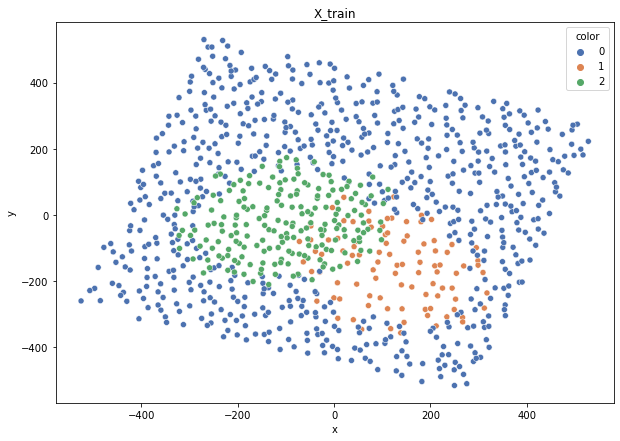

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


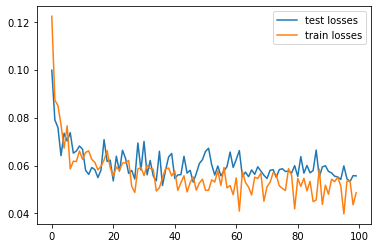

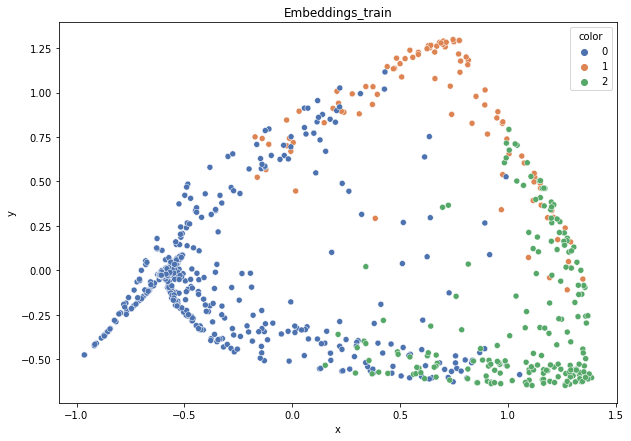

DT-f1-new-features: 0.734
DT-f1-old+new-features: 0.726
DT-f1-old-features: 0.712
DT-gmean-new-features: 0.748
DT-gmean-old+new-features: 0.752
DT-gmean-old-features: 0.724
KNN-f1-new-features: 0.779
KNN-f1-old+new-features: 0.733
KNN-f1-old-features: 0.73
KNN-gmean-new-features: 0.793
KNN-gmean-old+new-features: 0.735
KNN-gmean-old-features: 0.735
LDA-f1-new-features: 0.781
LDA-f1-old+new-features: 0.781
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.804
LDA-gmean-old+new-features: 0.804
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.757
QDA-f1-old+new-features: 0.777
QDA-f1-old-features: 0.668
QDA-gmean-new-features: 0.797
QDA-gmean-old+new-features: 0.827
QDA-gmean-old-features: 0.534
RF24-f1-new-features: 0.75
RF24-f1-old+new-features: 0.732
RF24-f1-old-features: 0.714
RF24-gmean-new-features: 0.757
RF24-gmean-old+new-features: 0.738
RF24-gmean-old-features: 0.712


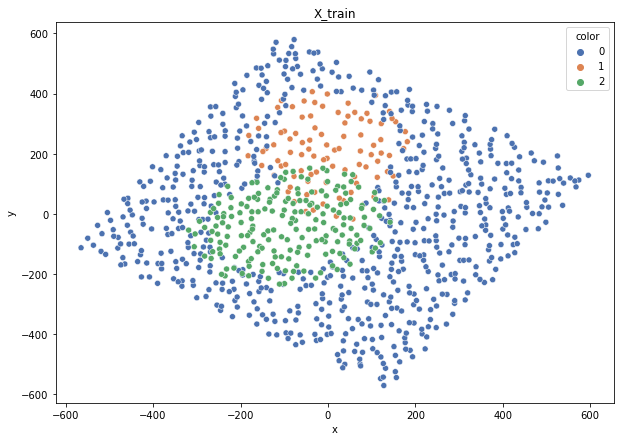

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


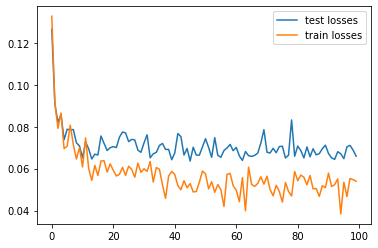

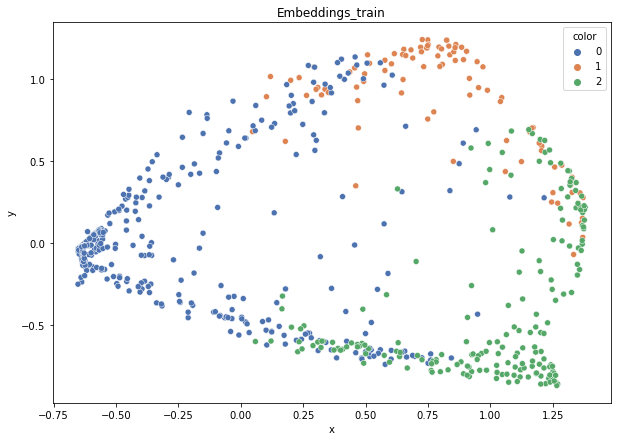

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.738
DT-f1-old+new-features: 0.772
DT-f1-old-features: 0.744
DT-gmean-new-features: 0.699
DT-gmean-old+new-features: 0.772
DT-gmean-old-features: 0.774
KNN-f1-new-features: 0.72
KNN-f1-old+new-features: 0.726
KNN-f1-old-features: 0.669
KNN-gmean-new-features: 0.701
KNN-gmean-old+new-features: 0.716
KNN-gmean-old-features: 0.62
LDA-f1-new-features: 0.815
LDA-f1-old+new-features: 0.799
LDA-f1-old-features: 0.273
LDA-gmean-new-features: 0.807
LDA-gmean-old+new-features: 0.788
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.744
QDA-f1-old+new-features: 0.736
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.73
QDA-gmean-old+new-features: 0.727
QDA-gmean-old-features: 0.579
RF24-f1-new-features: 0.752
RF24-f1-old+new-features: 0.766
RF24-f1-old-features: 0.785
RF24-gmean-new-features: 0.742
RF24-gmean-old+new-features: 0.756
RF24-gmean-old-features: 0.783
3mocniej-cut


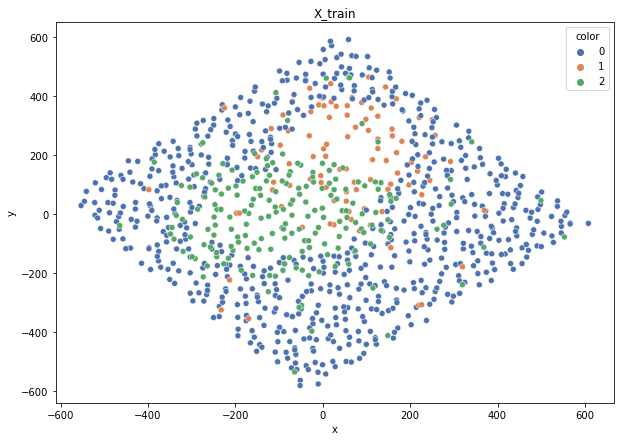

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


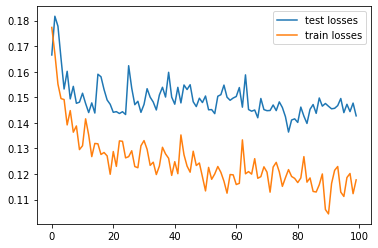

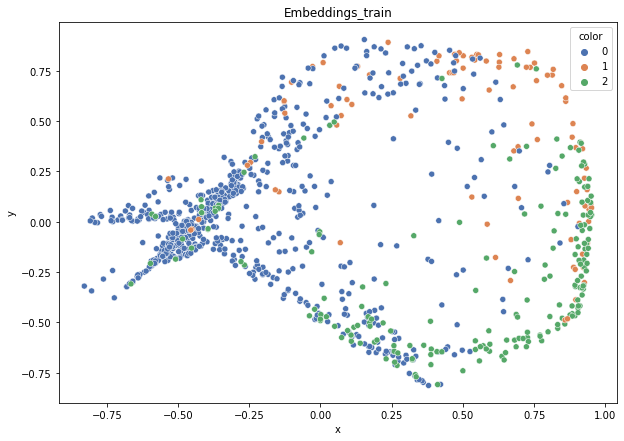

DT-f1-new-features: 0.499
DT-f1-old+new-features: 0.489
DT-f1-old-features: 0.522
DT-gmean-new-features: 0.489
DT-gmean-old+new-features: 0.487
DT-gmean-old-features: 0.524
KNN-f1-new-features: 0.576
KNN-f1-old+new-features: 0.541
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.567
KNN-gmean-old+new-features: 0.509
KNN-gmean-old-features: 0.502
LDA-f1-new-features: 0.597
LDA-f1-old+new-features: 0.613
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.562
LDA-gmean-old+new-features: 0.584
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.606
QDA-f1-old+new-features: 0.587
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.645
QDA-gmean-old+new-features: 0.613
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.554
RF24-f1-old+new-features: 0.572
RF24-f1-old-features: 0.545
RF24-gmean-new-features: 0.502
RF24-gmean-old+new-features: 0.515
RF24-gmean-old-features: 0.493


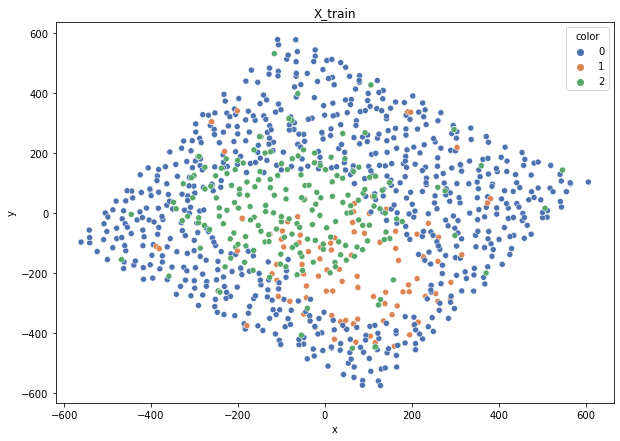

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


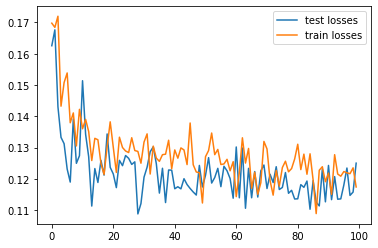

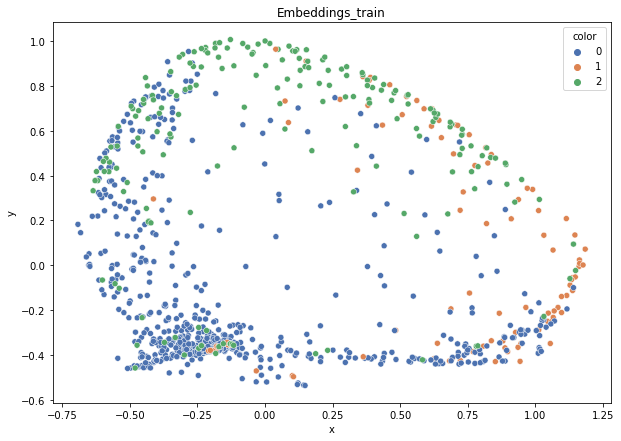

DT-f1-new-features: 0.631
DT-f1-old+new-features: 0.605
DT-f1-old-features: 0.531
DT-gmean-new-features: 0.634
DT-gmean-old+new-features: 0.599
DT-gmean-old-features: 0.547
KNN-f1-new-features: 0.584
KNN-f1-old+new-features: 0.583
KNN-f1-old-features: 0.536
KNN-gmean-new-features: 0.526
KNN-gmean-old+new-features: 0.53
KNN-gmean-old-features: 0.479
LDA-f1-new-features: 0.704
LDA-f1-old+new-features: 0.698
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.704
LDA-gmean-old+new-features: 0.696
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.645
QDA-f1-old+new-features: 0.641
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.687
QDA-gmean-old+new-features: 0.691
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.678
RF24-f1-old+new-features: 0.659
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.641
RF24-gmean-old+new-features: 0.628
RF24-gmean-old-features: 0.551


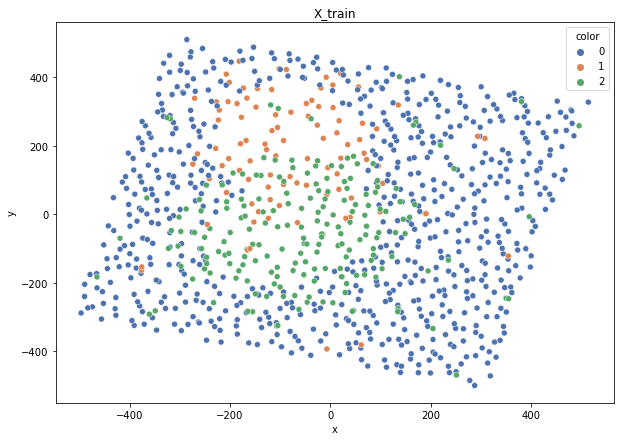

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


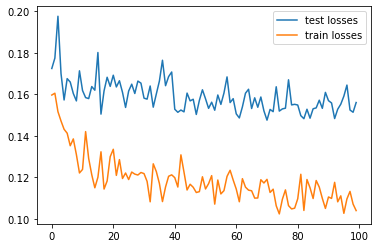

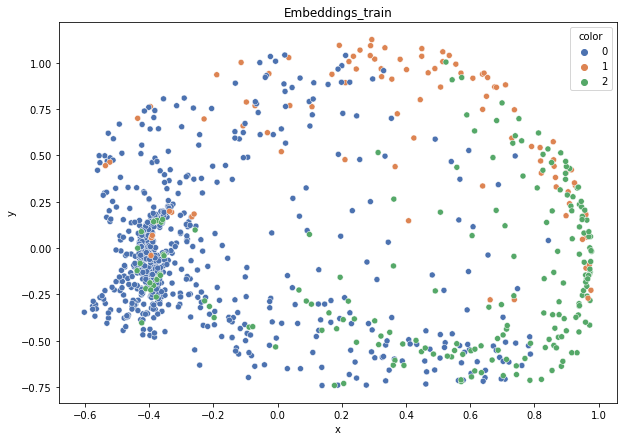

DT-f1-new-features: 0.47
DT-f1-old+new-features: 0.459
DT-f1-old-features: 0.442
DT-gmean-new-features: 0.434
DT-gmean-old+new-features: 0.437
DT-gmean-old-features: 0.43
KNN-f1-new-features: 0.466
KNN-f1-old+new-features: 0.446
KNN-f1-old-features: 0.438
KNN-gmean-new-features: 0.418
KNN-gmean-old+new-features: 0.386
KNN-gmean-old-features: 0.373
LDA-f1-new-features: 0.515
LDA-f1-old+new-features: 0.522
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.446
LDA-gmean-old+new-features: 0.451
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.544
QDA-f1-old+new-features: 0.524
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.572
QDA-gmean-old+new-features: 0.55
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.49
RF24-f1-old+new-features: 0.479
RF24-f1-old-features: 0.481
RF24-gmean-new-features: 0.413
RF24-gmean-old+new-features: 0.398
RF24-gmean-old-features: 0.396


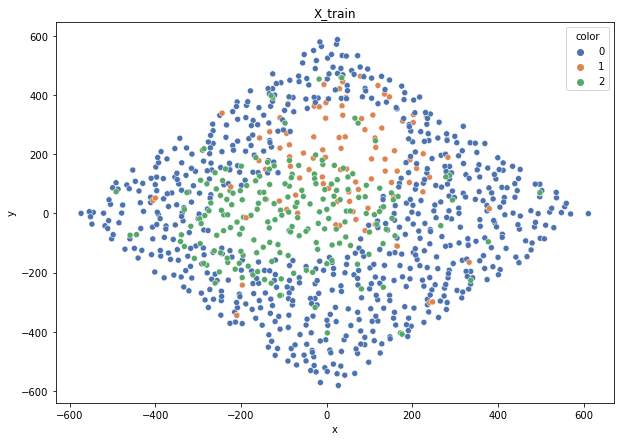

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


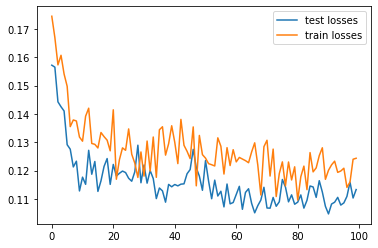

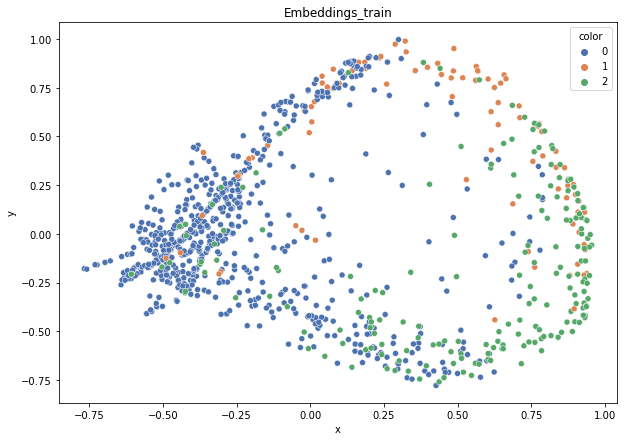

DT-f1-new-features: 0.541
DT-f1-old+new-features: 0.562
DT-f1-old-features: 0.477
DT-gmean-new-features: 0.514
DT-gmean-old+new-features: 0.555
DT-gmean-old-features: 0.473
KNN-f1-new-features: 0.519
KNN-f1-old+new-features: 0.485
KNN-f1-old-features: 0.51
KNN-gmean-new-features: 0.482
KNN-gmean-old+new-features: 0.425
KNN-gmean-old-features: 0.464
LDA-f1-new-features: 0.645
LDA-f1-old+new-features: 0.648
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.622
LDA-gmean-old+new-features: 0.623
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.634
QDA-f1-old+new-features: 0.59
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.667
QDA-gmean-old+new-features: 0.637
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.564
RF24-f1-old+new-features: 0.557
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.521
RF24-gmean-old+new-features: 0.519
RF24-gmean-old-features: 0.584


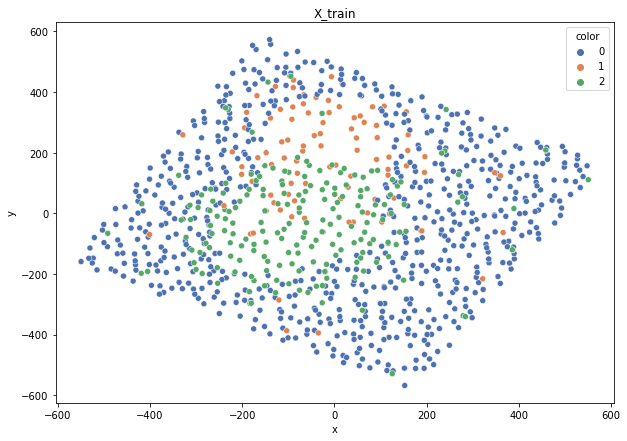

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


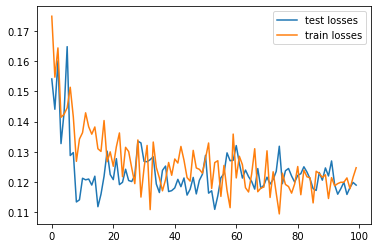

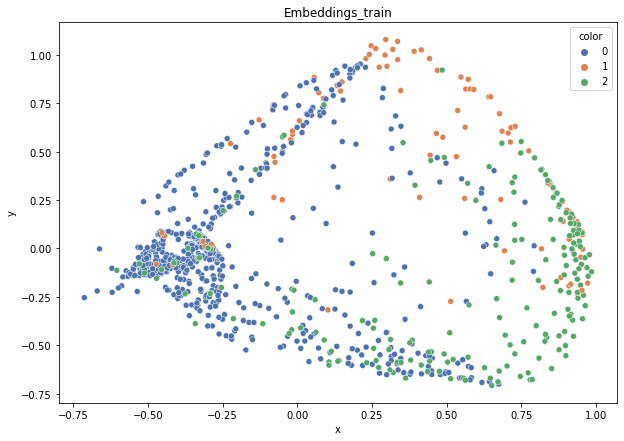

DT-f1-new-features: 0.566
DT-f1-old+new-features: 0.572
DT-f1-old-features: 0.552
DT-gmean-new-features: 0.563
DT-gmean-old+new-features: 0.574
DT-gmean-old-features: 0.536
KNN-f1-new-features: 0.561
KNN-f1-old+new-features: 0.533
KNN-f1-old-features: 0.522
KNN-gmean-new-features: 0.559
KNN-gmean-old+new-features: 0.489
KNN-gmean-old-features: 0.471
LDA-f1-new-features: 0.654
LDA-f1-old+new-features: 0.652
LDA-f1-old-features: 0.275
LDA-gmean-new-features: 0.61
LDA-gmean-old+new-features: 0.61
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.598
QDA-f1-old+new-features: 0.563
QDA-f1-old-features: 0.275
QDA-gmean-new-features: 0.635
QDA-gmean-old+new-features: 0.616
QDA-gmean-old-features: 0.01
RF24-f1-new-features: 0.517
RF24-f1-old+new-features: 0.547
RF24-f1-old-features: 0.612
RF24-gmean-new-features: 0.392
RF24-gmean-old+new-features: 0.464
RF24-gmean-old-features: 0.574
4delikatne-bezover-cut


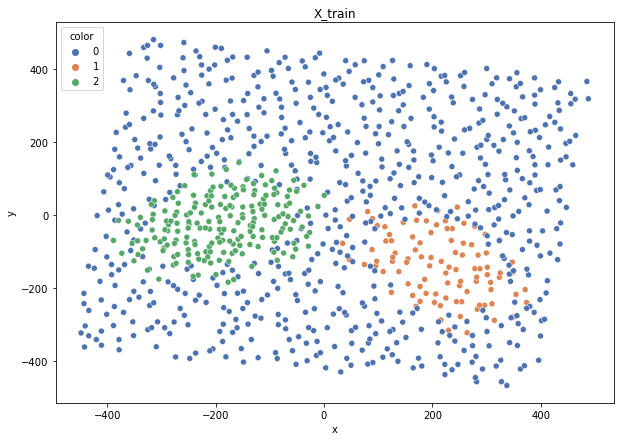

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


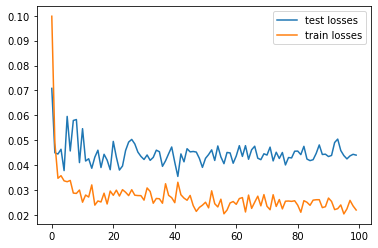

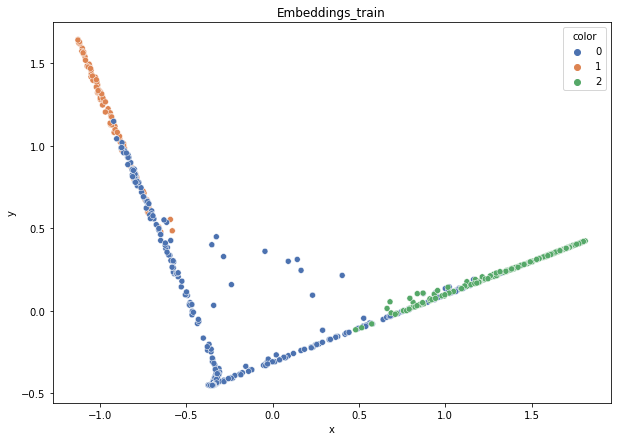

DT-f1-new-features: 0.826
DT-f1-old+new-features: 0.801
DT-f1-old-features: 0.809
DT-gmean-new-features: 0.792
DT-gmean-old+new-features: 0.794
DT-gmean-old-features: 0.814
KNN-f1-new-features: 0.802
KNN-f1-old+new-features: 0.788
KNN-f1-old-features: 0.772
KNN-gmean-new-features: 0.778
KNN-gmean-old+new-features: 0.757
KNN-gmean-old-features: 0.746
LDA-f1-new-features: 0.816
LDA-f1-old+new-features: 0.822
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.814
LDA-gmean-old+new-features: 0.816
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.792
QDA-f1-old+new-features: 0.817
QDA-f1-old-features: 0.739
QDA-gmean-new-features: 0.826
QDA-gmean-old+new-features: 0.869
QDA-gmean-old-features: 0.64
RF24-f1-new-features: 0.804
RF24-f1-old+new-features: 0.804
RF24-f1-old-features: 0.811
RF24-gmean-new-features: 0.785
RF24-gmean-old+new-features: 0.794
RF24-gmean-old-features: 0.811


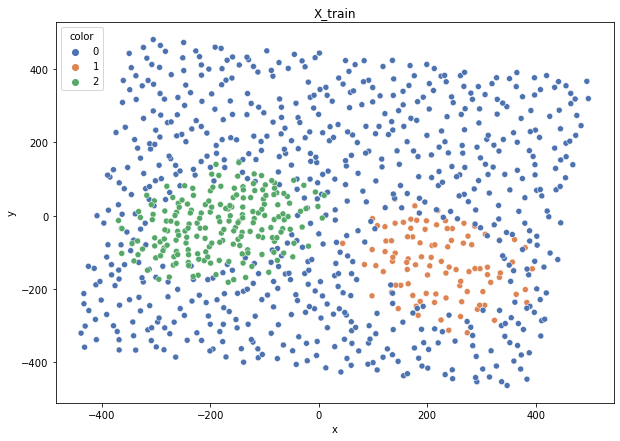

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


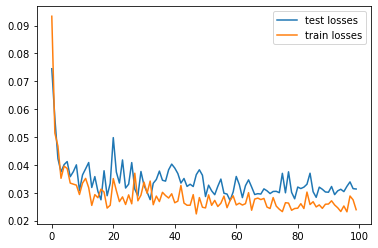

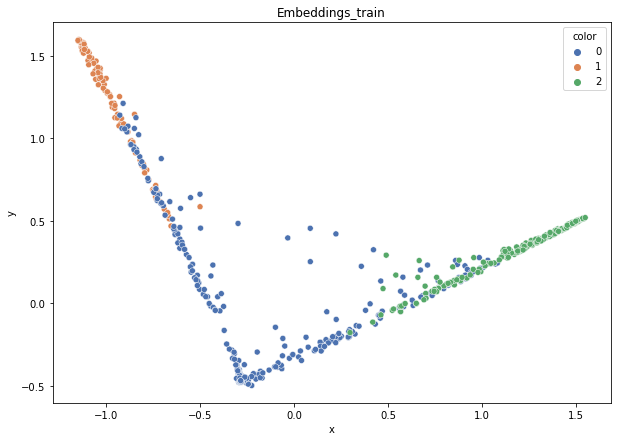

DT-f1-new-features: 0.861
DT-f1-old+new-features: 0.843
DT-f1-old-features: 0.761
DT-gmean-new-features: 0.848
DT-gmean-old+new-features: 0.841
DT-gmean-old-features: 0.769
KNN-f1-new-features: 0.813
KNN-f1-old+new-features: 0.777
KNN-f1-old-features: 0.767
KNN-gmean-new-features: 0.804
KNN-gmean-old+new-features: 0.774
KNN-gmean-old-features: 0.776
LDA-f1-new-features: 0.819
LDA-f1-old+new-features: 0.824
LDA-f1-old-features: 0.274
LDA-gmean-new-features: 0.856
LDA-gmean-old+new-features: 0.858
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.828
QDA-f1-old+new-features: 0.823
QDA-f1-old-features: 0.843
QDA-gmean-new-features: 0.894
QDA-gmean-old+new-features: 0.892
QDA-gmean-old-features: 0.8
RF24-f1-new-features: 0.827
RF24-f1-old+new-features: 0.803
RF24-f1-old-features: 0.826
RF24-gmean-new-features: 0.833
RF24-gmean-old+new-features: 0.805
RF24-gmean-old-features: 0.845


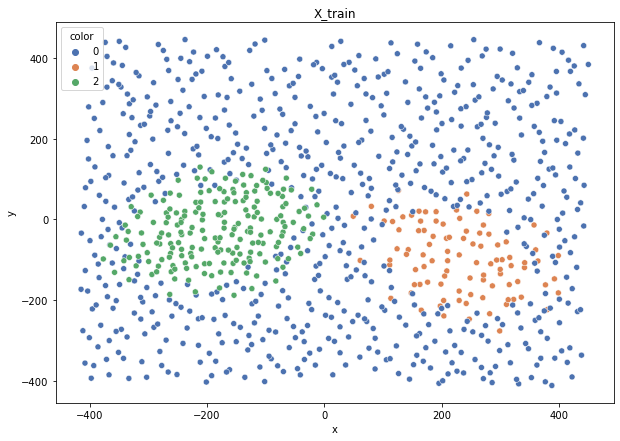

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


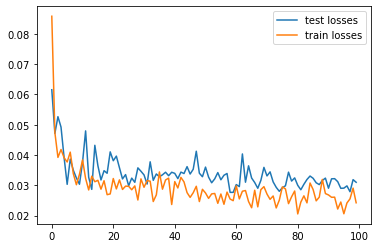

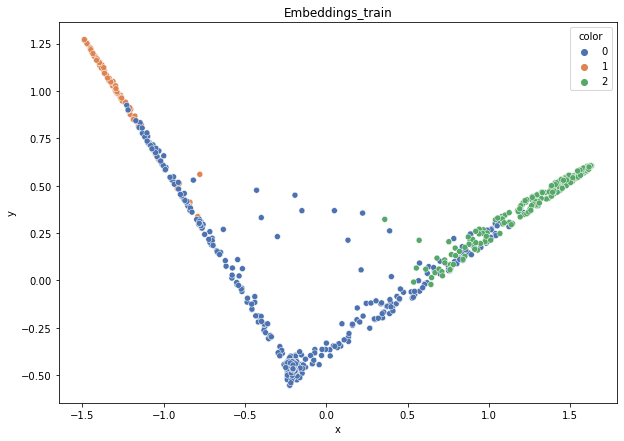

DT-f1-new-features: 0.852
DT-f1-old+new-features: 0.84
DT-f1-old-features: 0.785
DT-gmean-new-features: 0.854
DT-gmean-old+new-features: 0.82
DT-gmean-old-features: 0.785
KNN-f1-new-features: 0.856
KNN-f1-old+new-features: 0.796
KNN-f1-old-features: 0.766
KNN-gmean-new-features: 0.83
KNN-gmean-old+new-features: 0.773
KNN-gmean-old-features: 0.744
LDA-f1-new-features: 0.857
LDA-f1-old+new-features: 0.857
LDA-f1-old-features: 0.276
LDA-gmean-new-features: 0.888
LDA-gmean-old+new-features: 0.888
LDA-gmean-old-features: 0.027
QDA-f1-new-features: 0.833
QDA-f1-old+new-features: 0.833
QDA-f1-old-features: 0.718
QDA-gmean-new-features: 0.901
QDA-gmean-old+new-features: 0.906
QDA-gmean-old-features: 0.599
RF24-f1-new-features: 0.839
RF24-f1-old+new-features: 0.833
RF24-f1-old-features: 0.801
RF24-gmean-new-features: 0.833
RF24-gmean-old+new-features: 0.818
RF24-gmean-old-features: 0.78


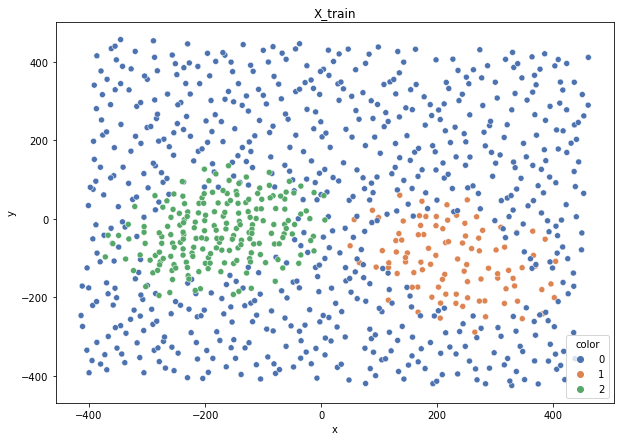

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


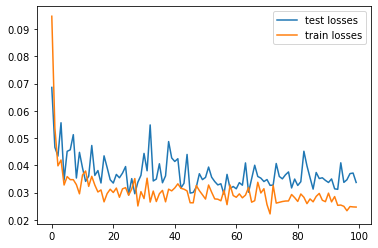

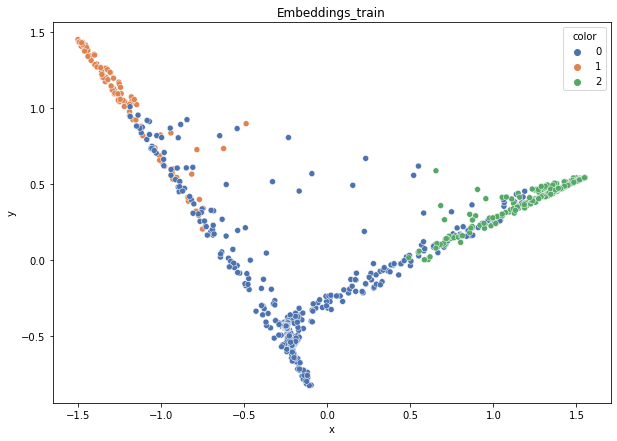

DT-f1-new-features: 0.813
DT-f1-old+new-features: 0.827
DT-f1-old-features: 0.805
DT-gmean-new-features: 0.835
DT-gmean-old+new-features: 0.839
DT-gmean-old-features: 0.831
KNN-f1-new-features: 0.841
KNN-f1-old+new-features: 0.758
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.84
KNN-gmean-old+new-features: 0.764
KNN-gmean-old-features: 0.749
LDA-f1-new-features: 0.863
LDA-f1-old+new-features: 0.86
LDA-f1-old-features: 0.265
LDA-gmean-new-features: 0.928
LDA-gmean-old+new-features: 0.925
LDA-gmean-old-features: 0.01
QDA-f1-new-features: 0.822
QDA-f1-old+new-features: 0.797
QDA-f1-old-features: 0.828
QDA-gmean-new-features: 0.919
QDA-gmean-old+new-features: 0.897
QDA-gmean-old-features: 0.78
RF24-f1-new-features: 0.823
RF24-f1-old+new-features: 0.816
RF24-f1-old-features: 0.827
RF24-gmean-new-features: 0.844
RF24-gmean-old+new-features: 0.838
RF24-gmean-old-features: 0.871


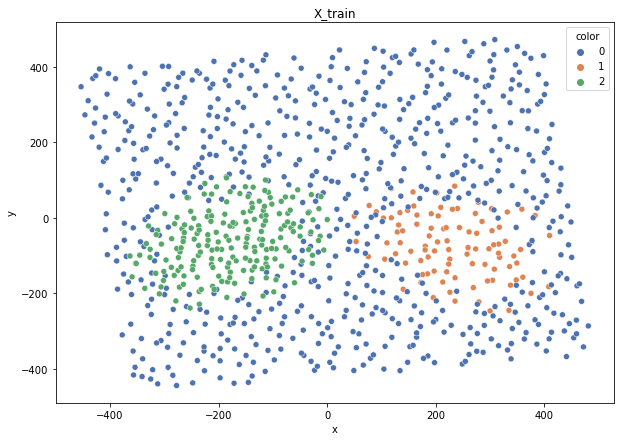

Class cardinalities: Counter({0: 672, 2: 192, 1: 96})
Weights: {1: 0.6086956521739131, 0: 0.08695652173913043, 2: 0.30434782608695654}


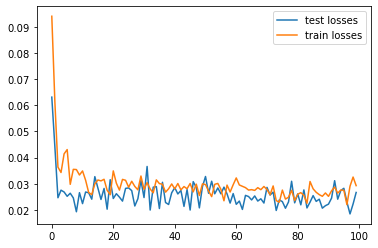

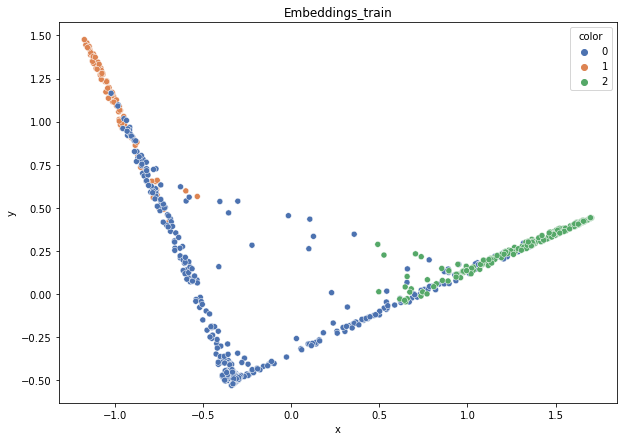

DT-f1-new-features: 0.828
DT-f1-old+new-features: 0.813
DT-f1-old-features: 0.821
DT-gmean-new-features: 0.853
DT-gmean-old+new-features: 0.833
DT-gmean-old-features: 0.866
KNN-f1-new-features: 0.852
KNN-f1-old+new-features: 0.809
KNN-f1-old-features: 0.786
KNN-gmean-new-features: 0.869
KNN-gmean-old+new-features: 0.815
KNN-gmean-old-features: 0.788
LDA-f1-new-features: 0.878
LDA-f1-old+new-features: 0.878
LDA-f1-old-features: 0.264
LDA-gmean-new-features: 0.915
LDA-gmean-old+new-features: 0.915
LDA-gmean-old-features: 0.026
QDA-f1-new-features: 0.847
QDA-f1-old+new-features: 0.857
QDA-f1-old-features: 0.841
QDA-gmean-new-features: 0.939
QDA-gmean-old+new-features: 0.943
QDA-gmean-old-features: 0.767
RF24-f1-new-features: 0.856
RF24-f1-old+new-features: 0.858
RF24-f1-old-features: 0.836
RF24-gmean-new-features: 0.891
RF24-gmean-old+new-features: 0.887
RF24-gmean-old-features: 0.87
balance-scale


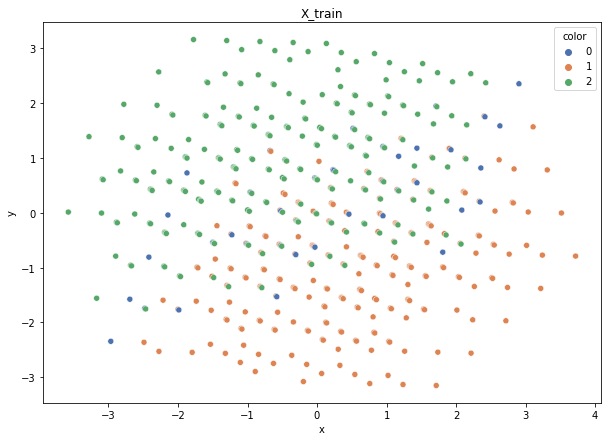

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


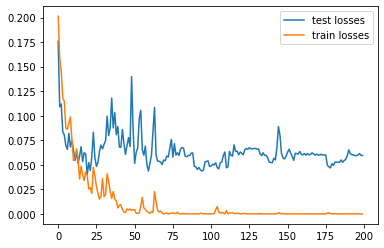

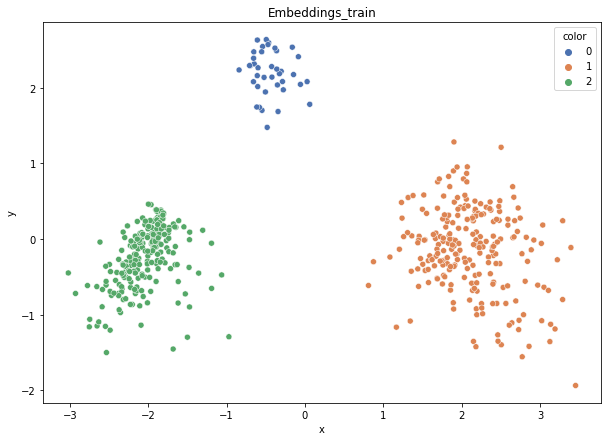

DT-f1-new-features: 0.883
DT-f1-old+new-features: 0.883
DT-f1-old-features: 0.568
DT-gmean-new-features: 0.914
DT-gmean-old+new-features: 0.914
DT-gmean-old-features: 0.088
KNN-f1-new-features: 0.907
KNN-f1-old+new-features: 0.921
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.959
KNN-gmean-old+new-features: 0.965
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.907
LDA-f1-old+new-features: 0.907
LDA-f1-old-features: 0.617
LDA-gmean-new-features: 0.959
LDA-gmean-old+new-features: 0.959
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.956
QDA-f1-old+new-features: 0.956
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.943
QDA-gmean-old+new-features: 0.943
QDA-gmean-old-features: 0.971
RF24-f1-new-features: 0.932
RF24-f1-old+new-features: 0.951
RF24-f1-old-features: 0.585
RF24-gmean-new-features: 0.932
RF24-gmean-old+new-features: 0.937
RF24-gmean-old-features: 0.092


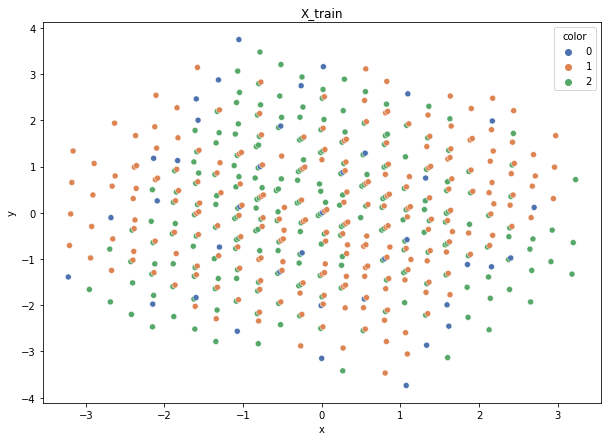

Class cardinalities: Counter({1: 231, 2: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.1266928236932034, 1: 0.12614436991098174}


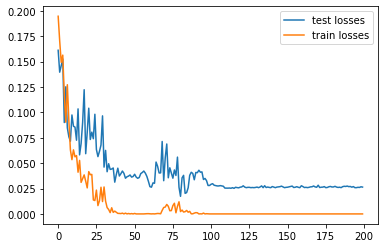

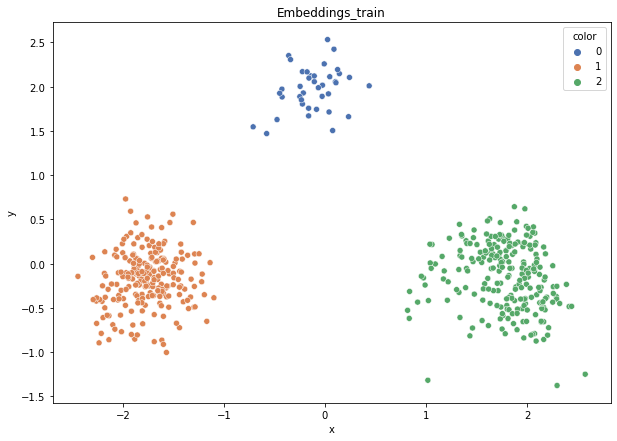

DT-f1-new-features: 0.917
DT-f1-old+new-features: 0.917
DT-f1-old-features: 0.638
DT-gmean-new-features: 0.889
DT-gmean-old+new-features: 0.889
DT-gmean-old-features: 0.585
KNN-f1-new-features: 0.94
KNN-f1-old+new-features: 0.932
KNN-f1-old-features: 0.545
KNN-gmean-new-features: 0.965
KNN-gmean-old+new-features: 0.943
KNN-gmean-old-features: 0.088
LDA-f1-new-features: 0.946
LDA-f1-old+new-features: 0.946
LDA-f1-old-features: 0.601
LDA-gmean-new-features: 0.97
LDA-gmean-old+new-features: 0.97
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.904
QDA-f1-old+new-features: 0.921
QDA-f1-old-features: 0.845
QDA-gmean-new-features: 0.862
QDA-gmean-old+new-features: 0.878
QDA-gmean-old-features: 0.908
RF24-f1-new-features: 0.971
RF24-f1-old+new-features: 0.923
RF24-f1-old-features: 0.591
RF24-gmean-new-features: 0.971
RF24-gmean-old+new-features: 0.896
RF24-gmean-old-features: 0.092


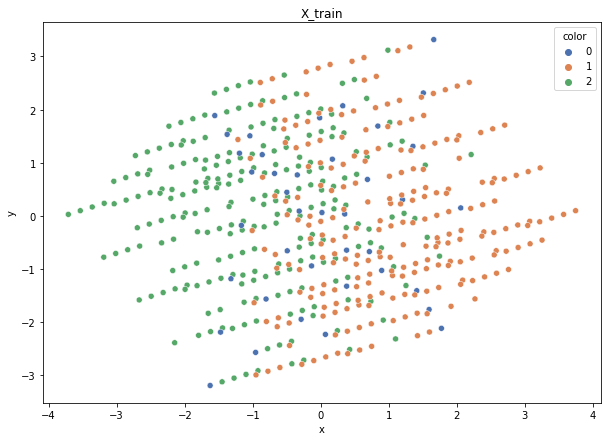

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {2: 0.12614436991098174, 1: 0.1266928236932034, 0: 0.7471628063958148}


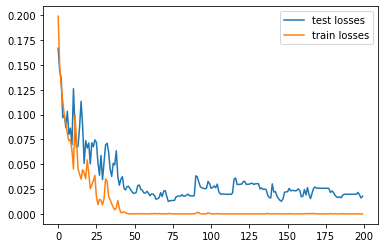

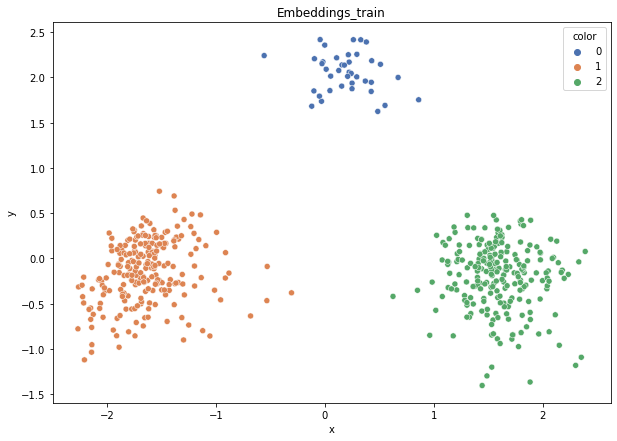

DT-f1-new-features: 0.859
DT-f1-old+new-features: 0.859
DT-f1-old-features: 0.655
DT-gmean-new-features: 0.814
DT-gmean-old+new-features: 0.814
DT-gmean-old-features: 0.597
KNN-f1-new-features: 0.962
KNN-f1-old+new-features: 0.94
KNN-f1-old-features: 0.566
KNN-gmean-new-features: 0.949
KNN-gmean-old+new-features: 0.912
KNN-gmean-old-features: 0.09
LDA-f1-new-features: 0.994
LDA-f1-old+new-features: 0.975
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.994
LDA-gmean-old+new-features: 0.988
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.974
QDA-f1-old+new-features: 0.946
QDA-f1-old-features: 0.836
QDA-gmean-new-features: 0.96
QDA-gmean-old+new-features: 0.917
QDA-gmean-old-features: 0.923
RF24-f1-new-features: 0.946
RF24-f1-old+new-features: 0.946
RF24-f1-old-features: 0.602
RF24-gmean-new-features: 0.918
RF24-gmean-old+new-features: 0.918
RF24-gmean-old-features: 0.093


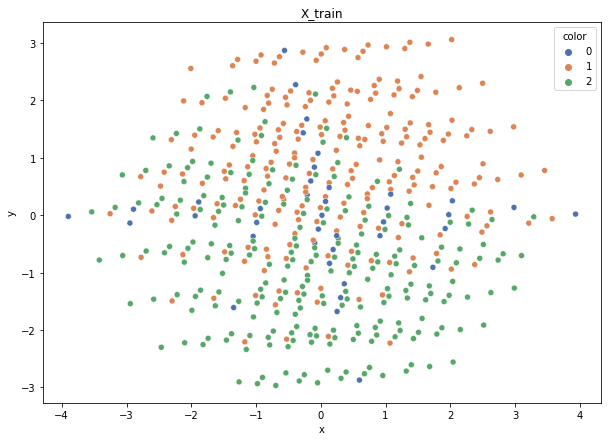

Class cardinalities: Counter({2: 231, 1: 230, 0: 39})
Weights: {0: 0.7471628063958148, 2: 0.12614436991098174, 1: 0.1266928236932034}


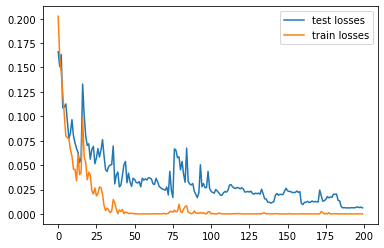

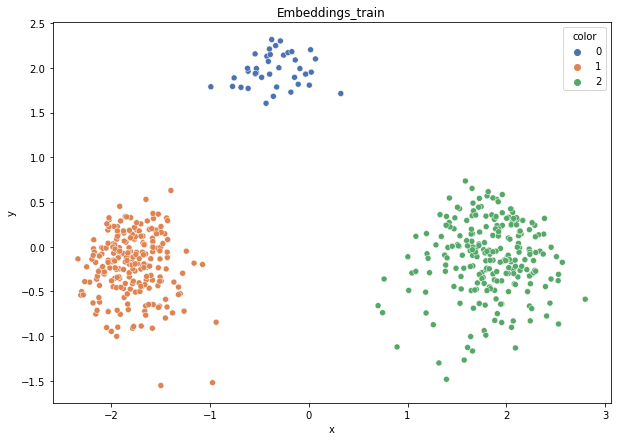

DT-f1-new-features: 0.916
DT-f1-old+new-features: 0.916
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.872
DT-gmean-old+new-features: 0.872
DT-gmean-old-features: 0.397
KNN-f1-new-features: 0.988
KNN-f1-old+new-features: 0.968
KNN-f1-old-features: 0.562
KNN-gmean-new-features: 0.988
KNN-gmean-old+new-features: 0.954
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.988
LDA-f1-old+new-features: 0.988
LDA-f1-old-features: 0.6
LDA-gmean-new-features: 0.988
LDA-gmean-old+new-features: 0.988
LDA-gmean-old-features: 0.096
QDA-f1-new-features: 0.968
QDA-f1-old+new-features: 0.974
QDA-f1-old-features: 0.809
QDA-gmean-new-features: 0.954
QDA-gmean-old+new-features: 0.96
QDA-gmean-old-features: 0.862
RF24-f1-new-features: 0.983
RF24-f1-old+new-features: 0.983
RF24-f1-old-features: 0.603
RF24-gmean-new-features: 0.983
RF24-gmean-old+new-features: 0.983
RF24-gmean-old-features: 0.094


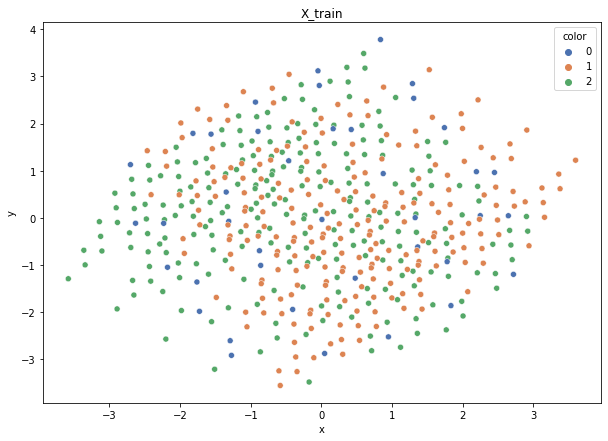

Class cardinalities: Counter({2: 230, 1: 230, 0: 40})
Weights: {0: 0.7419354838709677, 2: 0.12903225806451613, 1: 0.12903225806451613}


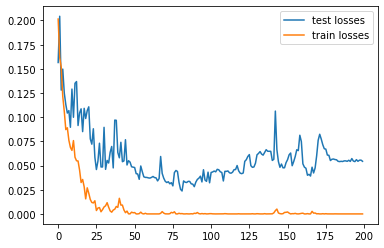

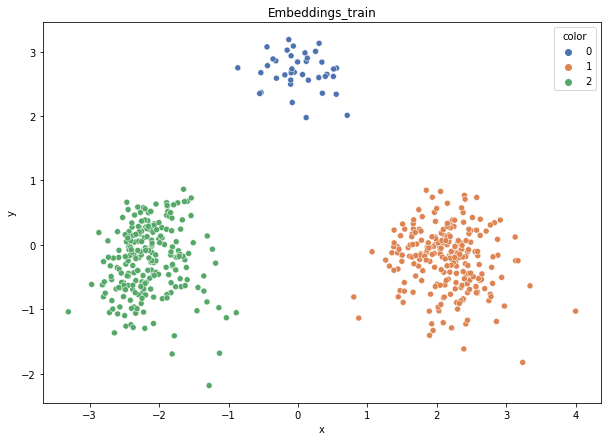

DT-f1-new-features: 0.82
DT-f1-old+new-features: 0.797
DT-f1-old-features: 0.582
DT-gmean-new-features: 0.789
DT-gmean-old+new-features: 0.769
DT-gmean-old-features: 0.415
KNN-f1-new-features: 0.916
KNN-f1-old+new-features: 0.916
KNN-f1-old-features: 0.563
KNN-gmean-new-features: 0.928
KNN-gmean-old+new-features: 0.928
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.934
LDA-f1-old+new-features: 0.957
LDA-f1-old-features: 0.62
LDA-gmean-new-features: 0.934
LDA-gmean-old+new-features: 0.971
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.896
QDA-f1-old+new-features: 0.896
QDA-f1-old-features: 0.859
QDA-gmean-new-features: 0.848
QDA-gmean-old+new-features: 0.848
QDA-gmean-old-features: 0.917
RF24-f1-new-features: 0.917
RF24-f1-old+new-features: 0.898
RF24-f1-old-features: 0.587
RF24-gmean-new-features: 0.917
RF24-gmean-old+new-features: 0.911
RF24-gmean-old-features: 0.091
cleveland


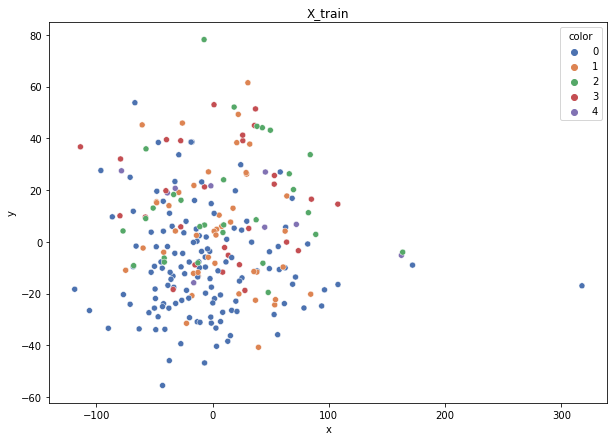

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


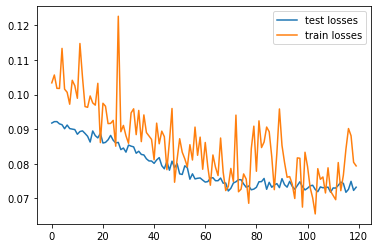

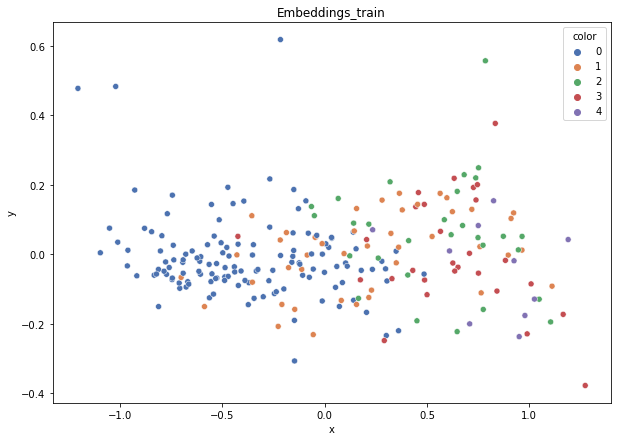

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.35
DT-f1-old+new-features: 0.328
DT-f1-old-features: 0.266
DT-gmean-new-features: 0.114
DT-gmean-old+new-features: 0.105
DT-gmean-old-features: 0.098
KNN-f1-new-features: 0.426
KNN-f1-old+new-features: 0.275
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.384
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.089
LDA-f1-new-features: 0.427
LDA-f1-old+new-features: 0.386
LDA-f1-old-features: 0.365
LDA-gmean-new-features: 0.132
LDA-gmean-old+new-features: 0.124
LDA-gmean-old-features: 0.111
QDA-f1-new-features: 0.339
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.392
QDA-gmean-new-features: 0.106
QDA-gmean-old+new-features: 0.012
QDA-gmean-old-features: 0.132
RF24-f1-new-features: 0.38
RF24-f1-old+new-features: 0.41
RF24-f1-old-features: 0.316
RF24-gmean-new-features: 0.122
RF24-gmean-old+new-features: 0.135
RF24-gmean-old-features: 0.092


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


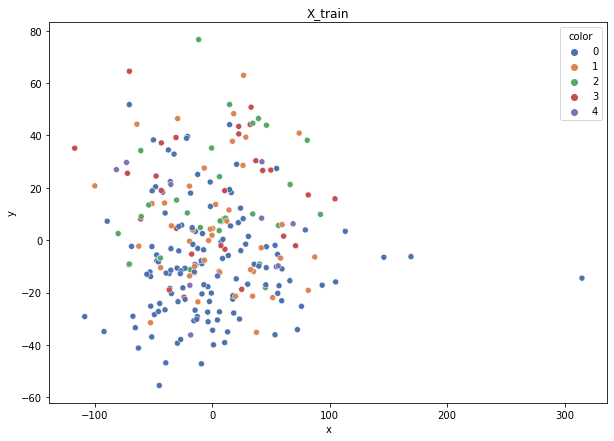

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 2: 0.1719341785442781, 1: 0.11332025404054694, 3: 0.17807468492085946, 4: 0.4986091177784065}


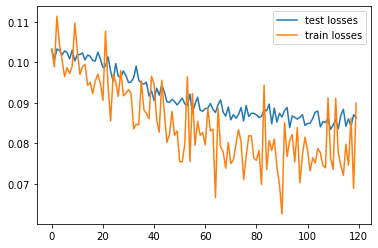

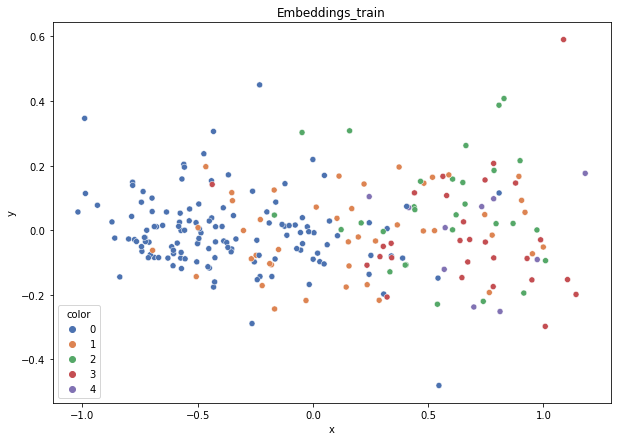

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.372
DT-f1-old+new-features: 0.309
DT-f1-old-features: 0.281
DT-gmean-new-features: 0.143
DT-gmean-old+new-features: 0.121
DT-gmean-old-features: 0.101
KNN-f1-new-features: 0.331
KNN-f1-old+new-features: 0.38
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.119
KNN-gmean-old+new-features: 0.14
KNN-gmean-old-features: 0.122
LDA-f1-new-features: 0.426
LDA-f1-old+new-features: 0.405
LDA-f1-old-features: 0.355
LDA-gmean-new-features: 0.394
LDA-gmean-old+new-features: 0.363
LDA-gmean-old-features: 0.108
QDA-f1-new-features: 0.309
QDA-f1-old+new-features: 0.169
QDA-f1-old-features: 0.39
QDA-gmean-new-features: 0.04
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.136
RF24-f1-new-features: 0.361
RF24-f1-old+new-features: 0.466
RF24-f1-old-features: 0.307
RF24-gmean-new-features: 0.121
RF24-gmean-old+new-features: 0.402
RF24-gmean-old-features: 0.093


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


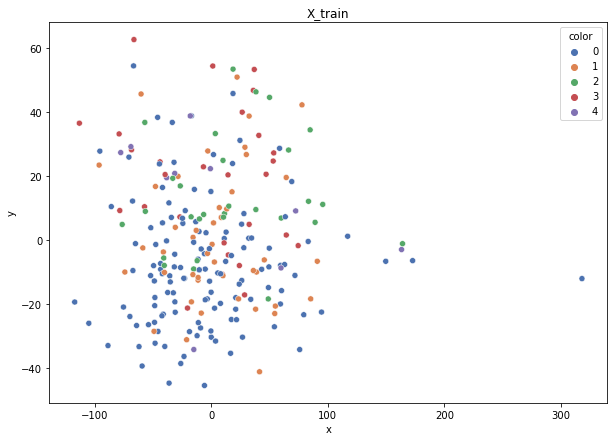

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 10})
Weights: {0: 0.03806176471590889, 3: 0.17807468492085946, 1: 0.11332025404054694, 2: 0.1719341785442781, 4: 0.4986091177784065}


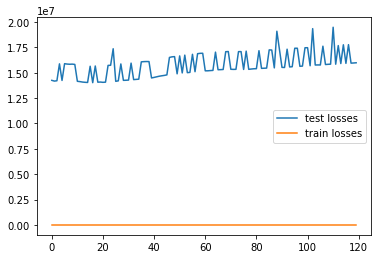

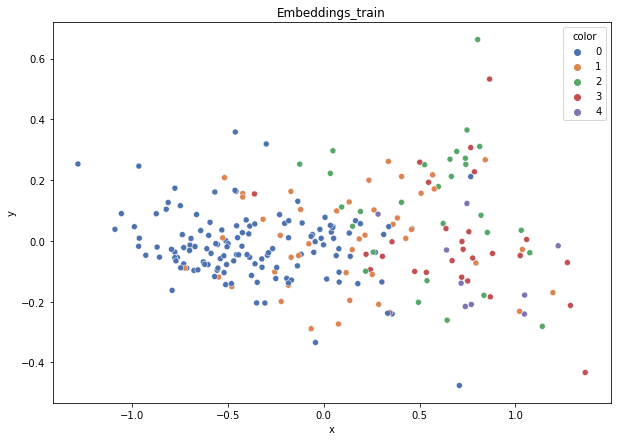

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.219
DT-f1-old+new-features: 0.284
DT-f1-old-features: 0.368
DT-gmean-new-features: 0.03
DT-gmean-old+new-features: 0.099
DT-gmean-old-features: 0.128
KNN-f1-new-features: 0.359
KNN-f1-old+new-features: 0.331
KNN-f1-old-features: 0.325
KNN-gmean-new-features: 0.129
KNN-gmean-old+new-features: 0.115
KNN-gmean-old-features: 0.109
LDA-f1-new-features: 0.37
LDA-f1-old+new-features: 0.248
LDA-f1-old-features: 0.261
LDA-gmean-new-features: 0.124
LDA-gmean-old+new-features: 0.034
LDA-gmean-old-features: 0.034
QDA-f1-new-features: 0.248
QDA-f1-old+new-features: 0.17
QDA-f1-old-features: 0.345
QDA-gmean-new-features: 0.032
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.12
RF24-f1-new-features: 0.266
RF24-f1-old+new-features: 0.258
RF24-f1-old-features: 0.315
RF24-gmean-new-features: 0.079
RF24-gmean-old+new-features: 0.079
RF24-gmean-old-features: 0.1


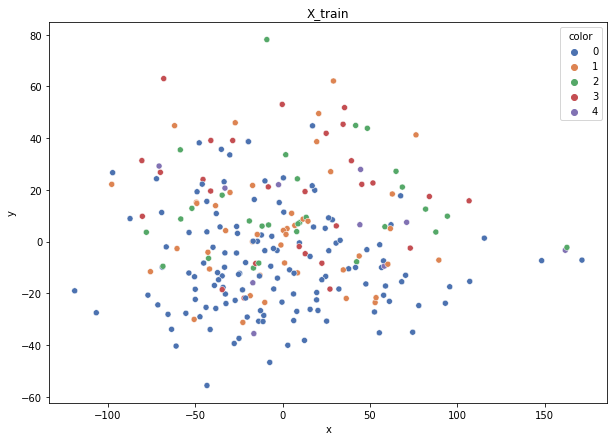

Class cardinalities: Counter({0: 131, 1: 44, 2: 29, 3: 28, 4: 11})
Weights: {0: 0.03986894846317969, 2: 0.18009766374746689, 1: 0.11870073292446681, 3: 0.18652972316701927, 4: 0.47480293169786725}


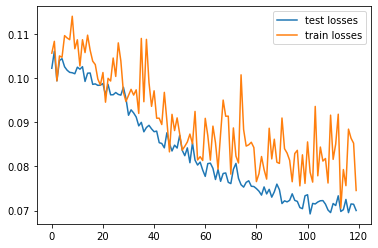

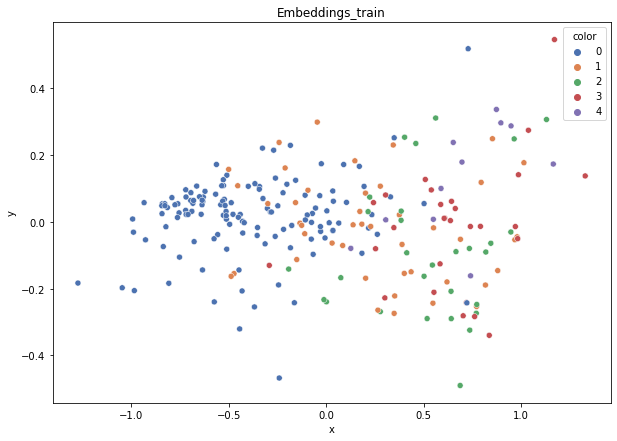

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.329
DT-f1-old+new-features: 0.331
DT-f1-old-features: 0.305
DT-gmean-new-features: 0.123
DT-gmean-old+new-features: 0.123
DT-gmean-old-features: 0.112
KNN-f1-new-features: 0.311
KNN-f1-old+new-features: 0.274
KNN-f1-old-features: 0.254
KNN-gmean-new-features: 0.102
KNN-gmean-old+new-features: 0.089
KNN-gmean-old-features: 0.036
LDA-f1-new-features: 0.254
LDA-f1-old+new-features: 0.267
LDA-f1-old-features: 0.287
LDA-gmean-new-features: 0.034
LDA-gmean-old+new-features: 0.034
LDA-gmean-old-features: 0.086
QDA-f1-new-features: 0.274
QDA-f1-old+new-features: 0.172
QDA-f1-old-features: 0.254
QDA-gmean-new-features: 0.034
QDA-gmean-old+new-features: 0.01
QDA-gmean-old-features: 0.032
RF24-f1-new-features: 0.278
RF24-f1-old+new-features: 0.271
RF24-f1-old-features: 0.309
RF24-gmean-new-features: 0.037
RF24-gmean-old+new-features: 0.037
RF24-gmean-old-features: 0.098


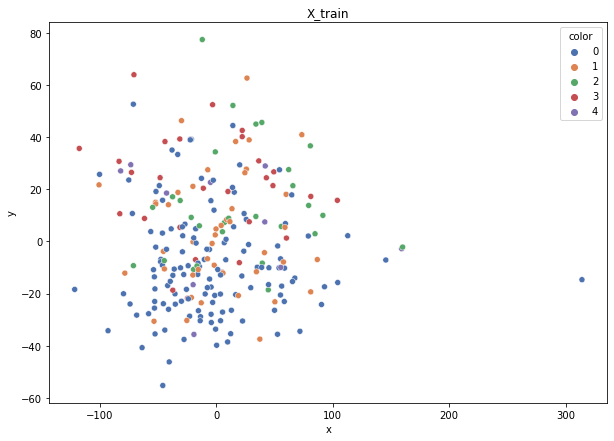

Class cardinalities: Counter({0: 132, 1: 44, 2: 28, 3: 28, 4: 11})
Weights: {2: 0.18539325842696627, 1: 0.11797752808988764, 0: 0.03932584269662921, 3: 0.18539325842696627, 4: 0.47191011235955055}


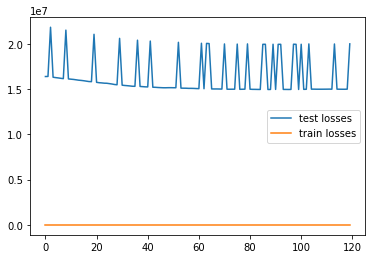

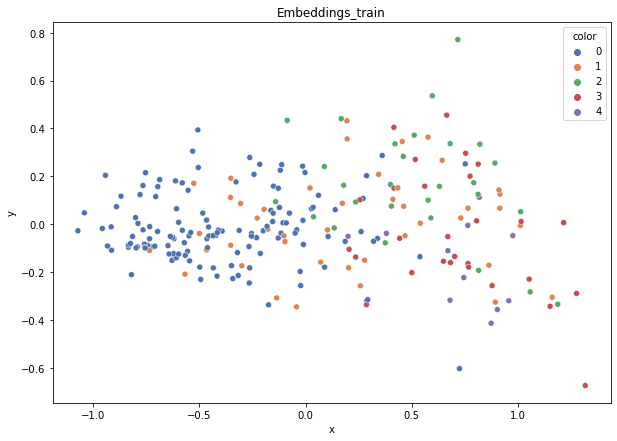

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.42
DT-f1-old+new-features: 0.408
DT-f1-old-features: 0.227
DT-gmean-new-features: 0.146
DT-gmean-old+new-features: 0.143
DT-gmean-old-features: 0.03
KNN-f1-new-features: 0.257
KNN-f1-old+new-features: 0.304
KNN-f1-old-features: 0.275
KNN-gmean-new-features: 0.035
KNN-gmean-old+new-features: 0.04
KNN-gmean-old-features: 0.035
LDA-f1-new-features: 0.281
LDA-f1-old+new-features: 0.294
LDA-f1-old-features: 0.415
LDA-gmean-new-features: 0.079
LDA-gmean-old+new-features: 0.079
LDA-gmean-old-features: 0.363
QDA-f1-new-features: 0.238
QDA-f1-old+new-features: 0.209
QDA-f1-old-features: 0.268
QDA-gmean-new-features: 0.031
QDA-gmean-old+new-features: 0.012
QDA-gmean-old-features: 0.037
RF24-f1-new-features: 0.274
RF24-f1-old+new-features: 0.248
RF24-f1-old-features: 0.497
RF24-gmean-new-features: 0.079
RF24-gmean-old+new-features: 0.069
RF24-gmean-old-features: 0.452
cleveland_v2


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


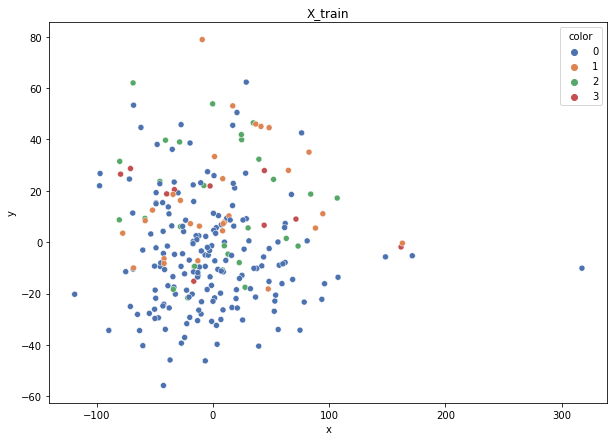

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


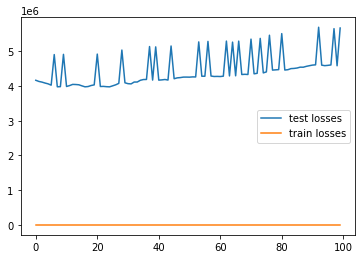

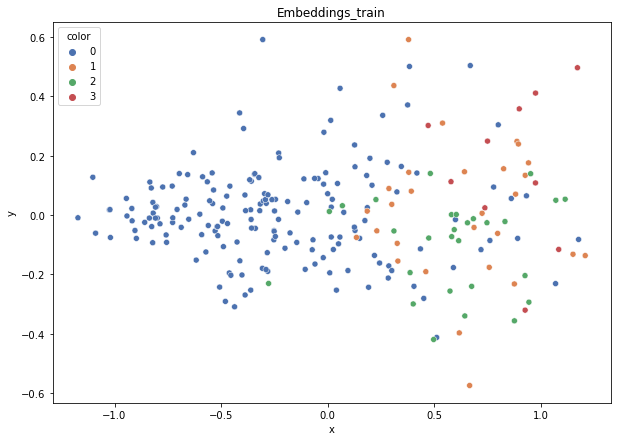

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.32
DT-f1-old+new-features: 0.361
DT-f1-old-features: 0.358
DT-gmean-new-features: 0.077
DT-gmean-old+new-features: 0.092
DT-gmean-old-features: 0.099
KNN-f1-new-features: 0.286
KNN-f1-old+new-features: 0.238
KNN-f1-old-features: 0.238
KNN-gmean-new-features: 0.022
KNN-gmean-old+new-features: 0.018
KNN-gmean-old-features: 0.018
LDA-f1-new-features: 0.459
LDA-f1-old+new-features: 0.385
LDA-f1-old-features: 0.376
LDA-gmean-new-features: 0.392
LDA-gmean-old+new-features: 0.277
LDA-gmean-old-features: 0.028
QDA-f1-new-features: 0.368
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.394
QDA-gmean-new-features: 0.087
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.093
RF24-f1-new-features: 0.376
RF24-f1-old+new-features: 0.337
RF24-f1-old-features: 0.459
RF24-gmean-new-features: 0.095
RF24-gmean-old+new-features: 0.025
RF24-gmean-old-features: 0.121


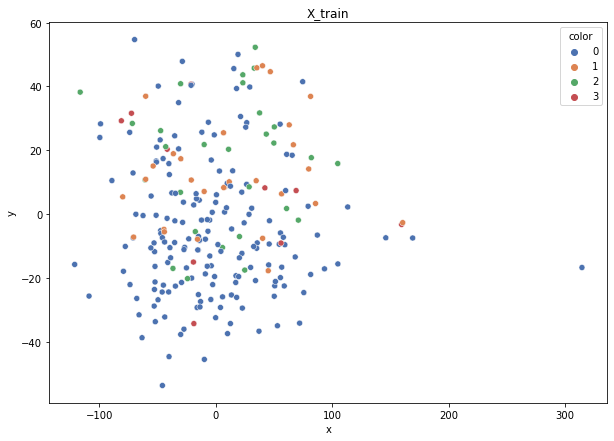

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


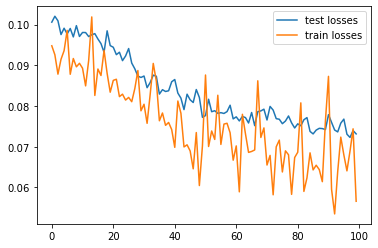

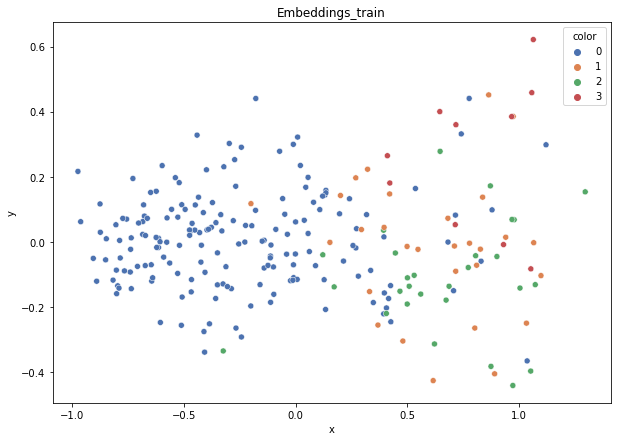

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.389
DT-f1-old+new-features: 0.448
DT-f1-old-features: 0.484
DT-gmean-new-features: 0.381
DT-gmean-old+new-features: 0.453
DT-gmean-old-features: 0.546
KNN-f1-new-features: 0.324
KNN-f1-old+new-features: 0.361
KNN-f1-old-features: 0.39
KNN-gmean-new-features: 0.09
KNN-gmean-old+new-features: 0.099
KNN-gmean-old-features: 0.11
LDA-f1-new-features: 0.442
LDA-f1-old+new-features: 0.457
LDA-f1-old-features: 0.344
LDA-gmean-new-features: 0.392
LDA-gmean-old+new-features: 0.392
LDA-gmean-old-features: 0.085
QDA-f1-new-features: 0.292
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.399
QDA-gmean-new-features: 0.022
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.11
RF24-f1-new-features: 0.304
RF24-f1-old+new-features: 0.355
RF24-f1-old-features: 0.346
RF24-gmean-new-features: 0.075
RF24-gmean-old+new-features: 0.099
RF24-gmean-old-features: 0.085


/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


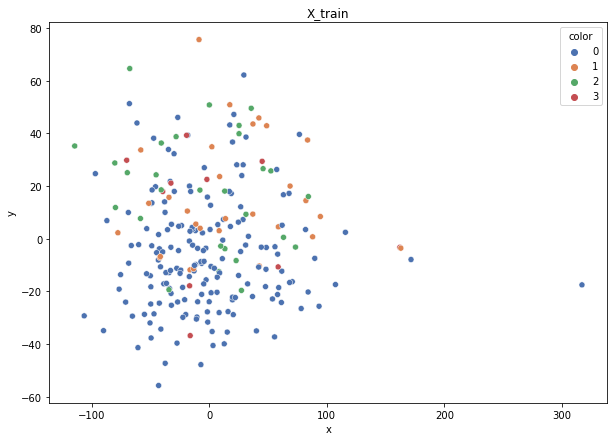

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 10})
Weights: {0: 0.032483898067768135, 1: 0.19602352282273874, 2: 0.20302436292355083, 3: 0.5684682161859423}


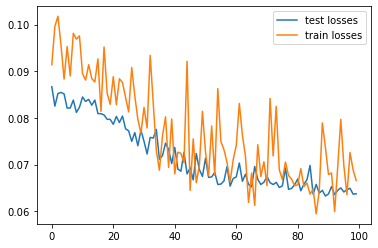

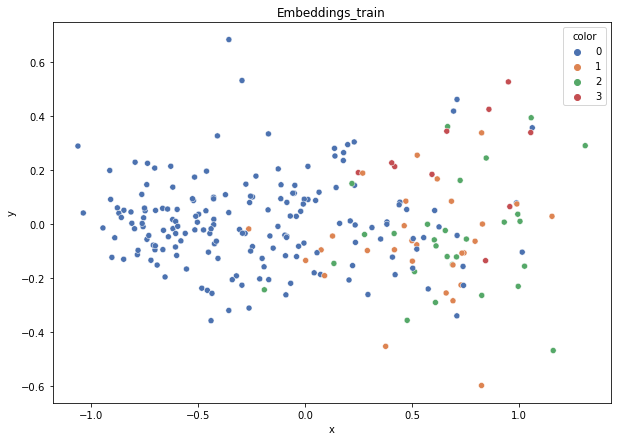

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.345
DT-f1-old+new-features: 0.358
DT-f1-old-features: 0.295
DT-gmean-new-features: 0.026
DT-gmean-old+new-features: 0.027
DT-gmean-old-features: 0.075
KNN-f1-new-features: 0.297
KNN-f1-old+new-features: 0.356
KNN-f1-old-features: 0.356
KNN-gmean-new-features: 0.023
KNN-gmean-old+new-features: 0.079
KNN-gmean-old-features: 0.079
LDA-f1-new-features: 0.42
LDA-f1-old+new-features: 0.353
LDA-f1-old-features: 0.377
LDA-gmean-new-features: 0.095
LDA-gmean-old+new-features: 0.027
LDA-gmean-old-features: 0.098
QDA-f1-new-features: 0.315
QDA-f1-old+new-features: 0.21
QDA-f1-old-features: 0.351
QDA-gmean-new-features: 0.023
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.079
RF24-f1-new-features: 0.441
RF24-f1-old+new-features: 0.303
RF24-f1-old-features: 0.257
RF24-gmean-new-features: 0.109
RF24-gmean-old+new-features: 0.023
RF24-gmean-old-features: 0.019


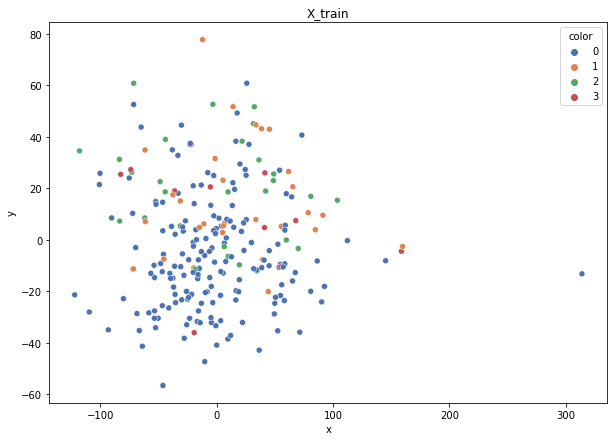

Class cardinalities: Counter({0: 175, 1: 29, 2: 28, 3: 11})
Weights: {1: 0.20670586024536255, 0: 0.03425411398351722, 2: 0.21408821239698264, 3: 0.5449518133741377}


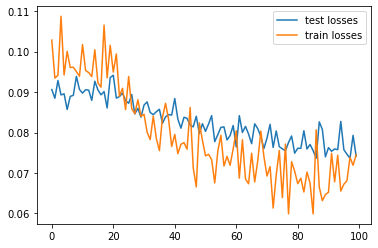

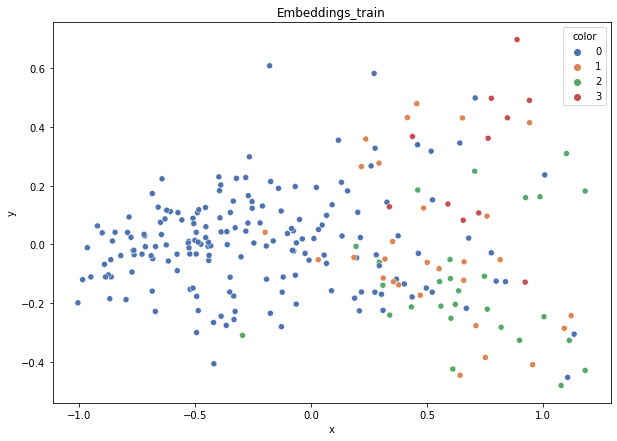

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.294
DT-f1-old+new-features: 0.331
DT-f1-old-features: 0.238
DT-gmean-new-features: 0.065
DT-gmean-old+new-features: 0.078
DT-gmean-old-features: 0.018
KNN-f1-new-features: 0.214
KNN-f1-old+new-features: 0.283
KNN-f1-old-features: 0.283
KNN-gmean-new-features: 0.005
KNN-gmean-old+new-features: 0.022
KNN-gmean-old-features: 0.022
LDA-f1-new-features: 0.337
LDA-f1-old+new-features: 0.399
LDA-f1-old-features: 0.301
LDA-gmean-new-features: 0.078
LDA-gmean-old+new-features: 0.094
LDA-gmean-old-features: 0.023
QDA-f1-new-features: 0.37
QDA-f1-old+new-features: 0.212
QDA-f1-old-features: 0.413
QDA-gmean-new-features: 0.08
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.095
RF24-f1-new-features: 0.3
RF24-f1-old+new-features: 0.371
RF24-f1-old-features: 0.428
RF24-gmean-new-features: 0.066
RF24-gmean-old+new-features: 0.087
RF24-gmean-old-features: 0.104


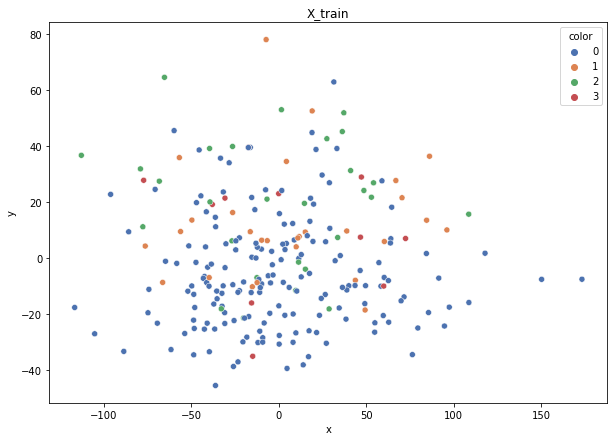

Class cardinalities: Counter({0: 176, 1: 28, 2: 28, 3: 11})
Weights: {0: 0.03381642512077295, 1: 0.21256038647342995, 2: 0.21256038647342995, 3: 0.5410628019323672}


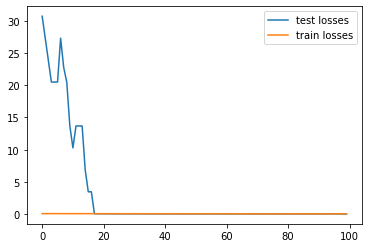

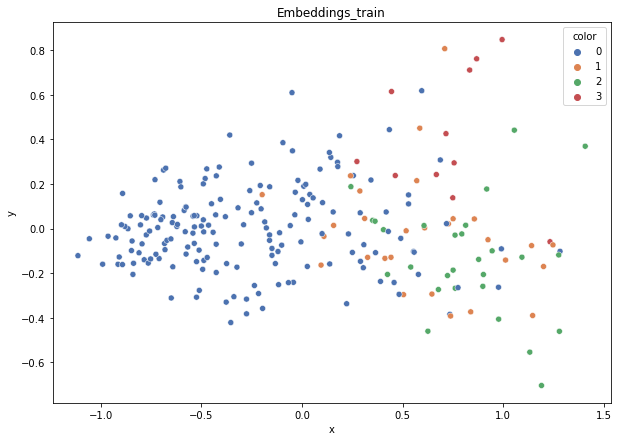

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.408
DT-f1-old+new-features: 0.358
DT-f1-old-features: 0.335
DT-gmean-new-features: 0.113
DT-gmean-old+new-features: 0.101
DT-gmean-old-features: 0.092
KNN-f1-new-features: 0.296
KNN-f1-old+new-features: 0.334
KNN-f1-old-features: 0.37
KNN-gmean-new-features: 0.087
KNN-gmean-old+new-features: 0.087
KNN-gmean-old-features: 0.096
LDA-f1-new-features: 0.332
LDA-f1-old+new-features: 0.339
LDA-f1-old-features: 0.467
LDA-gmean-new-features: 0.1
LDA-gmean-old+new-features: 0.292
LDA-gmean-old-features: 0.463
QDA-f1-new-features: 0.235
QDA-f1-old+new-features: 0.209
QDA-f1-old-features: 0.301
QDA-gmean-new-features: 0.018
QDA-gmean-old+new-features: 0.006
QDA-gmean-old-features: 0.074
RF24-f1-new-features: 0.336
RF24-f1-old+new-features: 0.327
RF24-f1-old-features: 0.29
RF24-gmean-new-features: 0.105
RF24-gmean-old+new-features: 0.105
RF24-gmean-old-features: 0.022
glass


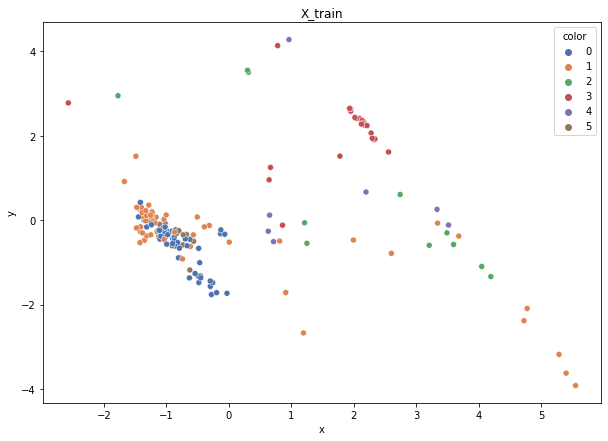

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 13, 2: 11, 4: 7})
Weights: {0: 0.04597401674853029, 1: 0.042205654719962245, 3: 0.1119367364312042, 5: 0.1980419183013613, 2: 0.2340495398106997, 4: 0.36779213398824234}


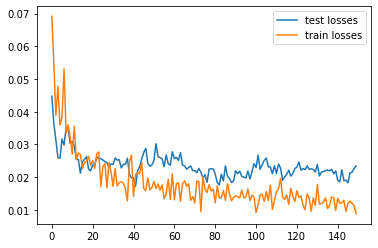

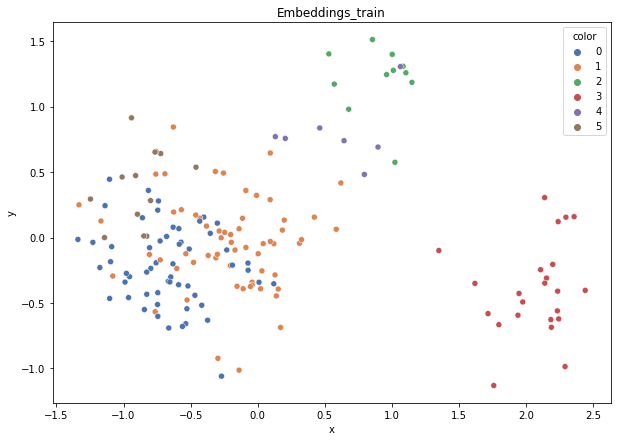

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.653
DT-f1-old+new-features: 0.62
DT-f1-old-features: 0.711
DT-gmean-new-features: 0.557
DT-gmean-old+new-features: 0.529
DT-gmean-old-features: 0.742
KNN-f1-new-features: 0.528
KNN-f1-old+new-features: 0.75
KNN-f1-old-features: 0.747
KNN-gmean-new-features: 0.191
KNN-gmean-old+new-features: 0.713
KNN-gmean-old-features: 0.701
LDA-f1-new-features: 0.707
LDA-f1-old+new-features: 0.634
LDA-f1-old-features: 0.551
LDA-gmean-new-features: 0.676
LDA-gmean-old+new-features: 0.263
LDA-gmean-old-features: 0.088
QDA-f1-new-features: 0.371
QDA-f1-old+new-features: 0.215
QDA-f1-old-features: 0.388
QDA-gmean-new-features: 0.028
QDA-gmean-old+new-features: 0.009
QDA-gmean-old-features: 0.065
RF24-f1-new-features: 0.527
RF24-f1-old+new-features: 0.531
RF24-f1-old-features: 0.786
RF24-gmean-new-features: 0.194
RF24-gmean-old+new-features: 0.194
RF24-gmean-old-features: 0.742


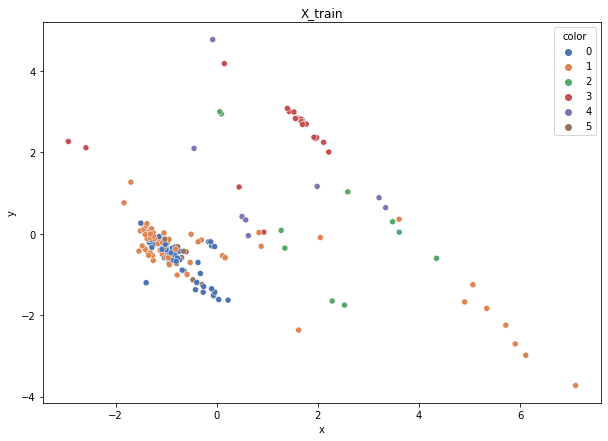

Class cardinalities: Counter({1: 60, 0: 56, 3: 24, 5: 13, 2: 10, 4: 8})
Weights: {5: 0.2034390893678857, 4: 0.33058852022281426, 1: 0.0440784693630419, 0: 0.047226931460402036, 3: 0.11019617340760475, 2: 0.2644708161782514}


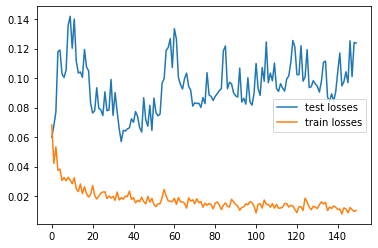

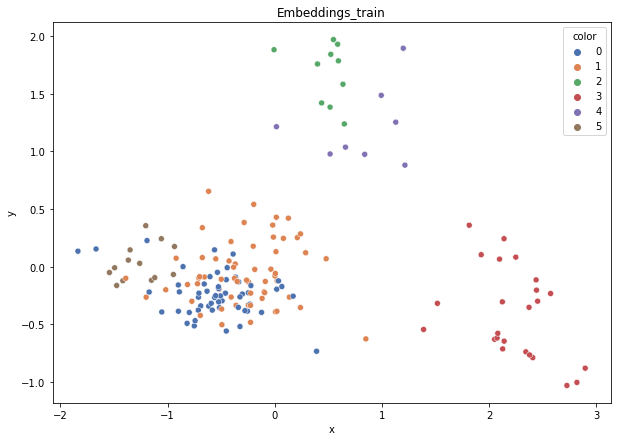

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.646
DT-f1-old+new-features: 0.614
DT-f1-old-features: 0.53
DT-gmean-new-features: 0.658
DT-gmean-old+new-features: 0.615
DT-gmean-old-features: 0.232
KNN-f1-new-features: 0.555
KNN-f1-old+new-features: 0.637
KNN-f1-old-features: 0.568
KNN-gmean-new-features: 0.207
KNN-gmean-old+new-features: 0.6
KNN-gmean-old-features: 0.557
LDA-f1-new-features: 0.688
LDA-f1-old+new-features: 0.734
LDA-f1-old-features: 0.425
LDA-gmean-new-features: 0.69
LDA-gmean-old+new-features: 0.735
LDA-gmean-old-features: 0.072
QDA-f1-new-features: 0.354
QDA-f1-old+new-features: 0.333
QDA-f1-old-features: 0.369
QDA-gmean-new-features: 0.027
QDA-gmean-old+new-features: 0.026
QDA-gmean-old-features: 0.06
RF24-f1-new-features: 0.68
RF24-f1-old+new-features: 0.691
RF24-f1-old-features: 0.652
RF24-gmean-new-features: 0.689
RF24-gmean-old+new-features: 0.673
RF24-gmean-old-features: 0.279


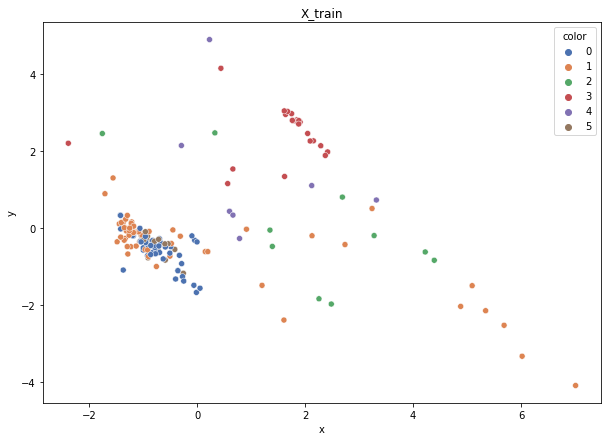

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


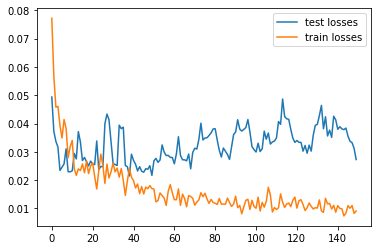

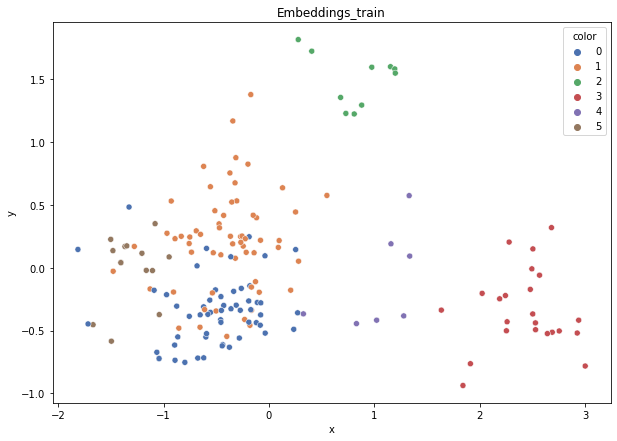

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.636
DT-f1-old+new-features: 0.625
DT-f1-old-features: 0.607
DT-gmean-new-features: 0.58
DT-gmean-old+new-features: 0.567
DT-gmean-old-features: 0.25
KNN-f1-new-features: 0.654
KNN-f1-old+new-features: 0.731
KNN-f1-old-features: 0.661
KNN-gmean-new-features: 0.59
KNN-gmean-old+new-features: 0.642
KNN-gmean-old-features: 0.246
LDA-f1-new-features: 0.756
LDA-f1-old+new-features: 0.743
LDA-f1-old-features: 0.575
LDA-gmean-new-features: 0.71
LDA-gmean-old+new-features: 0.699
LDA-gmean-old-features: 0.233
QDA-f1-new-features: 0.419
QDA-f1-old+new-features: 0.236
QDA-f1-old-features: 0.587
QDA-gmean-new-features: 0.071
QDA-gmean-old+new-features: 0.021
QDA-gmean-old-features: 0.526
RF24-f1-new-features: 0.794
RF24-f1-old+new-features: 0.727
RF24-f1-old-features: 0.731
RF24-gmean-new-features: 0.736
RF24-gmean-old+new-features: 0.656
RF24-gmean-old-features: 0.281


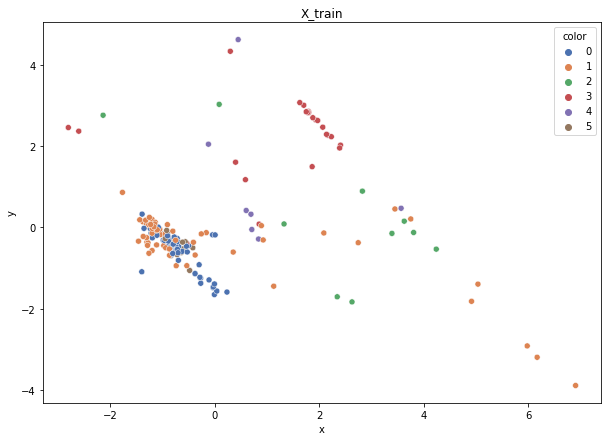

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 10, 4: 7})
Weights: {0: 0.04555224384573926, 5: 0.18220897538295705, 4: 0.3644179507659141, 1: 0.04181845336658031, 3: 0.11090981110266952, 2: 0.2550925655361399}


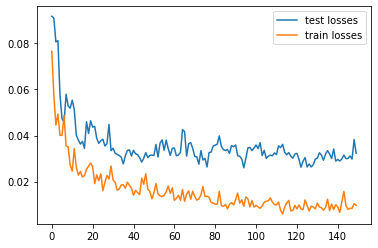

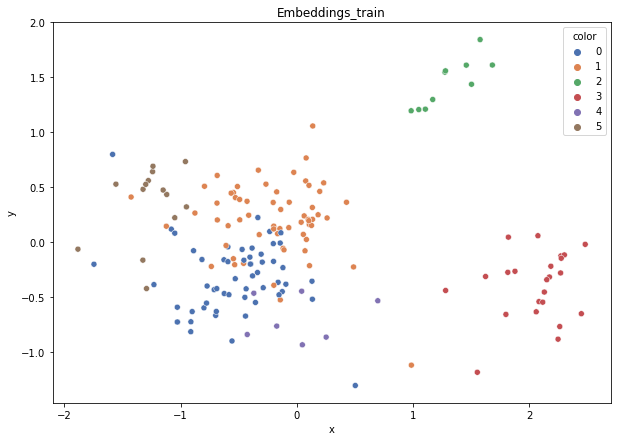

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.655
DT-f1-old+new-features: 0.644
DT-f1-old-features: 0.646
DT-gmean-new-features: 0.621
DT-gmean-old+new-features: 0.609
DT-gmean-old-features: 0.681
KNN-f1-new-features: 0.694
KNN-f1-old+new-features: 0.681
KNN-f1-old-features: 0.641
KNN-gmean-new-features: 0.663
KNN-gmean-old+new-features: 0.621
KNN-gmean-old-features: 0.587
LDA-f1-new-features: 0.665
LDA-f1-old+new-features: 0.699
LDA-f1-old-features: 0.517
LDA-gmean-new-features: 0.612
LDA-gmean-old+new-features: 0.654
LDA-gmean-old-features: 0.196
QDA-f1-new-features: 0.348
QDA-f1-old+new-features: 0.373
QDA-f1-old-features: 0.571
QDA-gmean-new-features: 0.028
QDA-gmean-old+new-features: 0.028
QDA-gmean-old-features: 0.219
RF24-f1-new-features: 0.724
RF24-f1-old+new-features: 0.748
RF24-f1-old-features: 0.776
RF24-gmean-new-features: 0.709
RF24-gmean-old+new-features: 0.735
RF24-gmean-old-features: 0.748


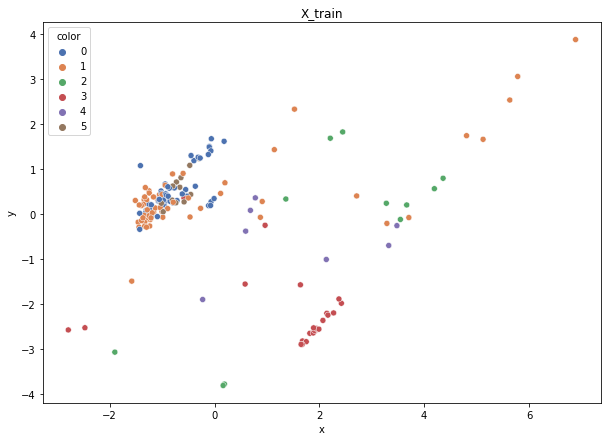

Class cardinalities: Counter({1: 61, 0: 56, 3: 23, 5: 14, 2: 11, 4: 7})
Weights: {0: 0.04663368999308034, 5: 0.18653475997232136, 4: 0.3730695199446427, 1: 0.04281125638709015, 3: 0.11354289737445648, 2: 0.237407876328409}


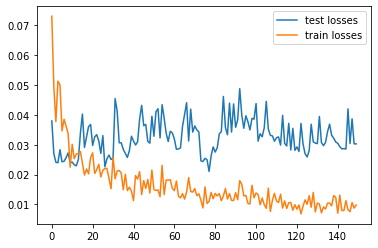

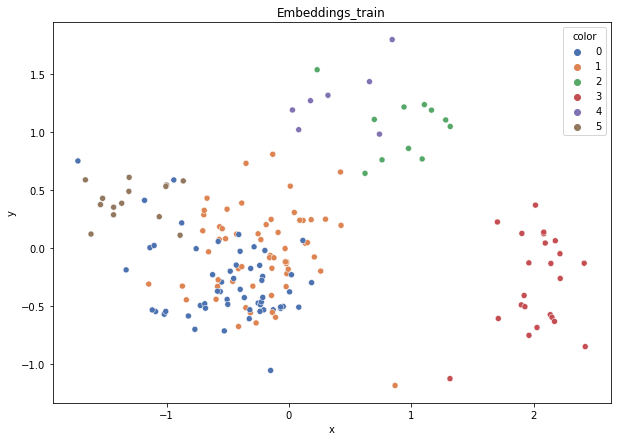

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.839
DT-f1-old+new-features: 0.804
DT-f1-old-features: 0.73
DT-gmean-new-features: 0.802
DT-gmean-old+new-features: 0.771
DT-gmean-old-features: 0.737
KNN-f1-new-features: 0.781
KNN-f1-old+new-features: 0.708
KNN-f1-old-features: 0.678
KNN-gmean-new-features: 0.748
KNN-gmean-old+new-features: 0.709
KNN-gmean-old-features: 0.681
LDA-f1-new-features: 0.816
LDA-f1-old+new-features: 0.755
LDA-f1-old-features: 0.55
LDA-gmean-new-features: 0.778
LDA-gmean-old+new-features: 0.731
LDA-gmean-old-features: 0.222
QDA-f1-new-features: 0.42
QDA-f1-old+new-features: 0.325
QDA-f1-old-features: 0.553
QDA-gmean-new-features: 0.074
QDA-gmean-old+new-features: 0.026
QDA-gmean-old-features: 0.217
RF24-f1-new-features: 0.797
RF24-f1-old+new-features: 0.809
RF24-f1-old-features: 0.857
RF24-gmean-new-features: 0.769
RF24-gmean-old+new-features: 0.781
RF24-gmean-old-features: 0.865
new_ecoli


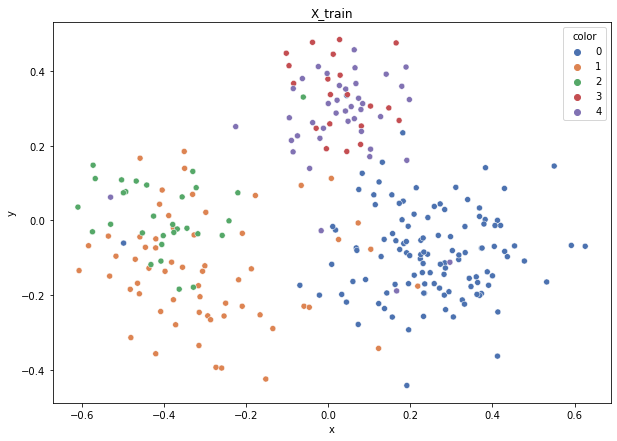

Class cardinalities: Counter({0: 116, 1: 61, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.0649452946471851, 1: 0.1235025275257946, 2: 0.2511218059691157, 3: 0.37668270895367356, 4: 0.183747662904231}


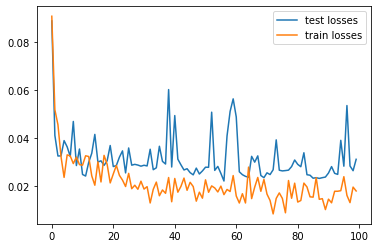

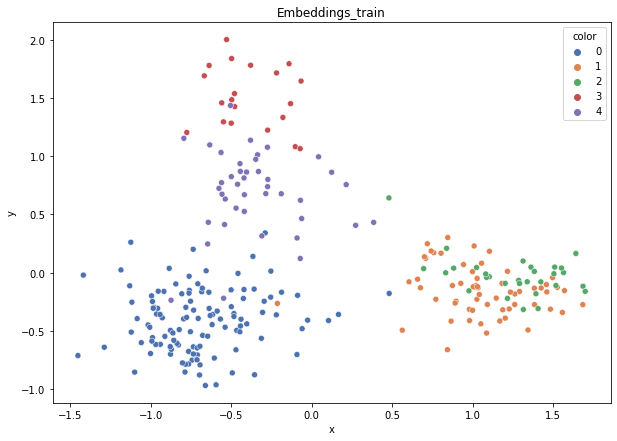

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.75
DT-f1-old+new-features: 0.72
DT-f1-old-features: 0.634
DT-gmean-new-features: 0.73
DT-gmean-old+new-features: 0.663
DT-gmean-old-features: 0.537
KNN-f1-new-features: 0.812
KNN-f1-old+new-features: 0.783
KNN-f1-old-features: 0.749
KNN-gmean-new-features: 0.808
KNN-gmean-old+new-features: 0.771
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.796
LDA-f1-old+new-features: 0.781
LDA-f1-old-features: 0.809
LDA-gmean-new-features: 0.763
LDA-gmean-old+new-features: 0.747
LDA-gmean-old-features: 0.791
QDA-f1-new-features: 0.698
QDA-f1-old+new-features: 0.627
QDA-f1-old-features: 0.287
QDA-gmean-new-features: 0.685
QDA-gmean-old+new-features: 0.584
QDA-gmean-old-features: 0.042
RF24-f1-new-features: 0.811
RF24-f1-old+new-features: 0.796
RF24-f1-old-features: 0.769
RF24-gmean-new-features: 0.778
RF24-gmean-old+new-features: 0.763
RF24-gmean-old-features: 0.771


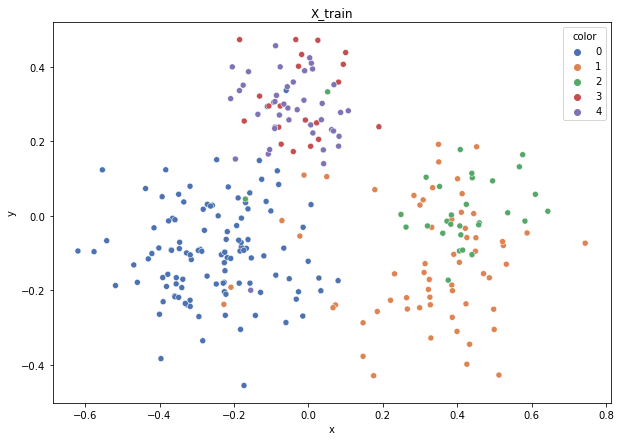

Class cardinalities: Counter({0: 116, 1: 61, 4: 42, 2: 30, 3: 20})
Weights: {0: 0.06523067522150933, 1: 0.12404521845401774, 2: 0.25222527752316937, 3: 0.3783379162847541, 4: 0.18016091251654956}


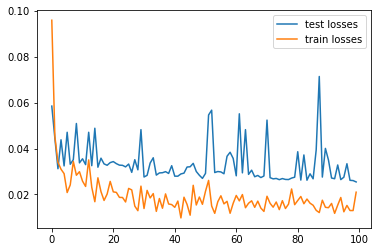

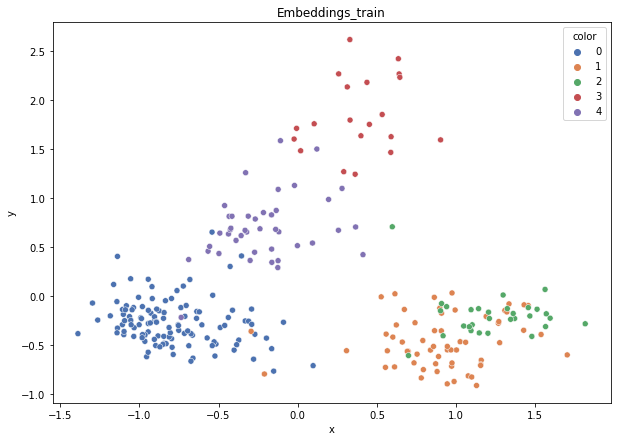

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.736
DT-f1-old+new-features: 0.736
DT-f1-old-features: 0.707
DT-gmean-new-features: 0.714
DT-gmean-old+new-features: 0.736
DT-gmean-old-features: 0.688
KNN-f1-new-features: 0.794
KNN-f1-old+new-features: 0.709
KNN-f1-old-features: 0.728
KNN-gmean-new-features: 0.781
KNN-gmean-old+new-features: 0.667
KNN-gmean-old-features: 0.709
LDA-f1-new-features: 0.853
LDA-f1-old+new-features: 0.859
LDA-f1-old-features: 0.853
LDA-gmean-new-features: 0.84
LDA-gmean-old+new-features: 0.84
LDA-gmean-old-features: 0.84
QDA-f1-new-features: 0.822
QDA-f1-old+new-features: 0.737
QDA-f1-old-features: 0.494
QDA-gmean-new-features: 0.817
QDA-gmean-old+new-features: 0.611
QDA-gmean-old-features: 0.344
RF24-f1-new-features: 0.82
RF24-f1-old+new-features: 0.836
RF24-f1-old-features: 0.841
RF24-gmean-new-features: 0.817
RF24-gmean-old+new-features: 0.829
RF24-gmean-old-features: 0.829


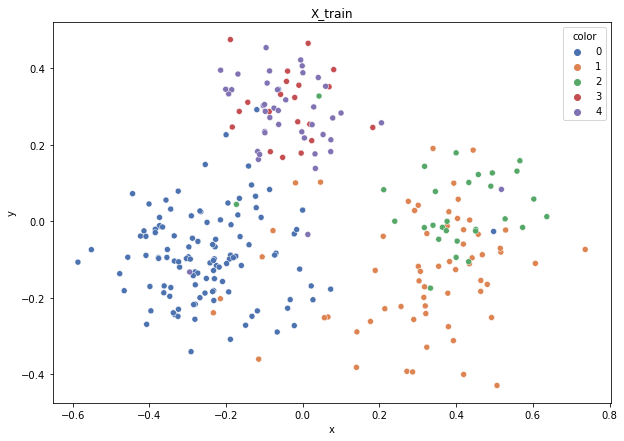

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


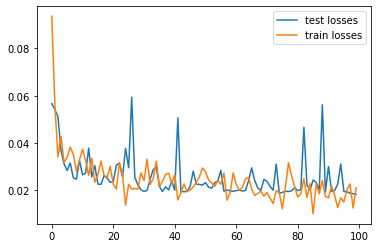

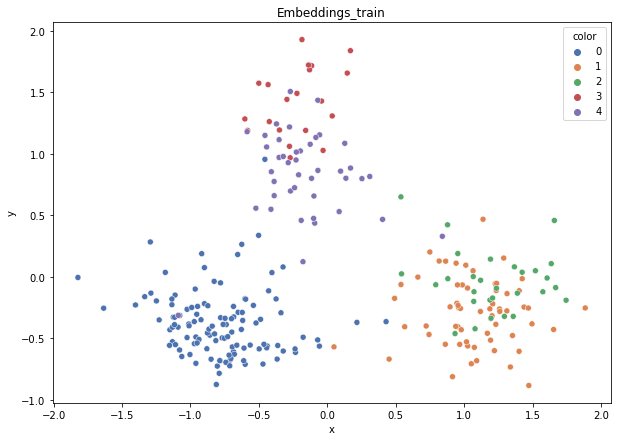

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.763
DT-f1-old+new-features: 0.812
DT-f1-old-features: 0.722
DT-gmean-new-features: 0.73
DT-gmean-old+new-features: 0.806
DT-gmean-old-features: 0.69
KNN-f1-new-features: 0.872
KNN-f1-old+new-features: 0.862
KNN-f1-old-features: 0.862
KNN-gmean-new-features: 0.83
KNN-gmean-old+new-features: 0.815
KNN-gmean-old-features: 0.815
LDA-f1-new-features: 0.909
LDA-f1-old+new-features: 0.924
LDA-f1-old-features: 0.872
LDA-gmean-new-features: 0.899
LDA-gmean-old+new-features: 0.92
LDA-gmean-old-features: 0.852
QDA-f1-new-features: 0.885
QDA-f1-old+new-features: 0.701
QDA-f1-old-features: 0.176
QDA-gmean-new-features: 0.878
QDA-gmean-old+new-features: 0.615
QDA-gmean-old-features: 0.011
RF24-f1-new-features: 0.901
RF24-f1-old+new-features: 0.941
RF24-f1-old-features: 0.879
RF24-gmean-new-features: 0.877
RF24-gmean-old+new-features: 0.918
RF24-gmean-old-features: 0.846


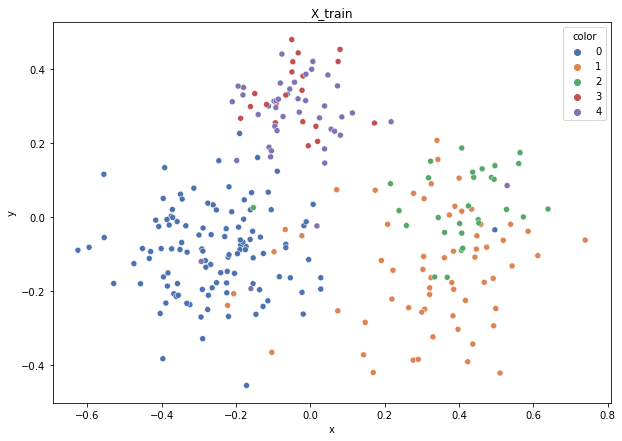

Class cardinalities: Counter({0: 116, 1: 62, 4: 42, 2: 29, 3: 20})
Weights: {0: 0.06479675120436358, 1: 0.12123263128558347, 2: 0.2591870048174543, 3: 0.37582115698530877, 4: 0.17896245570728986}


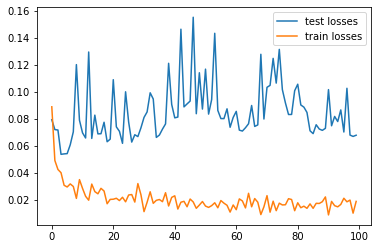

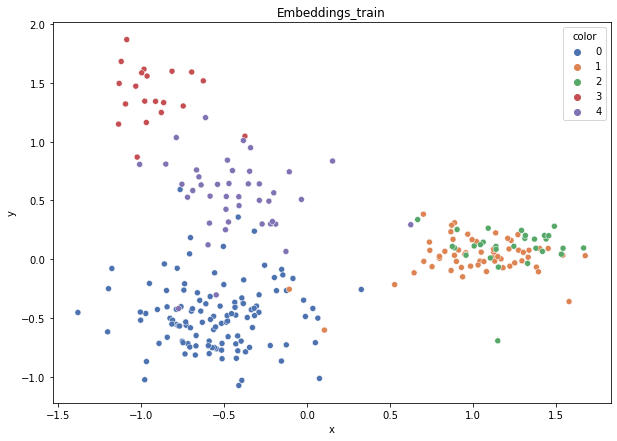

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.689
DT-f1-old+new-features: 0.701
DT-f1-old-features: 0.649
DT-gmean-new-features: 0.622
DT-gmean-old+new-features: 0.634
DT-gmean-old-features: 0.606
KNN-f1-new-features: 0.755
KNN-f1-old+new-features: 0.805
KNN-f1-old-features: 0.817
KNN-gmean-new-features: 0.726
KNN-gmean-old+new-features: 0.777
KNN-gmean-old-features: 0.782
LDA-f1-new-features: 0.79
LDA-f1-old+new-features: 0.762
LDA-f1-old-features: 0.74
LDA-gmean-new-features: 0.739
LDA-gmean-old+new-features: 0.723
LDA-gmean-old-features: 0.718
QDA-f1-new-features: 0.777
QDA-f1-old+new-features: 0.427
QDA-f1-old-features: 0.328
QDA-gmean-new-features: 0.746
QDA-gmean-old+new-features: 0.138
QDA-gmean-old-features: 0.235
RF24-f1-new-features: 0.762
RF24-f1-old+new-features: 0.79
RF24-f1-old-features: 0.753
RF24-gmean-new-features: 0.723
RF24-gmean-old+new-features: 0.739
RF24-gmean-old-features: 0.719


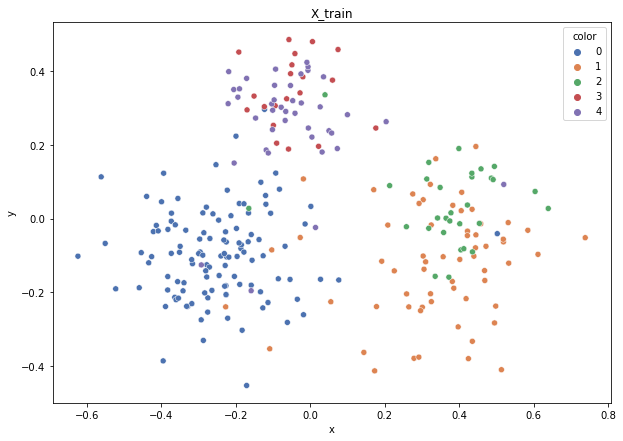

Class cardinalities: Counter({0: 116, 1: 62, 4: 41, 2: 30, 3: 20})
Weights: {0: 0.06507492234699798, 1: 0.12175308052018977, 2: 0.25162303307505884, 3: 0.3774345496125883, 4: 0.18411441444516502}


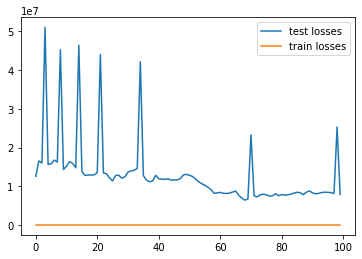

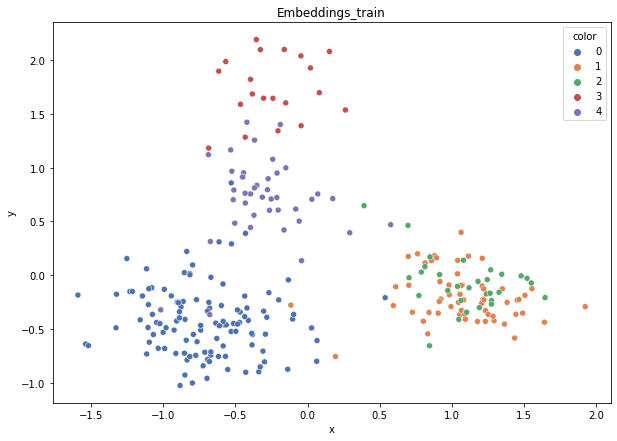

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.764
DT-f1-old+new-features: 0.762
DT-f1-old-features: 0.793
DT-gmean-new-features: 0.808
DT-gmean-old+new-features: 0.808
DT-gmean-old-features: 0.822
KNN-f1-new-features: 0.755
KNN-f1-old+new-features: 0.751
KNN-f1-old-features: 0.808
KNN-gmean-new-features: 0.737
KNN-gmean-old+new-features: 0.741
KNN-gmean-old-features: 0.84
LDA-f1-new-features: 0.837
LDA-f1-old+new-features: 0.813
LDA-f1-old-features: 0.86
LDA-gmean-new-features: 0.843
LDA-gmean-old+new-features: 0.827
LDA-gmean-old-features: 0.873
QDA-f1-new-features: 0.887
QDA-f1-old+new-features: 0.525
QDA-f1-old-features: 0.333
QDA-gmean-new-features: 0.869
QDA-gmean-old+new-features: 0.385
QDA-gmean-old-features: 0.299
RF24-f1-new-features: 0.837
RF24-f1-old+new-features: 0.837
RF24-f1-old-features: 0.887
RF24-gmean-new-features: 0.843
RF24-gmean-old+new-features: 0.843
RF24-gmean-old-features: 0.876
new_led7digit


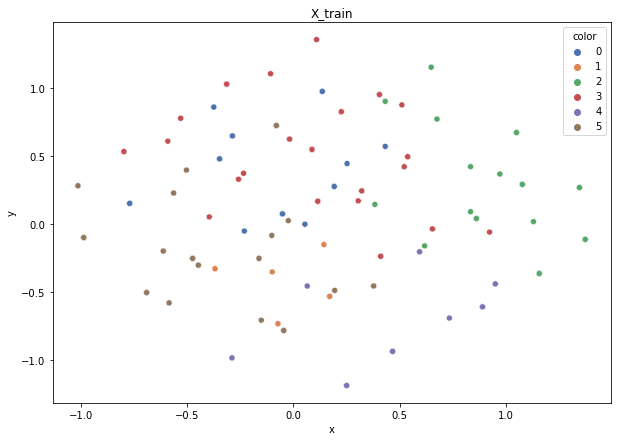

Class cardinalities: Counter({3: 87, 5: 79, 0: 78, 2: 75, 4: 41, 1: 40})
Weights: {0: 0.12859532399632337, 2: 0.1337391369561763, 3: 0.11529235944497956, 4: 0.24464476272471275, 5: 0.1269675350849775, 1: 0.25076088179283057}


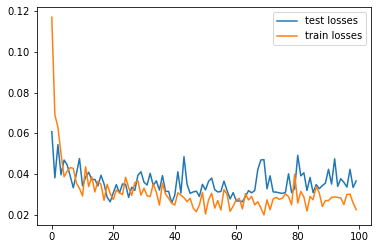

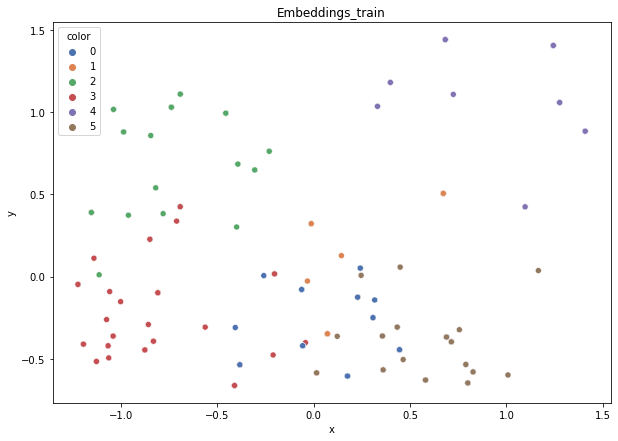

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")
/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.759
DT-f1-old+new-features: 0.755
DT-f1-old-features: 0.789
DT-gmean-new-features: 0.753
DT-gmean-old+new-features: 0.753
DT-gmean-old-features: 0.797
KNN-f1-new-features: 0.729
KNN-f1-old+new-features: 0.73
KNN-f1-old-features: 0.741
KNN-gmean-new-features: 0.699
KNN-gmean-old+new-features: 0.71
KNN-gmean-old-features: 0.719
LDA-f1-new-features: 0.765
LDA-f1-old+new-features: 0.817
LDA-f1-old-features: 0.804
LDA-gmean-new-features: 0.76
LDA-gmean-old+new-features: 0.821
LDA-gmean-old-features: 0.806
QDA-f1-new-features: 0.771
QDA-f1-old+new-features: 0.653
QDA-f1-old-features: 0.709
QDA-gmean-new-features: 0.767
QDA-gmean-old+new-features: 0.618
QDA-gmean-old-features: 0.689
RF24-f1-new-features: 0.752
RF24-f1-old+new-features: 0.776
RF24-f1-old-features: 0.796
RF24-gmean-new-features: 0.733
RF24-gmean-old+new-features: 0.777
RF24-gmean-old-features: 0.797


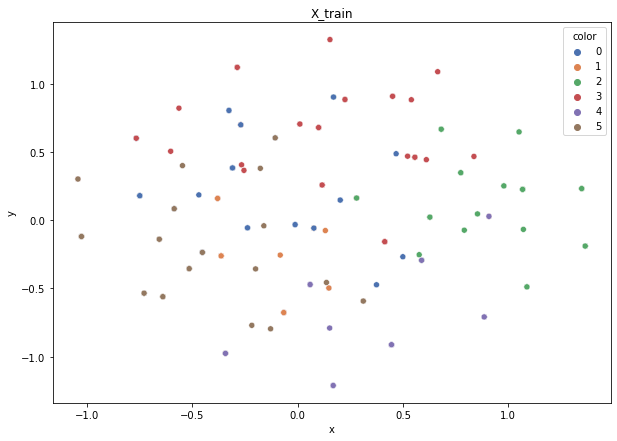

Class cardinalities: Counter({3: 87, 5: 80, 0: 78, 2: 75, 4: 41, 1: 39})
Weights: {0: 0.1279755802357915, 2: 0.13309460344522317, 3: 0.114736727107951, 4: 0.2434657380095546, 5: 0.12477619072989674, 1: 0.255951160471583}


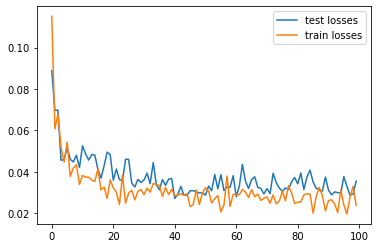

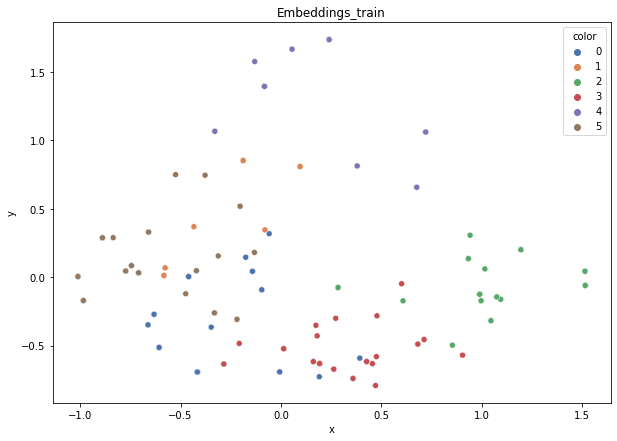

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.743
DT-f1-old+new-features: 0.735
DT-f1-old-features: 0.779
DT-gmean-new-features: 0.713
DT-gmean-old+new-features: 0.705
DT-gmean-old-features: 0.755
KNN-f1-new-features: 0.742
KNN-f1-old+new-features: 0.649
KNN-f1-old-features: 0.692
KNN-gmean-new-features: 0.712
KNN-gmean-old+new-features: 0.268
KNN-gmean-old-features: 0.283
LDA-f1-new-features: 0.748
LDA-f1-old+new-features: 0.718
LDA-f1-old-features: 0.756
LDA-gmean-new-features: 0.708
LDA-gmean-old+new-features: 0.679
LDA-gmean-old-features: 0.729
QDA-f1-new-features: 0.726
QDA-f1-old+new-features: 0.578
QDA-f1-old-features: 0.745
QDA-gmean-new-features: 0.698
QDA-gmean-old+new-features: 0.534
QDA-gmean-old-features: 0.695
RF24-f1-new-features: 0.763
RF24-f1-old+new-features: 0.735
RF24-f1-old-features: 0.767
RF24-gmean-new-features: 0.735
RF24-gmean-old+new-features: 0.694
RF24-gmean-old-features: 0.735


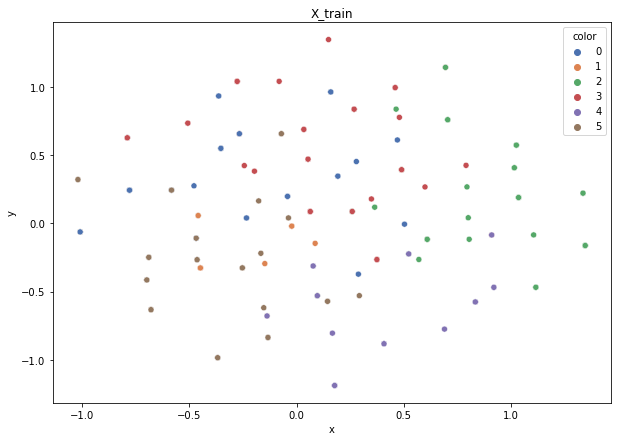

Class cardinalities: Counter({3: 86, 5: 79, 0: 78, 2: 76, 4: 42, 1: 39})
Weights: {0: 0.12857143873483481, 2: 0.1319548976489094, 3: 0.11661130489903622, 4: 0.23877552907897892, 5: 0.12694395216857107, 1: 0.25714287746966963}


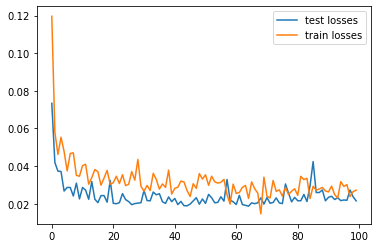

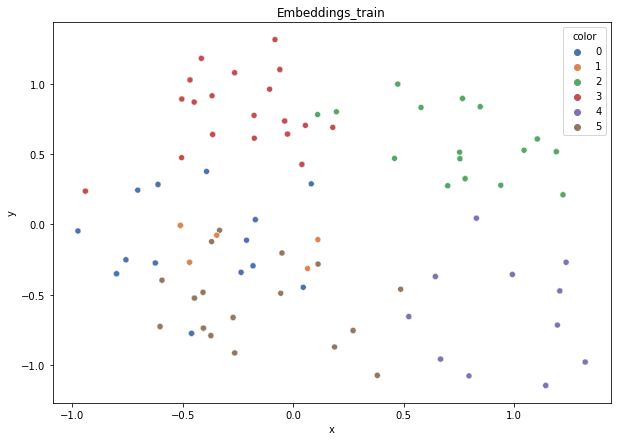

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.783
DT-f1-old+new-features: 0.783
DT-f1-old-features: 0.782
DT-gmean-new-features: 0.785
DT-gmean-old+new-features: 0.785
DT-gmean-old-features: 0.783
KNN-f1-new-features: 0.573
KNN-f1-old+new-features: 0.731
KNN-f1-old-features: 0.739
KNN-gmean-new-features: 0.409
KNN-gmean-old+new-features: 0.731
KNN-gmean-old-features: 0.739
LDA-f1-new-features: 0.786
LDA-f1-old+new-features: 0.778
LDA-f1-old-features: 0.824
LDA-gmean-new-features: 0.776
LDA-gmean-old+new-features: 0.769
LDA-gmean-old-features: 0.824
QDA-f1-new-features: 0.805
QDA-f1-old+new-features: 0.561
QDA-f1-old-features: 0.769
QDA-gmean-new-features: 0.807
QDA-gmean-old+new-features: 0.449
QDA-gmean-old-features: 0.761
RF24-f1-new-features: 0.793
RF24-f1-old+new-features: 0.793
RF24-f1-old-features: 0.793
RF24-gmean-new-features: 0.793
RF24-gmean-old+new-features: 0.793
RF24-gmean-old-features: 0.793


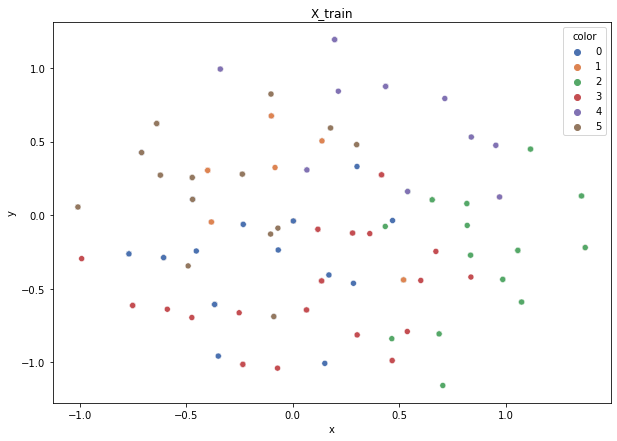

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


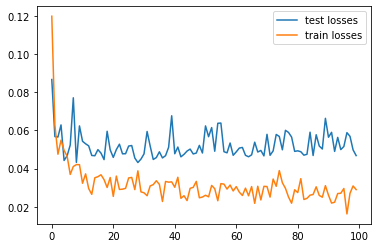

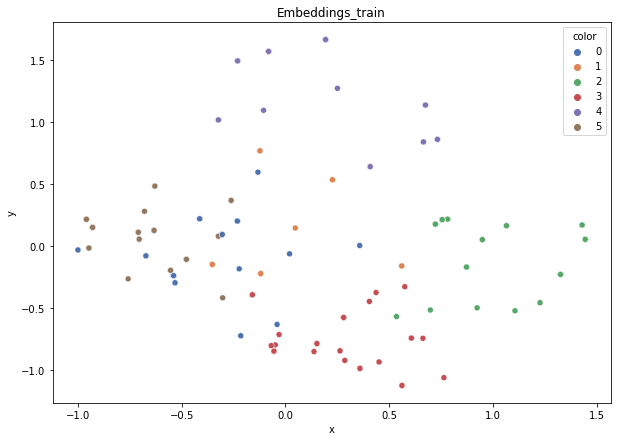

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.735
DT-f1-old+new-features: 0.727
DT-f1-old-features: 0.716
DT-gmean-new-features: 0.717
DT-gmean-old+new-features: 0.711
DT-gmean-old-features: 0.698
KNN-f1-new-features: 0.707
KNN-f1-old+new-features: 0.712
KNN-f1-old-features: 0.714
KNN-gmean-new-features: 0.693
KNN-gmean-old+new-features: 0.7
KNN-gmean-old-features: 0.704
LDA-f1-new-features: 0.747
LDA-f1-old+new-features: 0.744
LDA-f1-old-features: 0.784
LDA-gmean-new-features: 0.737
LDA-gmean-old+new-features: 0.745
LDA-gmean-old-features: 0.777
QDA-f1-new-features: 0.73
QDA-f1-old+new-features: 0.669
QDA-f1-old-features: 0.722
QDA-gmean-new-features: 0.716
QDA-gmean-old+new-features: 0.649
QDA-gmean-old-features: 0.704
RF24-f1-new-features: 0.775
RF24-f1-old+new-features: 0.761
RF24-f1-old-features: 0.763
RF24-gmean-new-features: 0.76
RF24-gmean-old+new-features: 0.746
RF24-gmean-old-features: 0.751


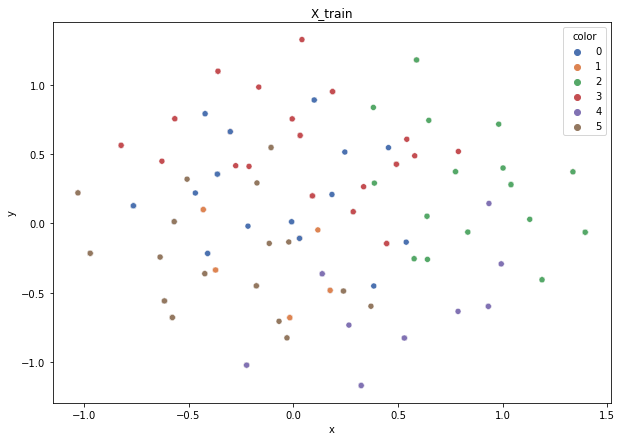

Class cardinalities: Counter({3: 86, 0: 79, 5: 79, 2: 75, 4: 42, 1: 39})
Weights: {0: 0.12692720893782067, 2: 0.13369666008117112, 3: 0.11659592448939342, 4: 0.23874403585923412, 5: 0.12692720893782067, 1: 0.2571089616945598}


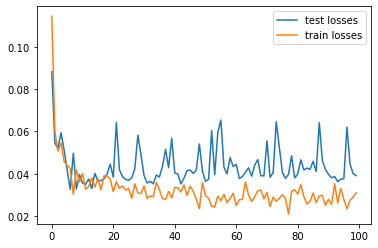

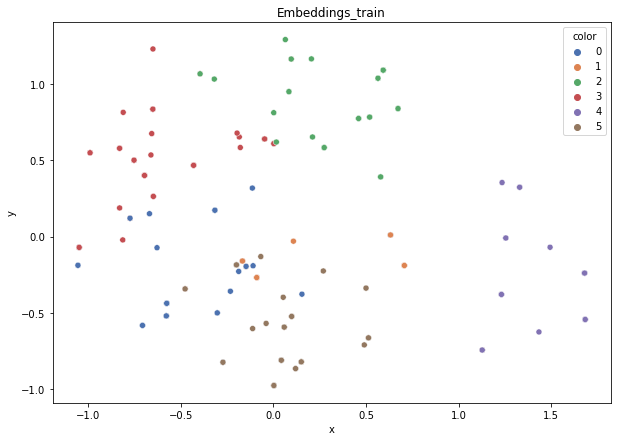

/home/dhorna/anaconda3/envs/mgr/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:715: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


DT-f1-new-features: 0.77
DT-f1-old+new-features: 0.778
DT-f1-old-features: 0.802
DT-gmean-new-features: 0.773
DT-gmean-old+new-features: 0.781
DT-gmean-old-features: 0.806
KNN-f1-new-features: 0.725
KNN-f1-old+new-features: 0.785
KNN-f1-old-features: 0.785
KNN-gmean-new-features: 0.727
KNN-gmean-old+new-features: 0.796
KNN-gmean-old-features: 0.796
LDA-f1-new-features: 0.799
LDA-f1-old+new-features: 0.77
LDA-f1-old-features: 0.822
LDA-gmean-new-features: 0.805
LDA-gmean-old+new-features: 0.772
LDA-gmean-old-features: 0.822
QDA-f1-new-features: 0.778
QDA-f1-old+new-features: 0.651
QDA-f1-old-features: 0.8
QDA-gmean-new-features: 0.781
QDA-gmean-old+new-features: 0.634
QDA-gmean-old-features: 0.797
RF24-f1-new-features: 0.778
RF24-f1-old+new-features: 0.778
RF24-f1-old-features: 0.802
RF24-gmean-new-features: 0.781
RF24-gmean-old+new-features: 0.781
RF24-gmean-old-features: 0.806
new_winequality-red


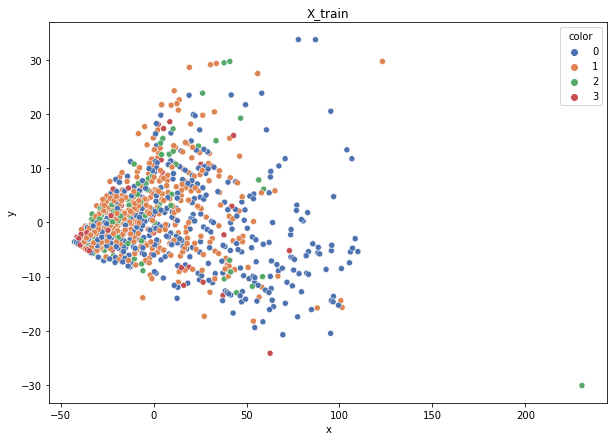

Class cardinalities: Counter({0: 544, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07217510080141348, 1: 0.07683611513888246, 2: 0.246938709660182, 3: 0.6040500743995221}


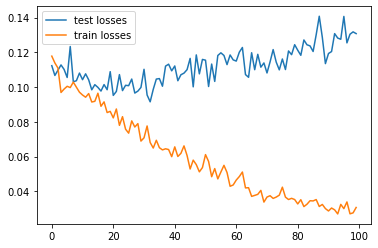

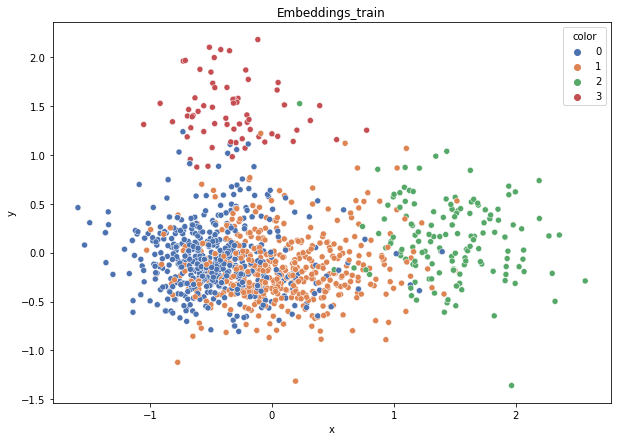

DT-f1-new-features: 0.549
DT-f1-old+new-features: 0.514
DT-f1-old-features: 0.503
DT-gmean-new-features: 0.484
DT-gmean-old+new-features: 0.464
DT-gmean-old-features: 0.368
KNN-f1-new-features: 0.544
KNN-f1-old+new-features: 0.583
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.481
KNN-gmean-old+new-features: 0.507
KNN-gmean-old-features: 0.487
LDA-f1-new-features: 0.52
LDA-f1-old+new-features: 0.543
LDA-f1-old-features: 0.458
LDA-gmean-new-features: 0.468
LDA-gmean-old+new-features: 0.51
LDA-gmean-old-features: 0.328
QDA-f1-new-features: 0.497
QDA-f1-old+new-features: 0.527
QDA-f1-old-features: 0.403
QDA-gmean-new-features: 0.419
QDA-gmean-old+new-features: 0.439
QDA-gmean-old-features: 0.111
RF24-f1-new-features: 0.558
RF24-f1-old+new-features: 0.565
RF24-f1-old-features: 0.581
RF24-gmean-new-features: 0.493
RF24-gmean-old+new-features: 0.499
RF24-gmean-old-features: 0.402


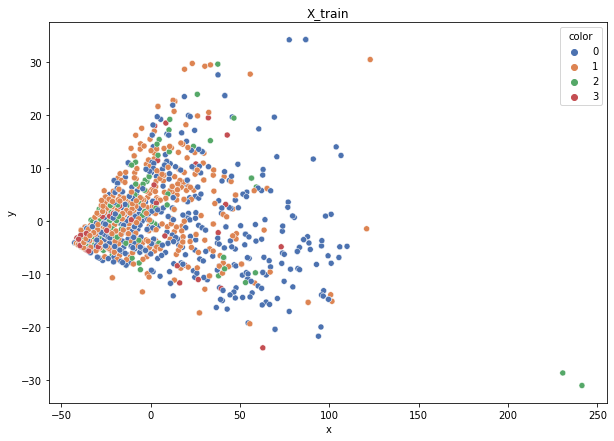

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


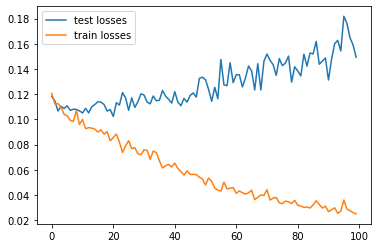

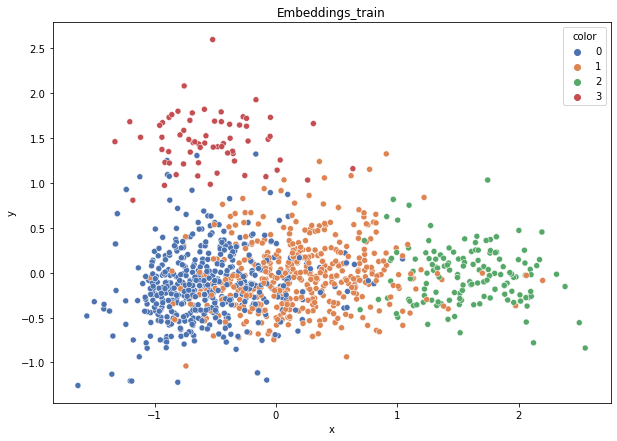

DT-f1-new-features: 0.514
DT-f1-old+new-features: 0.516
DT-f1-old-features: 0.505
DT-gmean-new-features: 0.452
DT-gmean-old+new-features: 0.453
DT-gmean-old-features: 0.48
KNN-f1-new-features: 0.545
KNN-f1-old+new-features: 0.612
KNN-f1-old-features: 0.555
KNN-gmean-new-features: 0.47
KNN-gmean-old+new-features: 0.565
KNN-gmean-old-features: 0.512
LDA-f1-new-features: 0.497
LDA-f1-old+new-features: 0.495
LDA-f1-old-features: 0.453
LDA-gmean-new-features: 0.468
LDA-gmean-old+new-features: 0.443
LDA-gmean-old-features: 0.348
QDA-f1-new-features: 0.503
QDA-f1-old+new-features: 0.511
QDA-f1-old-features: 0.478
QDA-gmean-new-features: 0.463
QDA-gmean-old+new-features: 0.474
QDA-gmean-old-features: 0.421
RF24-f1-new-features: 0.524
RF24-f1-old+new-features: 0.53
RF24-f1-old-features: 0.558
RF24-gmean-new-features: 0.461
RF24-gmean-old+new-features: 0.465
RF24-gmean-old-features: 0.439


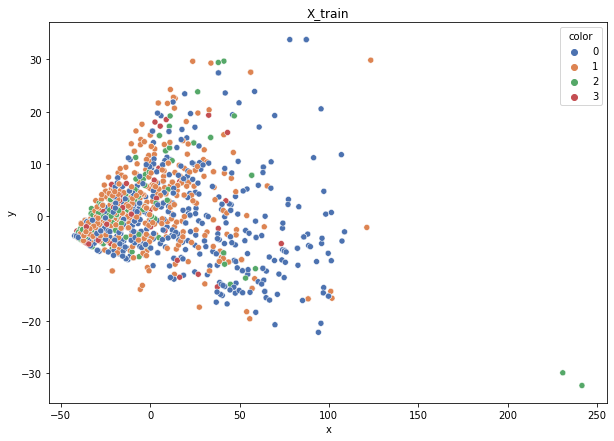

Class cardinalities: Counter({0: 545, 1: 510, 2: 159, 3: 65})
Weights: {0: 0.072041356277607, 1: 0.07698537092410943, 2: 0.24693420862450194, 3: 0.6040390641737817}


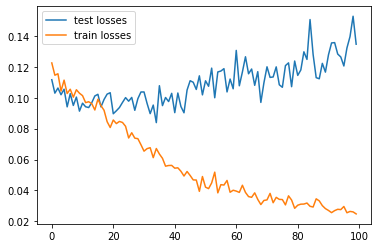

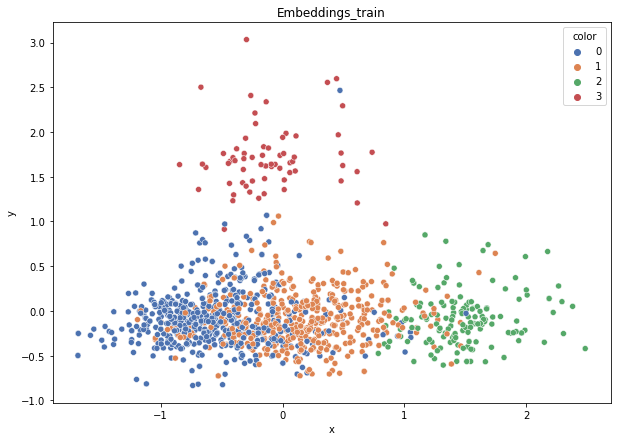

DT-f1-new-features: 0.533
DT-f1-old+new-features: 0.571
DT-f1-old-features: 0.514
DT-gmean-new-features: 0.503
DT-gmean-old+new-features: 0.551
DT-gmean-old-features: 0.468
KNN-f1-new-features: 0.54
KNN-f1-old+new-features: 0.553
KNN-f1-old-features: 0.544
KNN-gmean-new-features: 0.507
KNN-gmean-old+new-features: 0.493
KNN-gmean-old-features: 0.516
LDA-f1-new-features: 0.52
LDA-f1-old+new-features: 0.547
LDA-f1-old-features: 0.445
LDA-gmean-new-features: 0.495
LDA-gmean-old+new-features: 0.533
LDA-gmean-old-features: 0.321
QDA-f1-new-features: 0.51
QDA-f1-old+new-features: 0.507
QDA-f1-old-features: 0.42
QDA-gmean-new-features: 0.489
QDA-gmean-old+new-features: 0.485
QDA-gmean-old-features: 0.306
RF24-f1-new-features: 0.549
RF24-f1-old+new-features: 0.554
RF24-f1-old-features: 0.515
RF24-gmean-new-features: 0.517
RF24-gmean-old+new-features: 0.518
RF24-gmean-old-features: 0.138


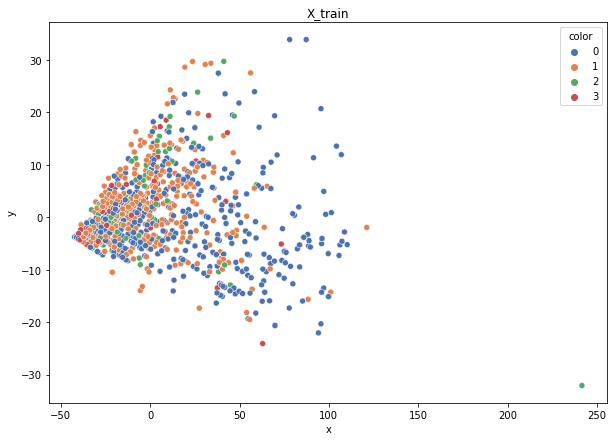

Class cardinalities: Counter({0: 545, 1: 510, 2: 160, 3: 64})
Weights: {0: 0.07147706120661339, 2: 0.24346873973502686, 3: 0.6086718493375671, 1: 0.07638234972079273}


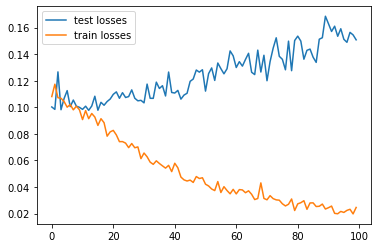

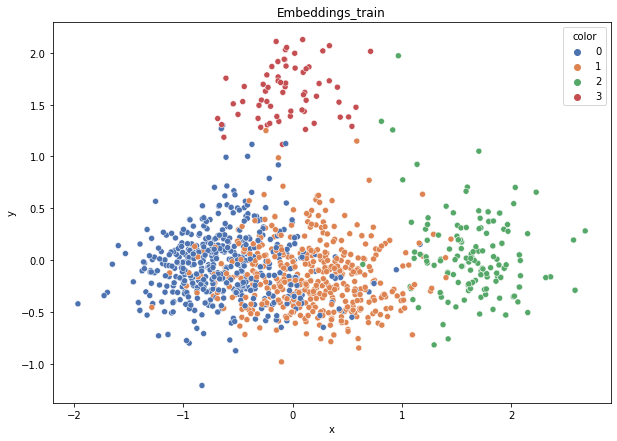

DT-f1-new-features: 0.499
DT-f1-old+new-features: 0.493
DT-f1-old-features: 0.427
DT-gmean-new-features: 0.403
DT-gmean-old+new-features: 0.401
DT-gmean-old-features: 0.378
KNN-f1-new-features: 0.494
KNN-f1-old+new-features: 0.501
KNN-f1-old-features: 0.486
KNN-gmean-new-features: 0.393
KNN-gmean-old+new-features: 0.426
KNN-gmean-old-features: 0.421
LDA-f1-new-features: 0.471
LDA-f1-old+new-features: 0.475
LDA-f1-old-features: 0.411
LDA-gmean-new-features: 0.384
LDA-gmean-old+new-features: 0.387
LDA-gmean-old-features: 0.11
QDA-f1-new-features: 0.461
QDA-f1-old+new-features: 0.5
QDA-f1-old-features: 0.418
QDA-gmean-new-features: 0.371
QDA-gmean-old+new-features: 0.404
QDA-gmean-old-features: 0.361
RF24-f1-new-features: 0.513
RF24-f1-old+new-features: 0.505
RF24-f1-old-features: 0.513
RF24-gmean-new-features: 0.405
RF24-gmean-old+new-features: 0.401
RF24-gmean-old-features: 0.401


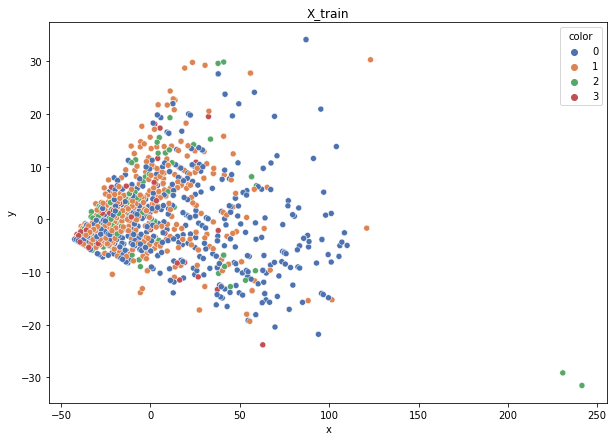

Class cardinalities: Counter({0: 545, 1: 511, 2: 159, 3: 65})
Weights: {0: 0.07205221139741194, 1: 0.07684629199919668, 2: 0.24697141642509127, 3: 0.6041300801783002}


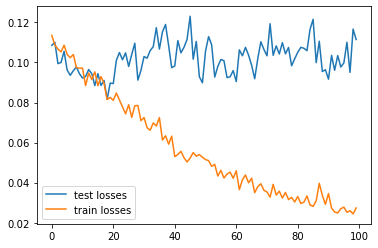

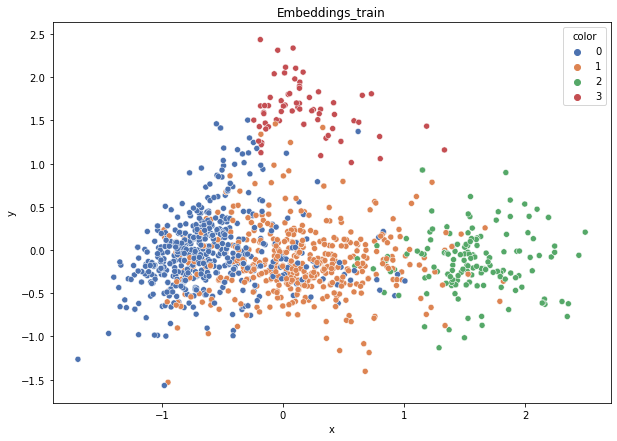

DT-f1-new-features: 0.56
DT-f1-old+new-features: 0.571
DT-f1-old-features: 0.463
DT-gmean-new-features: 0.487
DT-gmean-old+new-features: 0.521
DT-gmean-old-features: 0.399
KNN-f1-new-features: 0.549
KNN-f1-old+new-features: 0.545
KNN-f1-old-features: 0.537
KNN-gmean-new-features: 0.441
KNN-gmean-old+new-features: 0.444
KNN-gmean-old-features: 0.437
LDA-f1-new-features: 0.577
LDA-f1-old+new-features: 0.564
LDA-f1-old-features: 0.512
LDA-gmean-new-features: 0.543
LDA-gmean-old+new-features: 0.53
LDA-gmean-old-features: 0.431
QDA-f1-new-features: 0.514
QDA-f1-old+new-features: 0.545
QDA-f1-old-features: 0.512
QDA-gmean-new-features: 0.427
QDA-gmean-old+new-features: 0.484
QDA-gmean-old-features: 0.449
RF24-f1-new-features: 0.592
RF24-f1-old+new-features: 0.597
RF24-f1-old-features: 0.608
RF24-gmean-new-features: 0.534
RF24-gmean-old+new-features: 0.54
RF24-gmean-old-features: 0.472
thyroid-newthyroid


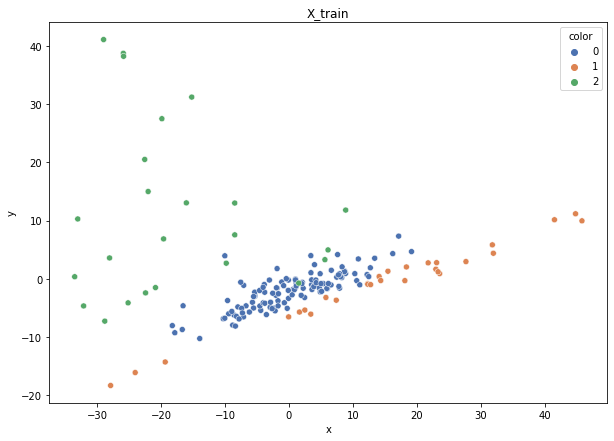

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


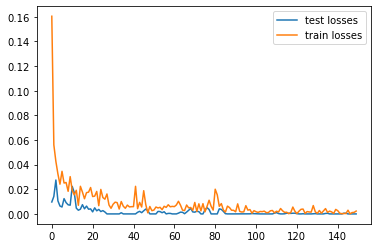

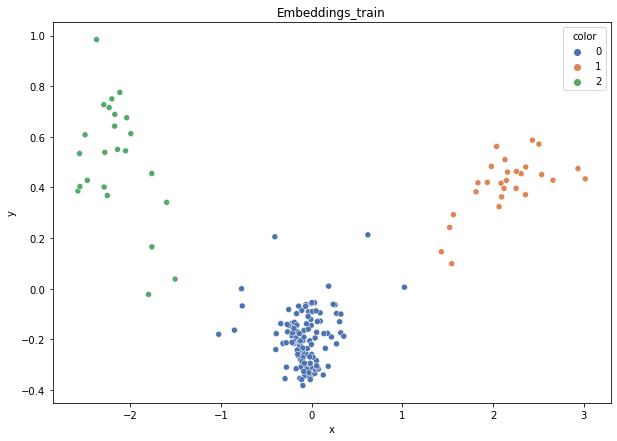

DT-f1-new-features: 0.933
DT-f1-old+new-features: 0.964
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.894
DT-gmean-old+new-features: 0.941
DT-gmean-old-features: 0.884
KNN-f1-new-features: 1.0
KNN-f1-old+new-features: 0.964
KNN-f1-old-features: 0.964
KNN-gmean-new-features: 1.0
KNN-gmean-old+new-features: 0.941
KNN-gmean-old-features: 0.941
LDA-f1-new-features: 0.964
LDA-f1-old+new-features: 0.964
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.941
LDA-gmean-old+new-features: 0.941
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 1.0
QDA-f1-old+new-features: 1.0
QDA-f1-old-features: 0.964
QDA-gmean-new-features: 1.0
QDA-gmean-old+new-features: 1.0
QDA-gmean-old-features: 0.941
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.894


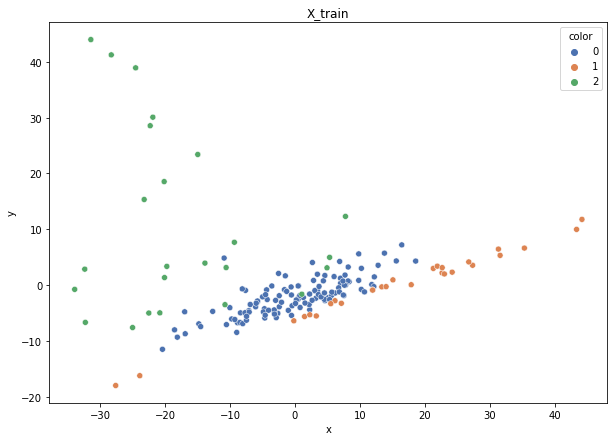

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


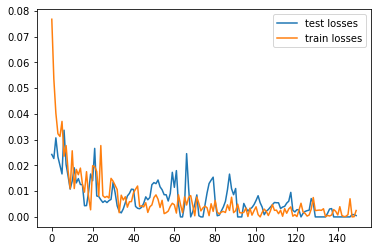

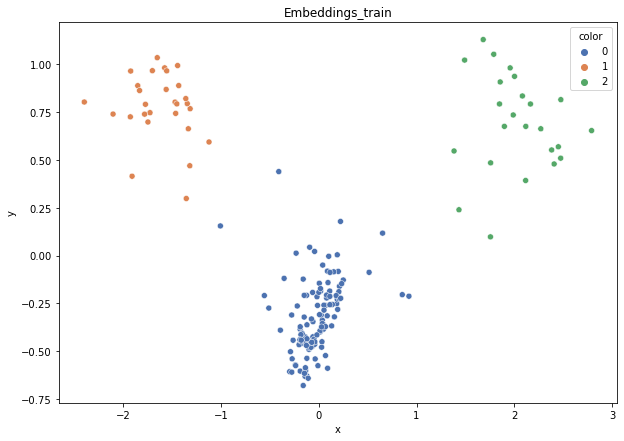

DT-f1-new-features: 1.0
DT-f1-old+new-features: 1.0
DT-f1-old-features: 0.947
DT-gmean-new-features: 1.0
DT-gmean-old+new-features: 1.0
DT-gmean-old-features: 0.977
KNN-f1-new-features: 0.969
KNN-f1-old+new-features: 1.0
KNN-f1-old-features: 0.972
KNN-gmean-new-features: 0.95
KNN-gmean-old+new-features: 1.0
KNN-gmean-old-features: 0.989
LDA-f1-new-features: 1.0
LDA-f1-old+new-features: 0.969
LDA-f1-old-features: 0.933
LDA-gmean-new-features: 1.0
LDA-gmean-old+new-features: 0.95
LDA-gmean-old-features: 0.894
QDA-f1-new-features: 1.0
QDA-f1-old+new-features: 0.969
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 1.0
QDA-gmean-old+new-features: 0.95
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 1.0
RF24-f1-old+new-features: 1.0
RF24-f1-old-features: 0.969
RF24-gmean-new-features: 1.0
RF24-gmean-old+new-features: 1.0
RF24-gmean-old-features: 0.95


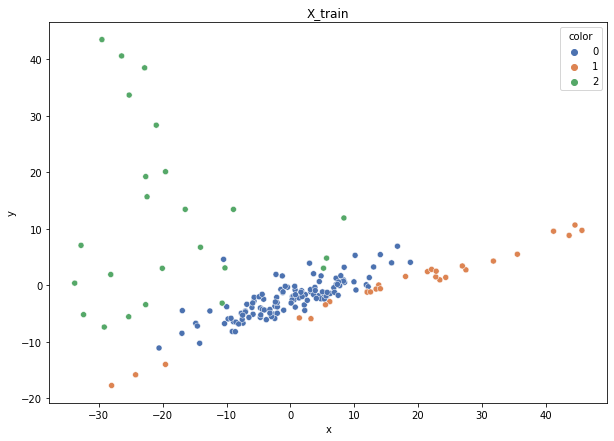

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


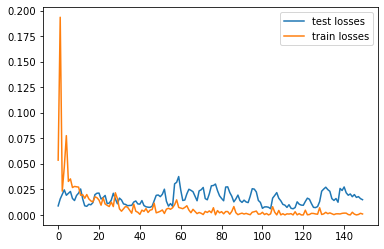

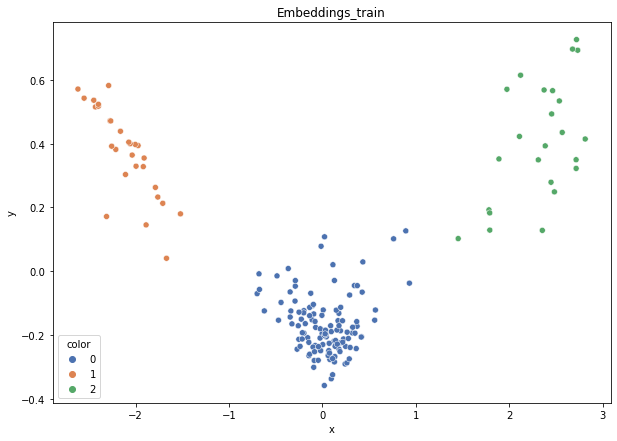

DT-f1-new-features: 0.941
DT-f1-old+new-features: 0.941
DT-f1-old-features: 0.905
DT-gmean-new-features: 0.977
DT-gmean-old+new-features: 0.977
DT-gmean-old-features: 0.92
KNN-f1-new-features: 0.941
KNN-f1-old+new-features: 0.878
KNN-f1-old-features: 0.902
KNN-gmean-new-features: 0.977
KNN-gmean-old+new-features: 0.909
KNN-gmean-old-features: 0.884
LDA-f1-new-features: 0.941
LDA-f1-old+new-features: 0.941
LDA-f1-old-features: 0.817
LDA-gmean-new-features: 0.977
LDA-gmean-old+new-features: 0.977
LDA-gmean-old-features: 0.725
QDA-f1-new-features: 0.913
QDA-f1-old+new-features: 0.972
QDA-f1-old-features: 0.936
QDA-gmean-new-features: 0.965
QDA-gmean-old+new-features: 0.989
QDA-gmean-old-features: 0.93
RF24-f1-new-features: 0.941
RF24-f1-old+new-features: 0.941
RF24-f1-old-features: 0.933
RF24-gmean-new-features: 0.977
RF24-gmean-old+new-features: 0.977
RF24-gmean-old-features: 0.894


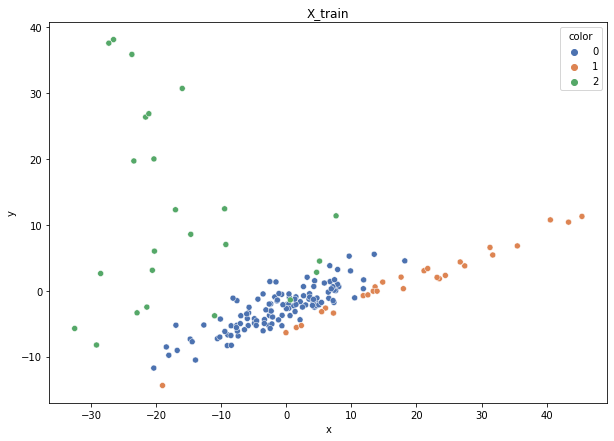

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


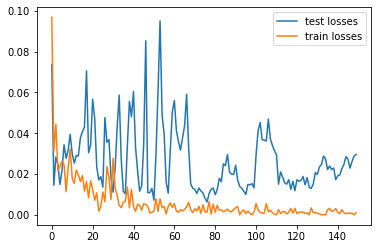

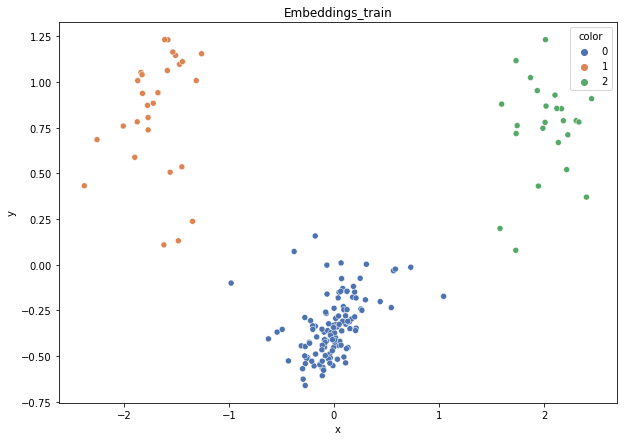

DT-f1-new-features: 0.941
DT-f1-old+new-features: 0.91
DT-f1-old-features: 0.902
DT-gmean-new-features: 0.977
DT-gmean-old+new-features: 0.928
DT-gmean-old-features: 0.884
KNN-f1-new-features: 0.913
KNN-f1-old+new-features: 0.913
KNN-f1-old-features: 0.941
KNN-gmean-new-features: 0.965
KNN-gmean-old+new-features: 0.965
KNN-gmean-old-features: 0.977
LDA-f1-new-features: 0.913
LDA-f1-old+new-features: 0.913
LDA-f1-old-features: 0.898
LDA-gmean-new-features: 0.965
LDA-gmean-old+new-features: 0.965
LDA-gmean-old-features: 0.841
QDA-f1-new-features: 0.913
QDA-f1-old+new-features: 0.913
QDA-f1-old-features: 0.969
QDA-gmean-new-features: 0.965
QDA-gmean-old+new-features: 0.965
QDA-gmean-old-features: 0.989
RF24-f1-new-features: 0.913
RF24-f1-old+new-features: 0.941
RF24-f1-old-features: 0.902
RF24-gmean-new-features: 0.965
RF24-gmean-old+new-features: 0.977
RF24-gmean-old-features: 0.884


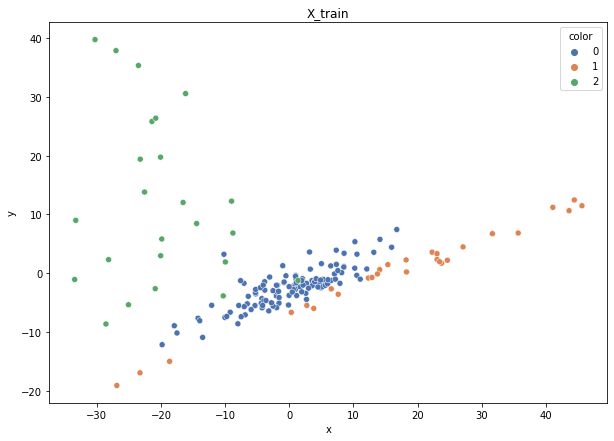

Class cardinalities: Counter({0: 120, 1: 28, 2: 24})
Weights: {0: 0.09722222222222222, 1: 0.41666666666666663, 2: 0.4861111111111111}


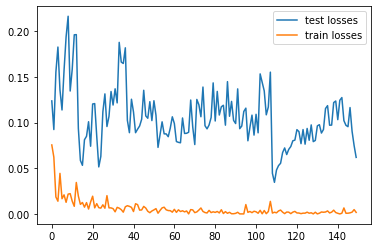

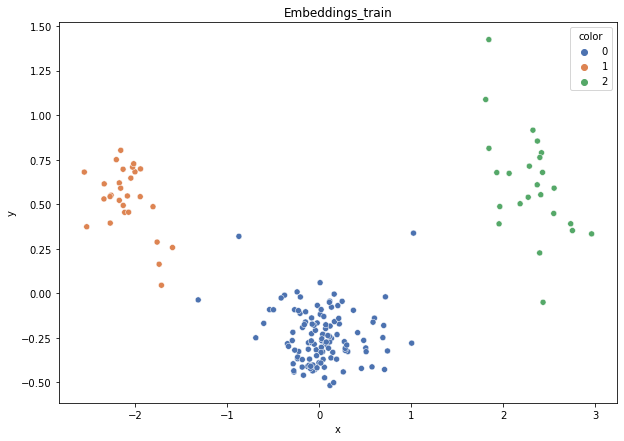

DT-f1-new-features: 0.893
DT-f1-old+new-features: 0.893
DT-f1-old-features: 0.893
DT-gmean-new-features: 0.864
DT-gmean-old+new-features: 0.864
DT-gmean-old-features: 0.864
KNN-f1-new-features: 0.923
KNN-f1-old+new-features: 0.923
KNN-f1-old-features: 0.873
KNN-gmean-new-features: 0.874
KNN-gmean-old+new-features: 0.874
KNN-gmean-old-features: 0.794
LDA-f1-new-features: 0.923
LDA-f1-old+new-features: 0.893
LDA-f1-old-features: 0.721
LDA-gmean-new-features: 0.874
LDA-gmean-old+new-features: 0.864
LDA-gmean-old-features: 0.598
QDA-f1-new-features: 0.923
QDA-f1-old+new-features: 0.873
QDA-f1-old-features: 0.895
QDA-gmean-new-features: 0.874
QDA-gmean-old+new-features: 0.794
QDA-gmean-old-features: 0.864
RF24-f1-new-features: 0.923
RF24-f1-old+new-features: 0.893
RF24-f1-old-features: 0.923
RF24-gmean-new-features: 0.874
RF24-gmean-old+new-features: 0.864
RF24-gmean-old-features: 0.874


In [12]:
result_dict = defaultdict(list)

safety_dict = defaultdict(list)

if test_all_ds:
    ds_names = dt_name_to_cols_to_encode.keys()
else:
    ds_names = [ds_name]
for dataset_name in ds_names:
# for dataset_name in list(datasets.keys()):
    print(dataset_name)
    result_dict["dataset"].append(dataset_name)
    fold_result_dict = defaultdict(list)
    
    safety_dict["dataset"].append(dataset_name)
    fold_safety_dict = defaultdict(list)

    X, y = datasets[dataset_name]['data'], datasets[dataset_name]['target']
    X_encoded, y = datasets[f"{dataset_name}_encoded"]['data'], datasets[f"{dataset_name}_encoded"]['target']
    
    skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
    n_splits = skf.get_n_splits(X, y)
    
    folds = []
    if test_on_all_folds:
        folds = skf.split(X, y)
    else:
        folds = list(skf.split(X, y))[1:2]
        
    for train_index, test_index in folds:
        X_train, X_test = X[train_index], X[test_index]
        X_train_norm, X_test_norm = standardize(X_train, X_test)
        y_train, y_test = y[train_index], y[test_index]
        
        
        X_train_enc, X_test_enc = X_encoded[train_index], X_encoded[test_index]
        X_train_enc, X_test_enc = standardize(X_train_enc, X_test_enc)
        
        
        # PCA X_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(X_train), y_train)
        plt.title("X_train")
        plt.show()
        
        weights = ex.weights_calculation_strategy1(X_train, y_train)
        cfg =  config[dataset_name]
        # pretrain ANN triplets
        embeddings_train, embeddings_test = ex.train_triplets(X_train_enc, y_train, X_test_enc, y_test, weights,cfg)
        
        s_dict = calc_safety5(embeddings_test, y_test)
        for k, v in s_dict.items():
            fold_safety_dict[f"emb-{k}"].append(v)
            
        s_dict = calc_safety5(X_test_enc, y_test)
        for k,v in s_dict.items():
            fold_safety_dict[f"raw-{k}"].append(v)
        
        # PCA embeddings_train
        pca = PCA(n_components=2)
        plot_embeddings(pca.fit_transform(embeddings_train), y_train)
        plt.title("Embeddings_train")
        plt.show()
        
        X_train_new = np.hstack([X_train_norm, embeddings_train])
        X_test_new = np.hstack([X_test_norm, embeddings_test])
        
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_norm, y_train)
            preds = clf.predict(X_test_norm)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(X_train_new, y_train)
            preds = clf.predict(X_test_new)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-old+new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-old+new-features"].append(gmean)
            
        classifiers = instantiate_classifiers()
        for clf_name, clf in classifiers.items():
            clf.fit(embeddings_train, y_train)
            preds = clf.predict(embeddings_test)

            gmean = gmean_score(y_test, preds)
            f1 = f1_score(y_test, preds, average='macro')
            fold_result_dict[f"{clf_name}-f1-new-features"].append(f1)
            fold_result_dict[f"{clf_name}-gmean-new-features"].append(gmean)
        for key in sorted(list(fold_result_dict.keys())):
            print(f"{key}: {np.round(fold_result_dict[key][-1],3)}")
            
    for k in fold_result_dict:
        result_dict[k].append(np.mean(fold_result_dict[k]))
        
    for k in fold_safety_dict:
        safety_dict[k].append(np.sum(fold_safety_dict[k]) / X.shape[0])

In [13]:
results_df = pd.DataFrame.from_dict(result_dict)

In [14]:
safety_df = pd.DataFrame.from_dict(safety_dict)

In [15]:
results_df

,dataset,RF24-f1-old-features,RF24-gmean-old-features,DT-f1-old-features,DT-gmean-old-features,KNN-f1-old-features,KNN-gmean-old-features,QDA-f1-old-features,QDA-gmean-old-features,LDA-f1-old-features,...,RF24-f1-new-features,RF24-gmean-new-features,DT-f1-new-features,DT-gmean-new-features,KNN-f1-new-features,KNN-gmean-new-features,QDA-f1-new-features,QDA-gmean-new-features,LDA-f1-new-features,LDA-gmean-new-features
0,cmc,0.514118,0.512655,0.467266,0.470278,0.422592,0.412867,0.508046,0.519498,0.488274,...,0.508359,0.503063,0.453563,0.455000,0.448182,0.439538,0.516129,0.515876,0.526742,0.518474
1,dermatology,0.964200,0.962295,0.949703,0.951222,0.937131,0.932309,0.777500,0.747057,0.958265,...,0.945208,0.941372,0.939136,0.935126,0.962720,0.959648,0.765959,0.297804,0.970940,0.969630
2,hayes-roth,0.852497,0.841131,0.851208,0.838449,0.672362,0.636136,0.637542,0.633175,0.559310,...,0.880121,0.874404,0.842914,0.832438,0.885025,0.878932,0.858718,0.849967,0.869865,0.863828
3,new_vehicle,0.957161,0.962521,0.896672,0.898498,0.912321,0.912341,0.969460,0.973731,0.939198,...,0.980653,0.980140,0.976636,0.975327,0.982226,0.981185,0.980477,0.983194,0.984323,0.984738
4,new_yeast,0.562953,0.338100,0.442388,0.282887,0.486925,0.408416,0.151335,0.045770,0.531617,...,0.518576,0.281893,0.437197,0.245240,0.487767,0.340553,0.513951,0.305606,0.537897,0.293929
5,1czysty-cut,0.934189,0.938694,0.935490,0.936512,0.945528,0.943824,0.814045,0.716022,0.264241,...,0.973053,0.973725,0.976182,0.976044,0.972541,0.970232,0.952866,0.970149,0.973590,0.986389
6,2delikatne-cut,0.761136,0.756883,0.724198,0.737376,0.699865,0.678350,0.658847,0.514531,0.273738,...,0.765773,0.759413,0.744880,0.746060,0.752169,0.742381,0.760557,0.798206,0.790095,0.805984
7,3mocniej-cut,0.560931,0.519703,0.504810,0.502048,0.508642,0.457700,0.274510,0.010000,0.274510,...,0.560566,0.493639,0.541243,0.526925,0.541293,0.510580,0.605316,0.641272,0.622743,0.588804
8,4delikatne-bezover-cut,0.820201,0.835313,0.796105,0.813035,0.767612,0.760887,0.793653,0.717321,0.268589,...,0.830000,0.837298,0.835932,0.836436,0.832684,0.824171,0.824374,0.895643,0.846492,0.880074
9,balance-scale,0.593905,0.092184,0.605016,0.416495,0.560676,0.089082,0.857046,0.916265,0.607652,...,0.949657,0.943813,0.879088,0.855719,0.942704,0.957757,0.939738,0.913386,0.953937,0.969108


In [16]:
safety_df[sorted(safety_df.filter(regex=("dataset|emb")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-borderline,emb-outlier,emb-rare,emb-safe
0,cmc,0.479973,0.101833,0.226748,0.191446
1,dermatology,0.098361,0.016393,0.019126,0.866120
2,hayes-roth,0.206250,0.018750,0.062500,0.712500
3,new_vehicle,0.017730,0.003546,0.008274,0.970449
4,new_yeast,0.417790,0.159030,0.173181,0.250000
5,1czysty-cut,0.019167,0.005000,0.006667,0.969167
6,2delikatne-cut,0.140833,0.025833,0.055833,0.777500
7,3mocniej-cut,0.210833,0.065000,0.080833,0.643333
8,4delikatne-bezover-cut,0.131667,0.015000,0.043333,0.810000
9,balance-scale,0.052800,0.008000,0.012800,0.926400


In [17]:
safety_df[sorted(safety_df.filter(regex=("dataset|raw")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,raw-borderline,raw-outlier,raw-rare,raw-safe
0,cmc,0.505092,0.117447,0.260692,0.116768
1,dermatology,0.464481,0.060109,0.144809,0.330601
2,hayes-roth,0.687500,0.031250,0.131250,0.150000
3,new_vehicle,0.255319,0.020095,0.053191,0.671395
4,new_yeast,0.415768,0.164420,0.174528,0.245283
5,1czysty-cut,0.131667,0.003333,0.015000,0.850000
6,2delikatne-cut,0.209167,0.010000,0.060833,0.720000
7,3mocniej-cut,0.232500,0.062500,0.079167,0.625833
8,4delikatne-bezover-cut,0.185833,0.010833,0.040833,0.762500
9,balance-scale,0.505600,0.064000,0.120000,0.310400


In [18]:
safety_df[sorted(safety_df.filter(regex=("dataset|.*safe")).columns)].style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,emb-safe,raw-safe
0,cmc,0.191446,0.116768
1,dermatology,0.866120,0.330601
2,hayes-roth,0.712500,0.150000
3,new_vehicle,0.970449,0.671395
4,new_yeast,0.250000,0.245283
5,1czysty-cut,0.969167,0.850000
6,2delikatne-cut,0.777500,0.720000
7,3mocniej-cut,0.643333,0.625833
8,4delikatne-bezover-cut,0.810000,0.762500
9,balance-scale,0.926400,0.310400


In [19]:
results_df.filter(regex=("dataset|RF24-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-f1-old-features,RF24-f1-old+new-features,RF24-f1-new-features
0,cmc,0.514118,0.509352,0.508359
1,dermatology,0.964200,0.953416,0.945208
2,hayes-roth,0.852497,0.880121,0.880121
3,new_vehicle,0.957161,0.981432,0.980653
4,new_yeast,0.562953,0.539269,0.518576
5,1czysty-cut,0.934189,0.972526,0.973053
6,2delikatne-cut,0.761136,0.749526,0.765773
7,3mocniej-cut,0.560931,0.562786,0.560566
8,4delikatne-bezover-cut,0.820201,0.822728,0.830000
9,balance-scale,0.593905,0.940015,0.949657


In [20]:
results_df.filter(regex=("dataset|RF24-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,RF24-gmean-old-features,RF24-gmean-old+new-features,RF24-gmean-new-features
0,cmc,0.512655,0.504221,0.503063
1,dermatology,0.962295,0.952781,0.941372
2,hayes-roth,0.841131,0.874404,0.874404
3,new_vehicle,0.962521,0.980918,0.980140
4,new_yeast,0.338100,0.290272,0.281893
5,1czysty-cut,0.938694,0.973712,0.973725
6,2delikatne-cut,0.756883,0.742834,0.759413
7,3mocniej-cut,0.519703,0.504959,0.493639
8,4delikatne-bezover-cut,0.835313,0.828242,0.837298
9,balance-scale,0.092184,0.928760,0.943813


In [21]:
results_df.filter(regex=("dataset|DT-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-f1-old-features,DT-f1-old+new-features,DT-f1-new-features
0,cmc,0.467266,0.465857,0.453563
1,dermatology,0.949703,0.936315,0.939136
2,hayes-roth,0.851208,0.867141,0.842914
3,new_vehicle,0.896672,0.972820,0.976636
4,new_yeast,0.442388,0.435324,0.437197
5,1czysty-cut,0.935490,0.976182,0.976182
6,2delikatne-cut,0.724198,0.741722,0.744880
7,3mocniej-cut,0.504810,0.537338,0.541243
8,4delikatne-bezover-cut,0.796105,0.824795,0.835932
9,balance-scale,0.605016,0.874465,0.879088


In [22]:
results_df.filter(regex=("dataset|DT-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,DT-gmean-old-features,DT-gmean-old+new-features,DT-gmean-new-features
0,cmc,0.470278,0.466333,0.455000
1,dermatology,0.951222,0.933676,0.935126
2,hayes-roth,0.838449,0.858619,0.832438
3,new_vehicle,0.898498,0.972515,0.975327
4,new_yeast,0.282887,0.245542,0.245240
5,1czysty-cut,0.936512,0.976044,0.976044
6,2delikatne-cut,0.737376,0.750473,0.746060
7,3mocniej-cut,0.502048,0.530157,0.526925
8,4delikatne-bezover-cut,0.813035,0.825383,0.836436
9,balance-scale,0.416495,0.851659,0.855719


In [23]:
results_df.filter(regex=("dataset|KNN-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-f1-old-features,KNN-f1-old+new-features,KNN-f1-new-features
0,cmc,0.422592,0.422950,0.448182
1,dermatology,0.937131,0.968675,0.962720
2,hayes-roth,0.672362,0.875148,0.885025
3,new_vehicle,0.912321,0.978254,0.982226
4,new_yeast,0.486925,0.504654,0.487767
5,1czysty-cut,0.945528,0.979796,0.972541
6,2delikatne-cut,0.699865,0.725509,0.752169
7,3mocniej-cut,0.508642,0.517598,0.541293
8,4delikatne-bezover-cut,0.767612,0.785402,0.832684
9,balance-scale,0.560676,0.935296,0.942704


In [24]:
results_df.filter(regex=("dataset|KNN-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,KNN-gmean-old-features,KNN-gmean-old+new-features,KNN-gmean-new-features
0,cmc,0.412867,0.413561,0.439538
1,dermatology,0.932309,0.966637,0.959648
2,hayes-roth,0.636136,0.869493,0.878932
3,new_vehicle,0.912341,0.978161,0.981185
4,new_yeast,0.408416,0.425380,0.340553
5,1czysty-cut,0.943824,0.984411,0.970232
6,2delikatne-cut,0.678350,0.714790,0.742381
7,3mocniej-cut,0.457700,0.467924,0.510580
8,4delikatne-bezover-cut,0.760887,0.776595,0.824171
9,balance-scale,0.089082,0.940400,0.957757


In [25]:
results_df.filter(regex=("dataset|QDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-f1-old-features,QDA-f1-old+new-features,QDA-f1-new-features
0,cmc,0.508046,0.505309,0.516129
1,dermatology,0.777500,0.866533,0.765959
2,hayes-roth,0.637542,0.854090,0.858718
3,new_vehicle,0.969460,0.982786,0.980477
4,new_yeast,0.151335,0.333623,0.513951
5,1czysty-cut,0.814045,0.955433,0.952866
6,2delikatne-cut,0.658847,0.760924,0.760557
7,3mocniej-cut,0.274510,0.580865,0.605316
8,4delikatne-bezover-cut,0.793653,0.825465,0.824374
9,balance-scale,0.857046,0.938723,0.939738


In [26]:
results_df.filter(regex=("dataset|QDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,QDA-gmean-old-features,QDA-gmean-old+new-features,QDA-gmean-new-features
0,cmc,0.519498,0.513735,0.515876
1,dermatology,0.747057,0.855040,0.297804
2,hayes-roth,0.633175,0.845763,0.849967
3,new_vehicle,0.973731,0.983838,0.983194
4,new_yeast,0.045770,0.135425,0.305606
5,1czysty-cut,0.716022,0.972485,0.970149
6,2delikatne-cut,0.514531,0.804438,0.798206
7,3mocniej-cut,0.010000,0.621260,0.641272
8,4delikatne-bezover-cut,0.717321,0.901220,0.895643
9,balance-scale,0.916265,0.909211,0.913386


In [27]:
results_df.filter(regex=("dataset|LDA-f1*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-f1-old-features,LDA-f1-old+new-features,LDA-f1-new-features
0,cmc,0.488274,0.508978,0.526742
1,dermatology,0.958265,0.964564,0.970940
2,hayes-roth,0.559310,0.864821,0.869865
3,new_vehicle,0.939198,0.982776,0.984323
4,new_yeast,0.531617,0.533256,0.537897
5,1czysty-cut,0.264241,0.972905,0.973590
6,2delikatne-cut,0.273738,0.784872,0.790095
7,3mocniej-cut,0.274510,0.626604,0.622743
8,4delikatne-bezover-cut,0.268589,0.848030,0.846492
9,balance-scale,0.607652,0.954631,0.953937


In [28]:
results_df.filter(regex=("dataset|LDA-gmean*")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-gmean-old-features,LDA-gmean-old+new-features,LDA-gmean-new-features
0,cmc,0.468850,0.498385,0.518474
1,dermatology,0.957095,0.963588,0.969630
2,hayes-roth,0.526678,0.858728,0.863828
3,new_vehicle,0.944372,0.983225,0.984738
4,new_yeast,0.283300,0.288973,0.293929
5,1czysty-cut,0.014473,0.985980,0.986389
6,2delikatne-cut,0.009984,0.799521,0.805984
7,3mocniej-cut,0.010000,0.592840,0.588804
8,4delikatne-bezover-cut,0.023236,0.880396,0.880074
9,balance-scale,0.096584,0.975416,0.969108


In [53]:
results_df.filter(regex=("dataset|LDA-f1-old-features|LDA-f1-new-features")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-f1-old-features,LDA-f1-new-features
0,cmc,0.488274,0.526742
1,dermatology,0.958265,0.970940
2,hayes-roth,0.559310,0.869865
3,new_vehicle,0.939198,0.984323
4,new_yeast,0.531617,0.537897
5,1czysty-cut,0.264241,0.973590
6,2delikatne-cut,0.273738,0.790095
7,3mocniej-cut,0.274510,0.622743
8,4delikatne-bezover-cut,0.268589,0.846492
9,balance-scale,0.607652,0.953937


In [52]:
results_df.filter(regex=("dataset|LDA-gmean-old-features|LDA-gmean-new-features")).style.highlight_max(color = 'lightgreen', axis = 1)

,dataset,LDA-gmean-old-features,LDA-gmean-new-features
0,cmc,0.468850,0.518474
1,dermatology,0.957095,0.969630
2,hayes-roth,0.526678,0.863828
3,new_vehicle,0.944372,0.984738
4,new_yeast,0.283300,0.293929
5,1czysty-cut,0.014473,0.986389
6,2delikatne-cut,0.009984,0.805984
7,3mocniej-cut,0.010000,0.588804
8,4delikatne-bezover-cut,0.023236,0.880074
9,balance-scale,0.096584,0.969108


In [81]:
def highlight_max(s):
    is_min = s == s.values[1:].max()
      
    return ['font-weight: bold' if cell else '' 
            for cell in is_min]

In [85]:
results_df.filter(regex=("dataset|LDA-f1-old-features|LDA-f1-new-features")).style.apply(highlight_max, axis=1)

,dataset,LDA-f1-old-features,LDA-f1-new-features
0,cmc,0.488274,0.526742
1,dermatology,0.958265,0.970940
2,hayes-roth,0.559310,0.869865
3,new_vehicle,0.939198,0.984323
4,new_yeast,0.531617,0.537897
5,1czysty-cut,0.264241,0.973590
6,2delikatne-cut,0.273738,0.790095
7,3mocniej-cut,0.274510,0.622743
8,4delikatne-bezover-cut,0.268589,0.846492
9,balance-scale,0.607652,0.953937


In [86]:
results_df.filter(regex=("dataset|LDA-gmean-old-features|LDA-gmean-new-features")).style.apply(highlight_max, axis=1)

,dataset,LDA-gmean-old-features,LDA-gmean-new-features
0,cmc,0.468850,0.518474
1,dermatology,0.957095,0.969630
2,hayes-roth,0.526678,0.863828
3,new_vehicle,0.944372,0.984738
4,new_yeast,0.283300,0.293929
5,1czysty-cut,0.014473,0.986389
6,2delikatne-cut,0.009984,0.805984
7,3mocniej-cut,0.010000,0.588804
8,4delikatne-bezover-cut,0.023236,0.880074
9,balance-scale,0.096584,0.969108


In [31]:
import seaborn as sns

In [34]:
lda_f1 = results_df.filter(regex=("dataset|LDA-f1*"))

In [35]:
lda_f1

,dataset,LDA-f1-old-features,LDA-f1-old+new-features,LDA-f1-new-features
0,cmc,0.488274,0.508978,0.526742
1,dermatology,0.958265,0.964564,0.970940
2,hayes-roth,0.559310,0.864821,0.869865
3,new_vehicle,0.939198,0.982776,0.984323
4,new_yeast,0.531617,0.533256,0.537897
5,1czysty-cut,0.264241,0.972905,0.973590
6,2delikatne-cut,0.273738,0.784872,0.790095
7,3mocniej-cut,0.274510,0.626604,0.622743
8,4delikatne-bezover-cut,0.268589,0.848030,0.846492
9,balance-scale,0.607652,0.954631,0.953937


In [36]:
lda_f1_sns = {
    "dataset": [],
    "features": [],
    "f1_macro": [],
}

for idx, row in lda_f1.iterrows():
    lda_f1_sns['dataset'].append(row['dataset'])
    lda_f1_sns['features'].append('Original representation')
    lda_f1_sns['f1_macro'].append(row['LDA-f1-old-features'])
    
    lda_f1_sns['dataset'].append(row['dataset'])
    lda_f1_sns['features'].append('New representation')
    lda_f1_sns['f1_macro'].append(row['LDA-f1-new-features'])

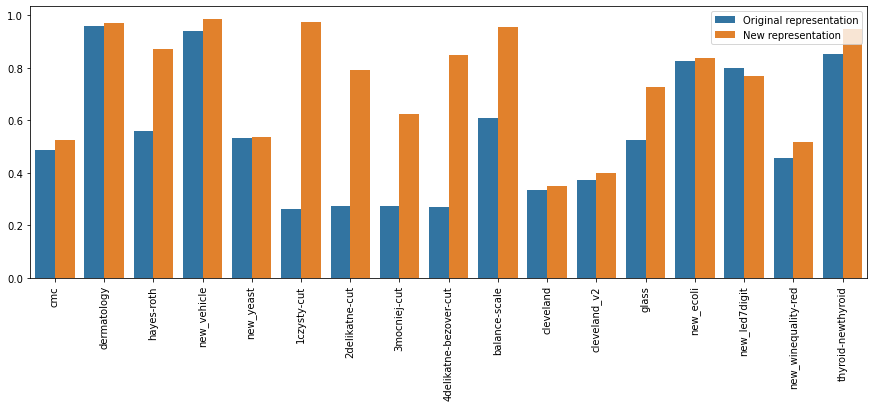

In [51]:
plt.figure(figsize=(15,5))
sns.barplot(x='dataset', y='f1_macro', hue='features',data=lda_f1_sns)
plt.xticks(rotation = 90)
plt.show()

In [95]:
lda_f1.columns = ['dataset', 'LDA f1 macro (original representation)', '_', 'LDA f1 macro (new representation)']

In [107]:
lda_f1[lda_f1.columns[[0,1,3]]].style.apply(highlight_max, axis=1)

,dataset,LDA f1 macro (original representation),LDA f1 macro (new representation)
0,cmc,0.488274,0.526742
1,dermatology,0.958265,0.970940
2,hayes-roth,0.559310,0.869865
3,new_vehicle,0.939198,0.984323
4,new_yeast,0.531617,0.537897
5,1czysty-cut,0.264241,0.973590
6,2delikatne-cut,0.273738,0.790095
7,3mocniej-cut,0.274510,0.622743
8,4delikatne-bezover-cut,0.268589,0.846492
9,balance-scale,0.607652,0.953937


In [108]:
lda_gmean = results_df.filter(regex=("dataset|LDA-gmean-old-features|LDA-gmean-new-features"))

In [109]:
lda_gmean.columns = ['dataset', 'LDA gmean (original representation)', 'LDA gmean (new representation)']

In [111]:
lda_gmean.style.apply(highlight_max, axis=1)

,dataset,LDA gmean (original representation),LDA gmean (new representation)
0,cmc,0.468850,0.518474
1,dermatology,0.957095,0.969630
2,hayes-roth,0.526678,0.863828
3,new_vehicle,0.944372,0.984738
4,new_yeast,0.283300,0.293929
5,1czysty-cut,0.014473,0.986389
6,2delikatne-cut,0.009984,0.805984
7,3mocniej-cut,0.010000,0.588804
8,4delikatne-bezover-cut,0.023236,0.880074
9,balance-scale,0.096584,0.969108


In [113]:
safness_df = safety_df[sorted(safety_df.filter(regex=("dataset|.*safe")).columns)]

In [114]:
safness_df

,dataset,emb-safe,raw-safe
0,cmc,0.191446,0.116768
1,dermatology,0.866120,0.330601
2,hayes-roth,0.712500,0.150000
3,new_vehicle,0.970449,0.671395
4,new_yeast,0.250000,0.245283
5,1czysty-cut,0.969167,0.850000
6,2delikatne-cut,0.777500,0.720000
7,3mocniej-cut,0.643333,0.625833
8,4delikatne-bezover-cut,0.810000,0.762500
9,balance-scale,0.926400,0.310400


In [117]:
safness_df.columns = ['dataset', 'safeness of new representation', 'safeness of original representation']

In [118]:
safness_df.style.apply(highlight_max, axis=1)

,dataset,safeness of new representation,safeness of original representation
0,cmc,0.191446,0.116768
1,dermatology,0.866120,0.330601
2,hayes-roth,0.712500,0.150000
3,new_vehicle,0.970449,0.671395
4,new_yeast,0.250000,0.245283
5,1czysty-cut,0.969167,0.850000
6,2delikatne-cut,0.777500,0.720000
7,3mocniej-cut,0.643333,0.625833
8,4delikatne-bezover-cut,0.810000,0.762500
9,balance-scale,0.926400,0.310400
